# 📘 Notebook: NLP_Case study 2_Preprocessing.ipynb

In [1]:
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from transformers import AutoTokenizer
from nltk.tokenize import word_tokenize
import logging
import math
from tqdm import tqdm
from joblib import Parallel, delayed
from nltk.corpus import wordnet
from nltk import word_tokenize, pos_tag

In [2]:
# ISO Latin-1 encoding
df = pd.read_csv("Sentiment_Data.csv", encoding='iso-8859-1')

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
# Mapping 5-class sentiment to 3-class sentiment
sentiment_mapping = {
    'Strong_Pos': 'positive',
    'Mild_Pos': 'positive',
    'Neutral': 'neutral',
    'Mild_Neg': 'negative',
    'Strong_Neg': 'negative'
}

# Apply mapping to target column
df['Sentiment_3_Class'] = df['Sentiment'].map(sentiment_mapping)

# Optional: check value counts
print(df['Sentiment_3_Class'].value_counts())


Sentiment_3_Class
positive    297704
neutral      77016
negative     76612
Name: count, dtype: int64


In [5]:
# Drop the original 5-class sentiment column
df.drop(columns=['Sentiment'], inplace=True)

# Rename the 3-class column to 'Sentiment'
df.rename(columns={'Sentiment_3_Class': 'Sentiment'}, inplace=True)

# Optional: check the result
print(df.head())


                                               Tweet Sentiment
0  @_angelica_toy Happy Anniversary!!!....The Day...  positive
1  @McfarlaneGlenda Happy Anniversary!!!....The D...  positive
2  @thevivafrei @JustinTrudeau Happy Anniversary!...  positive
3  @NChartierET Happy Anniversary!!!....The Day t...  positive
4  @tabithapeters05 Happy Anniversary!!!....The D...  positive


In [6]:
df.sample(10)

,Tweet,Sentiment
390084,The European Freedom Convoy is truckin'! https...,positive
366074,A few rays of Light in this convoy of Darkness...,negative
82079,"@AndrewLawton No, his police just beat protest...",negative
46234,"Poilievre stands by Freedom Convoy support, bu...",positive
198164,@PresidenteMCM Freedom Convoy disrupted your l...,positive
397515,Fiery exchange between Conservatives and Liber...,positive
247256,The irony! Trudeau said martial Law is necessa...,positive
289662,'This could cost him his job': Only 16% of Can...,positive
124740,@Madison46108374 @smalls96 @covid_parent @IanD...,positive
450270,"Marie Colvin Convoy for Freedom in Syria,Convo...",positive


In [7]:
df['Sentiment'].value_counts()

Sentiment
positive    297704
neutral      77016
negative     76612
Name: count, dtype: int64

In [8]:
df.duplicated().sum()

45

In [9]:
df = df.drop_duplicates()

In [10]:
df.duplicated().sum()

0

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 451287 entries, 0 to 451331
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Tweet      451286 non-null  object
 1   Sentiment  451287 non-null  object
dtypes: object(2)
memory usage: 10.3+ MB


In [12]:
df['Sentiment'].value_counts()

Sentiment
positive    297665
neutral      77013
negative     76609
Name: count, dtype: int64

In [13]:
df.isnull().sum()

Tweet        1
Sentiment    0
dtype: int64

In [14]:
df.sample()

,Tweet,Sentiment
171563,@janelleybelley3 @SarahRyanYEG It's quite some...,positive


## Before we do any preprocessing , lets just explore our dataset and identify how many impurities we have

In [15]:
import re
import pandas as pd

def check_preprocessing_targets(df, text_col='Tweet', slang_dict=None):
    """
    Checks if original text column contains patterns like emoji, URL, mentions, hashtags, etc.
    Returns a summary count for each pattern.
    """

    url_pattern = re.compile(r"http\S+|www\S+|https\S+")
    mention_pattern = re.compile(r"@\w+")
    hashtag_pattern = re.compile(r"#\w+")
    emoji_pattern = re.compile(
        "[" u"\U0001F600-\U0001F64F"
             u"\U0001F300-\U0001F5FF"
             u"\U0001F680-\U0001F6FF"
             u"\U0001F1E0-\U0001F1FF" "]+", flags=re.UNICODE)
    number_pattern = re.compile(r"\d+")
    date_pattern = re.compile(r"\b\d{1,2}[/-]\d{1,2}[/-]\d{2,4}\b")
    duration_pattern = re.compile(r"\b\d+\s?(hours?|days?|weeks?|mins?|minutes?|24/7)\b", flags=re.IGNORECASE)
    rating_pattern = re.compile(r"\b\d{1,2}/10\b")
    underscore_pattern = re.compile(r"_")

    def contains_slang(text):
        if slang_dict is None:
            return False
        return any(word in slang_dict for word in str(text).split())

    summary = {
        'URLs': df[text_col].apply(lambda x: bool(url_pattern.search(str(x)))).sum(),
        'Mentions (@)': df[text_col].apply(lambda x: bool(mention_pattern.search(str(x)))).sum(),
        'Hashtags (#)': df[text_col].apply(lambda x: bool(hashtag_pattern.search(str(x)))).sum(),
        'Emojis': df[text_col].apply(lambda x: bool(emoji_pattern.search(str(x)))).sum(),
        'Numbers': df[text_col].apply(lambda x: bool(number_pattern.search(str(x)))).sum(),
        'Dates': df[text_col].apply(lambda x: bool(date_pattern.search(str(x)))).sum(),
        'Durations': df[text_col].apply(lambda x: bool(duration_pattern.search(str(x)))).sum(),
        'Ratings (/10)': df[text_col].apply(lambda x: bool(rating_pattern.search(str(x)))).sum(),
        'Underscores': df[text_col].apply(lambda x: bool(underscore_pattern.search(str(x)))).sum(),
        'Slang': df[text_col].apply(contains_slang).sum() if slang_dict else 'Skipped',
    }

    return pd.DataFrame.from_dict(summary, orient='index', columns=['Count']).sort_values(by='Count', ascending=False)


In [16]:
slang_dict = {
    "u": "you",
    "ur": "your",
    "r": "are",
    "wht":'what',
    "lol": "laughing out loud",
    "lmao": "laughing my ass off",
    "rofl": "rolling on the floor laughing",
    "omg": "oh my god",
    "idk": "i don't know",
    "btw": "by the way",
    "imo": "in my opinion",
    "imho": "in my humble opinion",
    "brb": "be right back",
    "ttyl": "talk to you later",
    "smh": "shaking my head",
    "tbh": "to be honest",
    "dm": "direct message",
    "irl": "in real life",
    "jk": "just kidding",
    "afk": "away from keyboard",
    "np": "no problem",
    "thx": "thanks",
    "ty": "thank you",
    "yw": "you’re welcome",
    "bff": "best friends forever",
    "bday": "birthday",
    "gr8": "great",
    "plz": "please",
    "wtf": "what the fuck",
    "wth": "what the hell",
    "bcoz": "because",
    "coz": "because",
    "cya": "see you",
    "msg": "message",
    "fyi": "for your information",
    "asap": "as soon as possible",
    "atm": "at the moment",
    "bbl": "be back later",
    "cu": "see you",
    "gg": "good game",
    "gl": "good luck",
    "hf": "have fun",
    "hmu": "hit me up",
    "ikr": "i know right"
}

In [17]:
check_preprocessing_targets(df, text_col='Tweet', slang_dict=slang_dict)


,Count
Numbers,280647
URLs,224196
Mentions (@),211489
Hashtags (#),139493
Underscores,32295
Durations,4488
Slang,3164
Dates,973
Ratings (/10),47
Emojis,0


In [18]:
# Step 1: Split first
X = df['Tweet']
y = df['Sentiment']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [19]:
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, stratify=y_test, test_size=0.5, random_state=42)

In [20]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)
print(X_val.shape)
print(y_val.shape)

(361029,)
(45129,)
(361029,)
(45129,)
(45129,)
(45129,)


In [21]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)
print(X_val.shape)
print(y_val.shape)

(361029,)
(45129,)
(361029,)
(45129,)
(45129,)
(45129,)


In [22]:
# Step 2: Combine X_train and y_train for sampling
train_df = pd.DataFrame({'Tweet': X_train, 'Sentiment': y_train})

In [23]:
train_df.value_counts('Sentiment')

Sentiment
positive    238132
neutral      61610
negative     61287
Name: count, dtype: int64

In [24]:

# Sample 30000 examples from validation set
val_sample_idx = X_val.sample(n=30000, random_state=40).index
X_val = X_val.loc[val_sample_idx].reset_index(drop=True)
y_val = y_val.loc[val_sample_idx].reset_index(drop=True)

# Sample 20000 examples from test set
test_sample_idx = X_test.sample(n=20000, random_state=50).index
X_test = X_test.loc[test_sample_idx].reset_index(drop=True)
y_test = y_test.loc[test_sample_idx].reset_index(drop=True)

In [25]:
# Step 2: Combine X_train and y_train for sampling
train_df = pd.DataFrame({'Tweet': X_train, 'Sentiment': y_train})

In [26]:
y_train.value_counts()

Sentiment
positive    238132
neutral      61610
negative     61287
Name: count, dtype: int64

In [27]:
from sklearn.utils import resample

# Assuming your DataFrame is called `df`
min_class_size = 61287

# Undersample each class to match the smallest class
train_df = (
    train_df.groupby('Sentiment')
      .apply(lambda x: x.sample(n=min_class_size, random_state=42))
      .reset_index(drop=True)
)

C:\Users\harsh\AppData\Local\Temp\ipykernel_24232\2468175336.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=min_class_size, random_state=42))


In [28]:
y_val.value_counts()

Sentiment
positive    19768
neutral      5138
negative     5094
Name: count, dtype: int64

In [29]:
X_val.sample()

25012    @Kolmen1989 @QanonAnonymous I hope the "Freedo...
Name: Tweet, dtype: object

In [30]:
val_df = pd.DataFrame({'Tweet': X_val, 'Sentiment': y_val})
val_df = (
    val_df.groupby("Sentiment", group_keys=False)
          .apply(lambda x: x.sample(n=5000, random_state=42))
          .reset_index(drop=True)
)
X_val = val_df["Tweet"]
y_val = val_df["Sentiment"]

C:\Users\harsh\AppData\Local\Temp\ipykernel_24232\1373242052.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=5000, random_state=42))


In [31]:
y_val.value_counts()

Sentiment
negative    5000
neutral     5000
positive    5000
Name: count, dtype: int64

In [32]:
train_df.value_counts('Sentiment')

Sentiment
negative    61287
neutral     61287
positive    61287
Name: count, dtype: int64

In [33]:
# Step 4: Separate again
X_train= train_df['Tweet']
y_train= train_df['Sentiment']

In [34]:
# to comapre results after preprocessing
X_train_backup = X_train.copy()
y_train_backup = y_train.copy()

In [35]:
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
X_val = pd.DataFrame(X_val)

In [36]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print(X_val.shape)
print(y_val.shape)


(183861, 1)
(183861,)
(20000, 1)
(20000,)
(15000, 1)
(15000,)


## Basic PreProcessing

In [37]:
X_train.head()

,Tweet
0,Ottawa Police Chief swears there will be no re...
1,Paris police ban French âFreedom Convoyâ d...
2,@CandiceBergenMP Are you for the mandates or n...
3,âFreedom Convoyâ protest: Ottawa police pr...
4,#FreedomConvoy Preemptive SOS Press Conference...


In [38]:
def clean_tweet(tweet):
    tweet = str(tweet).lower()
    tweet = re.sub(r"@\S+", '', tweet)  # remove mentions
    tweet = re.sub(r"http\S+|www\S+|https\S+", '', tweet)  # remove URLs
    tweet = re.sub(r"#", '', tweet)  # remove hashtag #
    tweet = re.sub(r"[^\w\s']", ' ', tweet)  # keep words, spaces, and apostrophes
    tweet = re.sub(r'\s+', ' ', tweet).strip()  # remove extra spaces
    return tweet


## Numbers Handling

In [39]:
def smart_number_handler(text):

    # Replace emotional ratings like "0/10" or "10/10"
    text = re.sub(r'\b\d{1,2}/10\b', ' <rating> ', text)

    # Replace durations like "3 hours", "2 days", "24/7"
    text = re.sub(r'\b\d+\s?(hours?|days?|weeks?|mins?|minutes?|24/7)\b', ' <duration> ', text, flags=re.IGNORECASE)

    # Replace dates like "12/03/2022" or "1-1-21"
    text = re.sub(r'\b\d{1,2}[/-]\d{1,2}[/-]\d{2,4}\b', ' <date> ', text)

    # Replace percentages like "90%"
    text = re.sub(r'\b\d+%|\d+\spercent\b', ' <percent> ', text, flags=re.IGNORECASE)

    # Replace currency values like "$200", "€30", "£50.00"
    text = re.sub(r'[$€£]\s?\d+(\.\d+)?', ' <money> ', text)

    # Remove numbers expect for years 1900 - 2100
    text = re.sub(r'\b(?!19\d{2}\b|20\d{2}\b|2100\b)\d+\b', '', text)

    return text


## Emoji -> Text emotions (like happy_smiley_face)

In [40]:
pip install emoji

Note: you may need to restart the kernel to use updated packages.


In [41]:
import emoji

def convert_emojis_to_text(text):
    return emoji.demojize(text, language='en')

def simplify_emoji_text(text):
    text = convert_emojis_to_text(text)
    text = text.replace(":", "")  # remove colons
    text = text.replace("_", " ")  # optional: make it tokenizer friendly
    return text


## Slang and Abbrevation *Dictionary*

## Slang replaceing

In [42]:
def replace_slangs(text):
    words = text.split()
    return ' '.join([slang_dict[word] if word in slang_dict else word for word in words])

## Spell Check

In [43]:
from symspellpy import SymSpell, Verbosity
import importlib.resources

# Initialize SymSpell only once (outside the function)
sym_spell = SymSpell(max_dictionary_edit_distance=2, prefix_length=7)
dictionary_path = importlib.resources.files("symspellpy") / "frequency_dictionary_en_82_765.txt"
sym_spell.load_dictionary(str(dictionary_path), term_index=0, count_index=1)

def correct_text_spelling(text):
    try:
        words = text.split()
        corrected_words = []
        for word in words:
            if "'" in word:  # skip contractions like "don't", "I'm"
                corrected_words.append(word)
            else:
                suggestions = sym_spell.lookup(word, Verbosity.CLOSEST, max_edit_distance=2)
                corrected = suggestions[0].term if suggestions else word
                corrected_words.append(corrected)
        return ' '.join(corrected_words)
    except Exception:
        return text


In [44]:
correct_text_spelling("i don't dont like tis weong speliing")

"i don't done like is wrong spelling"

## Negation Handeling

In [45]:
import spacy

In [46]:
# Load the SpaCy English model
nlp = spacy.load("en_core_web_sm")

def handle_negation(text):
    """
    Add 'NOT_' prefix to words that are negated.
    """
    
    doc = nlp(text)
    negated = set()

    # Identify the heads of negation dependencies
    for token in doc:
        if token.dep_ == "neg":
            negated.add(token.head.i)

    # Apply NOT_ prefix to negated tokens
    result = []
    for i, token in enumerate(doc):
        if i in negated:
            result.append("NOT_" + token.text)
        else:
            result.append(token.text)

    return " ".join(result)

In [47]:
tweet1 = "I don't like the food."
tweet2 = "They never support the idea."
tweet3 = "This is not bad at all."

print(handle_negation(tweet1))  # I do not NOT_like the food .
print(handle_negation(tweet2))  # They never NOT_support the idea .
print(handle_negation(tweet3))  # This is not NOT_bad at all .


I do n't NOT_like the food .
They never NOT_support the idea .
This NOT_is not bad at all .


## Main Pipeline Function

In [48]:
def preprocessing_pipeline(text):
    if not isinstance(text, str):
        return ""

    text = text.lower().strip()  # Optional: Normalize casing & whitespace early

    text = smart_number_handler(text)              # Convert smart numbers to textual forms
    text = simplify_emoji_text(text)               # Convert emojis to meaningful words (e.g., 😊 → "smile")
    text = text.replace("’", "'").replace("‘", "'").replace("“", '"').replace("”", '"')
    text = re.sub(r"[^\x00-\x7F]", ' ', text)     # Remove non-ASCII leftovers (e.g., fancy quotes, symbols)
    text = clean_tweet(text)                       # Remove mentions, hashtags, punctuation, excess spaces
    #text = handle_negation(text)                   # Tag negations BEFORE correction to preserve context ( remove negation handling as our transformers model can understand negations themselfs)
    text = replace_slangs(text)                    # Replace informal words (after spelling fix for max match)
    text = correct_text_spelling(text)             # Fix misspellings (after negations so “nott” becomes “not”)
    text = smart_number_handler(text)              # Run again if slang/spell fix introduces numbers

    return text

In [49]:
preprocessing_pipeline("I don't like the food thos is weong speliing 5/10 @pk ")

"i don't like the food this is wrong spelling rating"

In [50]:


tweets = X_train['Tweet'].astype(str).tolist()

# Use threads instead of processes
processed_tweets = Parallel(n_jobs=-1, prefer="threads")(
    delayed(preprocessing_pipeline)(tweet) for tweet in tqdm(tweets)
)

X_train['Cleaned_Tweet'] = processed_tweets

100%|██████████| 183861/183861 [01:32<00:00, 1998.37it/s]


## Lemmatization and Stop words

In [51]:
#  Download once, outside of the function
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\harsh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\harsh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\harsh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\harsh\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [52]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [53]:
# Helper for POS
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN  # default to noun

In [54]:
# Now safe for multiprocessing
def lemmatize_and_filter(text):
    if not isinstance(text, str):
        return ""

    tokens = word_tokenize(text)
    tagged_tokens = pos_tag(tokens)

    cleaned_tokens = []
    for token, tag in tagged_tokens:
        token_lower = token.lower()
        if token_lower not in stop_words or token.startswith("NOT_"):
            lemma = lemmatizer.lemmatize(token_lower, get_wordnet_pos(tag))
            cleaned_tokens.append(lemma)

    return " ".join(cleaned_tokens)


In [55]:
sample_text = "I do NOT_like eating apples because they are NOT_good and sometimes make me feel tired."

result = lemmatize_and_filter(sample_text)
print("Original:", sample_text)
print("Lemmatized & Stopword-filtered:", result)


Original: I do NOT_like eating apples because they are NOT_good and sometimes make me feel tired.
Lemmatized & Stopword-filtered: not_like eat apple not_good sometimes make feel tired .


In [56]:
# Convert column to list
texts = X_train['Cleaned_Tweet'].astype(str).tolist()

# Use threads for lightweight operations
lemmatized = Parallel(n_jobs=-1, prefer="threads")(
    delayed(lemmatize_and_filter)(text) for text in tqdm(texts)
)

# Store results
X_train['Final_Cleaned_Tweet'] = lemmatized

100%|██████████| 183861/183861 [03:55<00:00, 781.18it/s]


In [57]:
X_train.head().to_csv('sample.csv',index=False)

In [58]:
# ----------- For Test Set -------------
# Preprocessing
test_tweets = X_test['Tweet'].astype(str).tolist()
processed_test = Parallel(n_jobs=-1, prefer="threads")(
    delayed(preprocessing_pipeline)(tweet) for tweet in tqdm(test_tweets)
)
X_test['Cleaned_Tweet'] = processed_test

# Lemmatization
lemmatized_test = Parallel(n_jobs=-1, prefer="threads")(
    delayed(lemmatize_and_filter)(text) for text in tqdm(X_test['Cleaned_Tweet'].astype(str))
)
X_test['Final_Cleaned_Tweet'] = lemmatized_test

100%|██████████| 20000/20000 [00:25<00:00, 796.49it/s]


In [59]:
# ----------- For Validation Set -------------
# Preprocessing
val_tweets = X_val['Tweet'].astype(str).tolist()
processed_val = Parallel(n_jobs=-1, prefer="threads")(
    delayed(preprocessing_pipeline)(tweet) for tweet in tqdm(val_tweets)
)
X_val['Cleaned_Tweet'] = processed_val

# Lemmatization
lemmatized_val = Parallel(n_jobs=-1, prefer="threads")(
    delayed(lemmatize_and_filter)(text) for text in tqdm(X_val['Cleaned_Tweet'].astype(str))
)
X_val['Final_Cleaned_Tweet'] = lemmatized_val

100%|██████████| 15000/15000 [00:18<00:00, 806.76it/s]


In [60]:
X_val.head()

,Tweet,Cleaned_Tweet,Final_Cleaned_Tweet
0,Hey you stupid ass trolls that feel big going ...,hey you stupid ass trolls that feel big going ...,hey stupid as troll feel big go people donate ...
1,Ricky Schroder calls on American truckers to â...,ricky schroeder calls on american truckers to ...,ricky schroeder call american trucker shut was...
2,"In the latest episode of #FullComment, @Andrew...",in the latest episode of fullcomment joins to ...,late episode fullcomment join discuss freedomc...
3,"The erroneously self-christened ""Freedom"" Conv...",the erroneously self christened freedom convoy...,erroneously self christen freedom convoy fasci...
4,#FreedomConvoy2022 #FreedomConvoy #TruckersFor...,freedomconvoy2022 freedomconvoy truckersforfre...,freedomconvoy2022 freedomconvoy truckersforfre...


In [61]:
X_train.to_csv('X_train.csv',index=False)
X_test.to_csv('X_test.csv',index=False)
X_val.to_csv('X_val.csv',index=False)
y_train.to_csv('y_train.csv',index=False)
y_test.to_csv('y_test.csv',index=False)
y_val.to_csv('y_val.csv',index=False)

In [62]:
X_train.sample(5)

,Tweet,Cleaned_Tweet,Final_Cleaned_Tweet
80388,Kim Iversen: GoFundMe SEIZES Millions In Freed...,kim diverse gofundme seizes millions in freedo...,kim diverse gofundme seize million freedom con...
31886,This is how you fight fire with fire. \n\nHac...,this is how you fight fire with fire hackers l...,fight fire fire hacker leak name 'freedom conv...
58462,The remaining #OttawaOccupation\n are not prot...,the remaining ottawaoccupation are not protest...,remain ottawaoccupation protester 's cult dedi...
92144,"The U.S. Freedom Convoy, modeled after the Can...",the you a freedom convoy modelled after the ca...,freedom convoy model canadian trucker group pr...
144117,The Justice Centre is pleased to announce that...,the justice centre is pleased to announce that...,justice centre please announce crown stay char...


# 📘 Notebook: biLSTM_preprocessing.ipynb

## Further Preprocessing for BiLSTM model

In [58]:
import numpy as np
import pandas as pd
import torch
from collections import Counter
from itertools import chain
import torch.nn as nn

In [39]:
# Load preprocessed input (Final_Cleaned_Tweet only)
X_train = pd.read_csv('X_train.csv', usecols=['Final_Cleaned_Tweet'])
X_val   = pd.read_csv('X_val.csv', usecols=['Final_Cleaned_Tweet'])
X_test  = pd.read_csv('X_test.csv', usecols=['Final_Cleaned_Tweet'])

# Load labels
y_train = pd.read_csv('y_train.csv').squeeze()
y_val   = pd.read_csv('y_val.csv').squeeze()
y_test  = pd.read_csv('y_test.csv').squeeze()

In [40]:
print(X_train.shape, y_train.shape)
print(X_train['Final_Cleaned_Tweet'].iloc[0])

(183861, 1) (183861,)
ottawa police chief swears repeat last winter freedom convoy pkbnews


### Build the Vocabulary from Training Data
***text is already cleaned and lemmatized, Now split train data on spaces***

### Tokenization and Vocabulary

In [ ]:
# Tokenize training tweets
token_lists = X_train['Final_Cleaned_Tweet'].astype(str).apply(lambda x: x.split()).tolist()
all_tokens = list(chain.from_iterable(token_lists))
token_freq = Counter(all_tokens)

# Vocab setup
MAX_VOCAB = 20000
specials = ['<pad>', '<unk>']
vocab_tokens = specials + [tok for tok, _ in token_freq.most_common(MAX_VOCAB - len(specials))]

# This is the key line:
word2idx = {word: idx for idx, word in enumerate(vocab_tokens)}

# Special token indices (needed for padding & unknowns)
pad_idx = word2idx['<pad>']
unk_idx = word2idx['<unk>']

### Encode and pad tweets

***every sample has exactly 50 tokens(MAX_LEN)***
and Zeros (0) represent <pad>

In [42]:
tweet_lengths = X_train['Final_Cleaned_Tweet'].astype(str).apply(lambda x: len(x.split()))
print("Max tweet length:", tweet_lengths.max())
print("95th percentile:", tweet_lengths.quantile(0.95))
print("99th percentile:", tweet_lengths.quantile(0.99))
print("Average:", tweet_lengths.mean())

Max tweet length: 108
95th percentile: 26.0
99th percentile: 30.0
Average: 14.21446636317653


***99% of tweets are ≤ 30 tokens long, and almost zero truncation (only 1% of tweets are longer)***

In [ ]:
MAX_LEN = 32 #  Maximum length of input sequences   

def encode(text):
    tokens = text.split()  # split string to tokens here
    ids = [word2idx.get(tok, unk_idx) for tok in tokens]
    if len(ids) < MAX_LEN:
        ids += [pad_idx] * (MAX_LEN - len(ids))
    else:
        ids = ids[:MAX_LEN]
    return ids


In [44]:
X_train_encoded = X_train['Final_Cleaned_Tweet'].astype(str).apply(encode).tolist()

In [45]:
print("Encoded input shape (train):", len(X_train_encoded), "x", len(X_train_encoded[0]))
print("First encoded tweet (IDs):", X_train_encoded[0])

Encoded input shape (train): 183861 x 30
First encoded tweet (IDs): [6, 16, 295, 18324, 1180, 146, 778, 3, 2, 8297, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [46]:
X_val_encoded  = X_val['Final_Cleaned_Tweet'].astype(str).apply(encode).tolist()
X_test_encoded = X_test['Final_Cleaned_Tweet'].astype(str).apply(encode).tolist()

In [47]:
y_train.sample(5)

71502      neutral
373       negative
158212    positive
30350     negative
39125     negative
Name: Sentiment, dtype: object

### Define label encoding

In [48]:
label2id = {'negative': 0, 'neutral': 1, 'positive': 2}

### Apply mapping to all label splits

In [49]:
y_train = y_train.astype(str).map(label2id)
y_val   = y_val.astype(str).map(label2id)
y_test  = y_test.astype(str).map(label2id)

In [50]:
print("Train label counts:\n", y_train.value_counts())
print("Val label counts:\n", y_val.value_counts())
print("Test label counts:\n", y_test.value_counts())

Train label counts:
 Sentiment
0    61287
1    61287
2    61287
Name: count, dtype: int64
Val label counts:
 Sentiment
0    5000
1    5000
2    5000
Name: count, dtype: int64
Test label counts:
 Sentiment
2    13221
1     3416
0     3363
Name: count, dtype: int64


### convert to tensors

In [51]:
X_train_tensor = torch.tensor(X_train_encoded)
X_val_tensor   = torch.tensor(X_val_encoded)
X_test_tensor  = torch.tensor(X_test_encoded)

y_train_tensor = torch.tensor(y_train.values).long()
y_val_tensor   = torch.tensor(y_val.values).long()
y_test_tensor  = torch.tensor(y_test.values).long()

In [52]:
print("X_train_tensor shape:", X_train_tensor.shape)  # Expected: (num_samples, MAX_LEN)
print("y_train_tensor shape:", y_train_tensor.shape)  # Expected: (num_samples, MAX_LEN) # Expected: (num_samples,)

X_train_tensor shape: torch.Size([183861, 30])
y_train_tensor shape: torch.Size([183861])


In [53]:
print("X_val_tensor shape:", X_val_tensor.shape)
print("y_val_tensor shape:", y_val_tensor.shape)

print("X_test_tensor shape:", X_test_tensor.shape)
print("y_test_tensor shape:", y_test_tensor.shape)

X_val_tensor shape: torch.Size([15000, 30])
y_val_tensor shape: torch.Size([15000])
X_test_tensor shape: torch.Size([20000, 30])
y_test_tensor shape: torch.Size([20000])


In [54]:
print("Unique labels in train:", torch.unique(y_train_tensor))

Unique labels in train: tensor([0, 1, 2])


### Dataset and DataLoader setup
***batched and padded token ID tensors with labels***

In [55]:
from torch.utils.data import Dataset, DataLoader

class TweetDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

train_dataset = TweetDataset(X_train_tensor, y_train_tensor)
val_dataset   = TweetDataset(X_val_tensor, y_val_tensor)
test_dataset  = TweetDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=128)
test_loader  = DataLoader(test_dataset, batch_size=128)


In [56]:
batch = next(iter(train_loader))
print("Batch X shape:", batch[0].shape)  # Expected: [batch_size, MAX_LEN]
print("Batch y shape:", batch[1].shape)  # Expected: [batch_size]


Batch X shape: torch.Size([128, 30])
Batch y shape: torch.Size([128])


### Saving files contains padded, tokenized tweet tensors and encoded labels.

In [59]:
np.save('X_train_encoded.npy', X_train_tensor.cpu().numpy())
np.save('X_val_encoded.npy', X_val_tensor.cpu().numpy())
np.save('X_test_encoded.npy', X_test_tensor.cpu().numpy())

np.save('y_train.npy', y_train_tensor.cpu().numpy())
np.save('y_val.npy', y_val_tensor.cpu().numpy())
np.save('y_test.npy', y_test_tensor.cpu().numpy())


### Vocabulary Mapping
- For embedding layer size and any reverse lookup.

In [60]:
import json

with open('word2idx.json', 'w') as f:
    json.dump(word2idx, f)


### Special Token Indexes and Config

In [61]:
config = {
    "pad_idx": pad_idx,
    "unk_idx": unk_idx,
    "max_len": MAX_LEN,
    "vocab_size": len(word2idx)
}

with open('config.json', 'w') as f:
    json.dump(config, f)


# 📘 Notebook: biLSTM_Model.ipynb

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import torch.nn.functional as F
import time
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
import json
from sklearn.model_selection import StratifiedKFold
from lime.lime_text import LimeTextExplainer
import torch.nn.functional as F

In [2]:
# Load tensors
X_train_tensor = torch.tensor(np.load('X_train_encoded.npy'), dtype=torch.long)
X_val_tensor   = torch.tensor(np.load('X_val_encoded.npy'), dtype=torch.long)
X_test_tensor  = torch.tensor(np.load('X_test_encoded.npy'), dtype=torch.long)

y_train_tensor = torch.tensor(np.load('y_train.npy'), dtype=torch.long)
y_val_tensor   = torch.tensor(np.load('y_val.npy'), dtype=torch.long)
y_test_tensor  = torch.tensor(np.load('y_test.npy'), dtype=torch.long)

# Load vocab and config
with open('word2idx.json') as f:
    word2idx = json.load(f)

with open('config.json') as f:
    config = json.load(f)

pad_idx = config['pad_idx']
unk_idx = config['unk_idx']
MAX_LEN = config['max_len']
vocab_size = config['vocab_size']


In [3]:
BATCH_SIZE = 128

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)


## Define BiLSTM Model

In [4]:
class BiLSTMClassifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, pad_idx, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=pad_idx)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=1, bidirectional=True, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        lstm_out, _ = self.lstm(embedded)
        pooled = torch.mean(lstm_out, dim=1)
        out = self.dropout(pooled)
        return self.fc(out)


### Instantiate Model, Criterion, Optimizer


In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=128,
    hidden_dim=128,
    output_dim=3,
    pad_idx=pad_idx
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


## Training & Evaluation Functions

In [6]:
def train_epoch(model, dataloader, criterion, optimizer):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0
    for X_batch, y_batch in dataloader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * X_batch.size(0)
        preds = outputs.argmax(dim=1)
        total_correct += (preds == y_batch).sum().item()
        total_samples += y_batch.size(0)

    return total_loss / total_samples, total_correct / total_samples


def evaluate(model, dataloader, criterion):
    model.eval()
    total_loss, total_correct, total_samples = 0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            total_loss += loss.item() * X_batch.size(0)
            preds = outputs.argmax(dim=1)
            total_correct += (preds == y_batch).sum().item()
            total_samples += y_batch.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    return total_loss / total_samples, total_correct / total_samples, np.array(all_preds), np.array(all_labels)


### First run with 5 Epochs

In [7]:
EPOCHS = 5

for epoch in range(EPOCHS):
    start = time.time()
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
    end = time.time()

    print(f"Epoch {epoch+1}/{EPOCHS} — Time: {end - start:.2f}s")
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")
    print("-" * 40)


Epoch 1/5 — Time: 18.16s
Train Loss: 0.7787 | Train Acc: 0.6546
Val   Loss: 0.6858 | Val   Acc: 0.7049
----------------------------------------
Epoch 2/5 — Time: 18.68s
Train Loss: 0.6235 | Train Acc: 0.7383
Val   Loss: 0.6259 | Val   Acc: 0.7353
----------------------------------------
Epoch 3/5 — Time: 18.67s
Train Loss: 0.5458 | Train Acc: 0.7767
Val   Loss: 0.6131 | Val   Acc: 0.7471
----------------------------------------
Epoch 4/5 — Time: 18.70s
Train Loss: 0.4792 | Train Acc: 0.8069
Val   Loss: 0.6158 | Val   Acc: 0.7502
----------------------------------------
Epoch 5/5 — Time: 18.66s
Train Loss: 0.4137 | Train Acc: 0.8370
Val   Loss: 0.6536 | Val   Acc: 0.7462
----------------------------------------


#### Results
Training loss keeps dropping, training accuracy keeps climbing, but validation loss bottoms out around epoch 3-4 and then slightly rises (sign of overfitting starting), while validation accuracy flattens

### Second run with 30 epochs and early stoping with patience of 3 epochs

In [8]:
best_val_loss = float('inf')
patience = 3
trigger_times = 0
max_epochs = 30  # max limit

start_time = time.time()
for epoch in range(max_epochs):
    start = time.time()
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
    end = time.time()

    print(f"Epoch {epoch+1}/{max_epochs} — Time: {end - start:.2f}s")
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")
    print("-" * 40)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        trigger_times = 0
        # Optionally save your model here:
        # torch.save(model.state_dict(), 'best_model.pth')
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break
end_time = time.time()
total_train_time = end_time - start_time
print(f"Total Training Time: {total_train_time:.2f} seconds")

Epoch 1/30 — Time: 18.73s
Train Loss: 0.3501 | Train Acc: 0.8652
Val   Loss: 0.7071 | Val   Acc: 0.7432
----------------------------------------
Epoch 2/30 — Time: 18.64s
Train Loss: 0.2916 | Train Acc: 0.8906
Val   Loss: 0.7738 | Val   Acc: 0.7415
----------------------------------------
Epoch 3/30 — Time: 18.68s
Train Loss: 0.2394 | Train Acc: 0.9119
Val   Loss: 0.8600 | Val   Acc: 0.7370
----------------------------------------
Epoch 4/30 — Time: 19.00s
Train Loss: 0.2008 | Train Acc: 0.9279
Val   Loss: 0.9783 | Val   Acc: 0.7358
----------------------------------------
Early stopping triggered at epoch 4
Total Training Time: 75.05 seconds


### Get predictions on train and val sets


In [9]:
_, _, train_preds, train_labels = evaluate(model, train_loader, criterion)
_, _, val_preds, val_labels = evaluate(model, val_loader, criterion)


### Compute metrics - accuracy, F1 per class, confusion matrix, AUC

In [10]:
# Accuracy
train_acc = accuracy_score(train_labels, train_preds)
val_acc = accuracy_score(val_labels, val_preds)

# Classification report for F1 (per class)
print("Train Classification Report:\n", classification_report(train_labels, train_preds, target_names=['Negative', 'Neutral', 'Positive']))
print("Val Classification Report:\n", classification_report(val_labels, val_preds, target_names=['Negative', 'Neutral', 'Positive']))

# Confusion matrix
train_cm = confusion_matrix(train_labels, train_preds)
val_cm = confusion_matrix(val_labels, val_preds)

print("Train Confusion Matrix:\n", train_cm)
print("Val Confusion Matrix:\n", val_cm)


Train Classification Report:
               precision    recall  f1-score   support

    Negative       0.96      0.96      0.96     61287
     Neutral       0.96      0.92      0.94     61287
    Positive       0.93      0.97      0.95     61287

    accuracy                           0.95    183861
   macro avg       0.95      0.95      0.95    183861
weighted avg       0.95      0.95      0.95    183861

Val Classification Report:
               precision    recall  f1-score   support

    Negative       0.75      0.74      0.74      5000
     Neutral       0.70      0.67      0.68      5000
    Positive       0.76      0.79      0.78      5000

    accuracy                           0.74     15000
   macro avg       0.74      0.74      0.74     15000
weighted avg       0.74      0.74      0.74     15000

Train Confusion Matrix:
 [[58787  1219  1281]
 [ 1655 56689  2943]
 [  606   992 59689]]
Val Confusion Matrix:
 [[3704  836  460]
 [ 846 3362  792]
 [ 394  635 3971]]


### Analysis
Got a very confident model on train, but generalization dropped sharply on validation beyond epoch 2-3, so early stopping worked exactly as intended.

Model struggles to distinguish neutral vs negative and neutral vs positive. Neutral tweets are often fuzzy even for humans.

High recall for positive class

### Plot Confusion Matrix

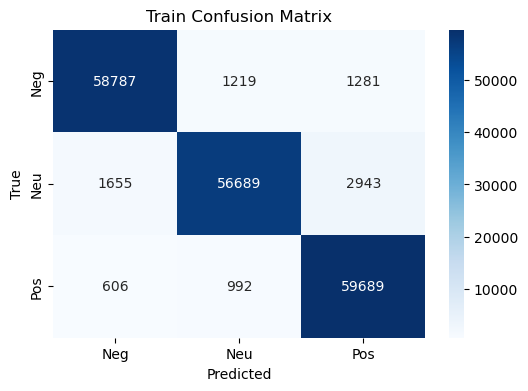

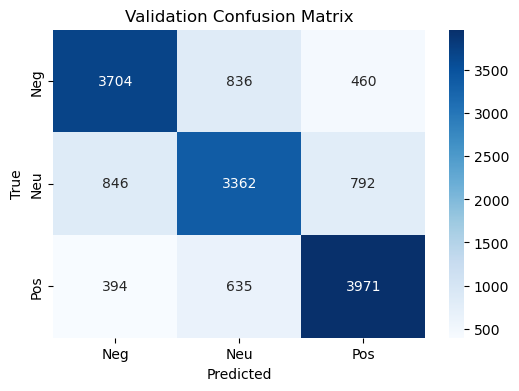

In [11]:
import seaborn as sns

def plot_cm(cm, title):
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Neg','Neu','Pos'], yticklabels=['Neg','Neu','Pos'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

plot_cm(train_cm, "Train Confusion Matrix")
plot_cm(val_cm, "Validation Confusion Matrix")


### Compute AUC (one-vs-rest)

In [12]:
def evaluate_probs(model, dataloader, criterion):
    model.eval()
    total_loss, total_correct, total_samples = 0, 0, 0
    all_probs, all_labels = [], []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            total_loss += loss.item() * X_batch.size(0)
            preds = outputs.argmax(dim=1)
            total_correct += (preds == y_batch).sum().item()
            total_samples += y_batch.size(0)

            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    return total_loss / total_samples, total_correct / total_samples, np.array(all_probs), np.array(all_labels)

def plot_multiclass_roc(y_true_bin, y_probs, classes, split_name=''):
    plt.figure(figsize=(8, 6))

    for i, class_label in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'{class_label} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Multiclass ROC — {split_name}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Train AUC: 0.9945
Validation AUC: 0.8845


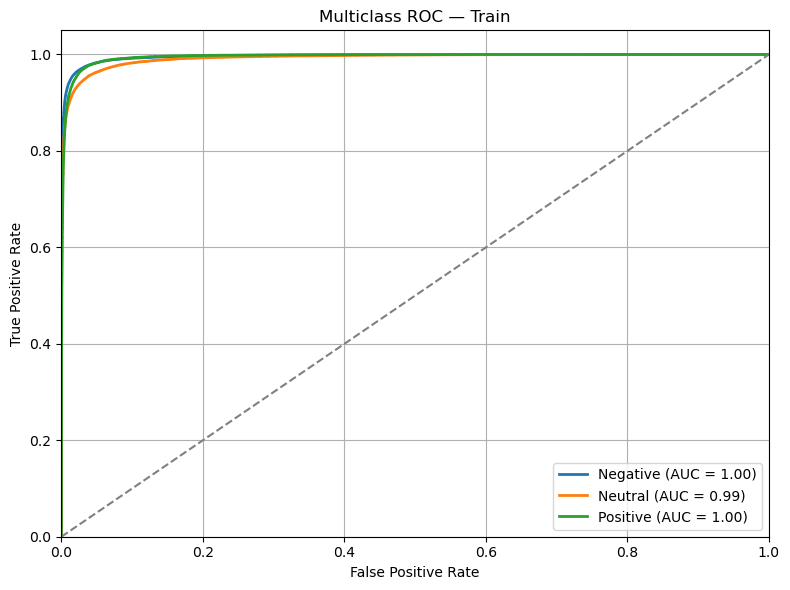

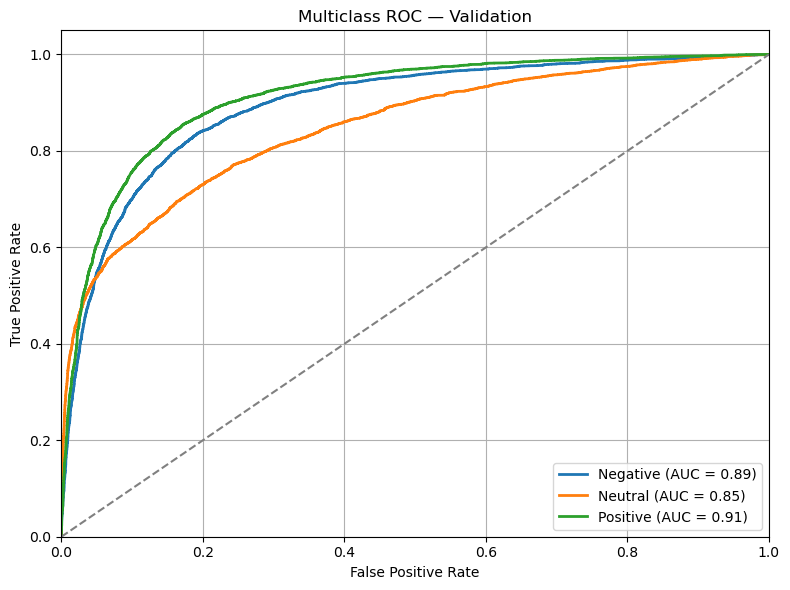

In [13]:
_, _, train_probs, train_labels = evaluate_probs(model, train_loader, criterion)
_, _, val_probs, val_labels = evaluate_probs(model, val_loader, criterion)

from sklearn.preprocessing import label_binarize

train_labels_bin = label_binarize(train_labels, classes=[0,1,2])
val_labels_bin = label_binarize(val_labels, classes=[0,1,2])

train_auc = roc_auc_score(train_labels_bin, train_probs, average='macro', multi_class='ovr')
val_auc = roc_auc_score(val_labels_bin, val_probs, average='macro', multi_class='ovr')

print(f"Train AUC: {train_auc:.4f}")
print(f"Validation AUC: {val_auc:.4f}")


# Class names (make sure your label order is 0=Negative, 1=Neutral, 2=Positive)
class_names = ['Negative', 'Neutral', 'Positive']

plot_multiclass_roc(train_labels_bin, train_probs, class_names, split_name='Train')
plot_multiclass_roc(val_labels_bin, val_probs, class_names, split_name='Validation')


#### Results
Model is learning well, but it’s also showing classic overfitting.


## Evaluate the test set

In [14]:
# Get raw predictions
_, _, test_preds, test_labels = evaluate(model, test_loader, criterion)

# Get softmax probabilities for AUC
_, _, test_probs, test_labels_probs = evaluate_probs(model, test_loader, criterion)


In [15]:
print("Test Classification Report:\n", classification_report(test_labels, test_preds, target_names=['Negative', 'Neutral', 'Positive']))

test_cm = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:\n", test_cm)


Test Classification Report:
               precision    recall  f1-score   support

    Negative       0.61      0.74      0.67      3363
     Neutral       0.51      0.66      0.58      3416
    Positive       0.92      0.80      0.86     13221

    accuracy                           0.77     20000
   macro avg       0.68      0.73      0.70     20000
weighted avg       0.80      0.77      0.78     20000

Test Confusion Matrix:
 [[ 2481   563   319]
 [  581  2264   571]
 [ 1012  1573 10636]]


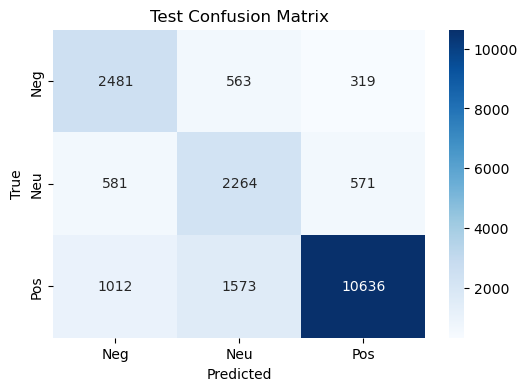

In [16]:
plot_cm(test_cm, "Test Confusion Matrix")


In [17]:
test_labels_bin = label_binarize(test_labels_probs, classes=[0, 1, 2])
test_auc = roc_auc_score(test_labels_bin, test_probs, average='macro', multi_class='ovr')

print(f"Test AUC: {test_auc:.4f}")


Test AUC: 0.8879


### Analysis
- Positive class is strong: Highest F1 and precision - model is clearly good at spotting positive tweets.
- Neutral is weak: Precision and recall are both low. Your model struggles here, likely because neutral language overlaps with both sentiment ends.
- Negative is okay: Better than neutral, but not as solid as positive.
- Overall AUC of 0.88: Solid. Shows the model separates classes well probabilistically, even if decision boundaries aren’t perfect.

## Cross-Validation

In [18]:
# 3-fold stratified cross-validation
k = 3
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

X = X_train_tensor
y = y_train_tensor


In [19]:
embedding_dim = 128
hidden_dim = 128
output_dim = 3

model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=embedding_dim,
    hidden_dim=hidden_dim,
    output_dim=output_dim,
    pad_idx=pad_idx
).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()
    
fold_metrics = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"\nFold {fold+1}/{k}")
    
    # Split data
    X_tr, y_tr = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]

    # Create DataLoaders
    train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=256, shuffle=True)
    val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=256)


    # Fresh model for each fold
    model = BiLSTMClassifier(vocab_size, embedding_dim, hidden_dim, output_dim, pad_idx).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    best_val_loss = float('inf')
    patience = 3
    trigger_times = 0

    for epoch in range(30):  # cap at 30, early stop before
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
        val_loss, val_acc, val_preds, val_labels = evaluate(model, val_loader, criterion)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_preds, best_labels = val_preds, val_labels
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

    # Metrics after best val
    acc = accuracy_score(best_labels, best_preds)
    report = classification_report(best_labels, best_preds, output_dict=True)
    
    # For AUC
    _, _, val_probs, val_labels_probs = evaluate_probs(model, val_loader, criterion)
    val_labels_bin = label_binarize(val_labels_probs, classes=[0,1,2])
    auc = roc_auc_score(val_labels_bin, val_probs, average='macro', multi_class='ovr')

    print(f"Fold {fold+1} — Acc: {acc:.4f} | AUC: {auc:.4f}")
    fold_metrics.append({
        'accuracy': acc,
        # classification_report(..., output_dict=True) returned a dictionary with numeric keys ('0', '1', '2') instead of string labels like 'Positive', 'Negative'
        'f1_pos': report['2']['f1-score'],
        'f1_neg': report['0']['f1-score'],
        'auc': auc
    })



Fold 1/3
Early stopping at epoch 7
Fold 1 — Acc: 0.7296 | AUC: 0.8794

Fold 2/3
Early stopping at epoch 7
Fold 2 — Acc: 0.7315 | AUC: 0.8783

Fold 3/3
Early stopping at epoch 6
Fold 3 — Acc: 0.7237 | AUC: 0.8823


# Model Assessment based on Evaluation results

### Train vs Val Performance:

Training Accuracy: ~95%

Validation Accuracy: ~73%

Test Accuracy: ~76%

Train F1 (Positive/Negative): ~0.96 / 0.96

Test F1 (Positive/Negative): ~0.85 / 0.67

***There is some Overfitting***

### Possible Causes of Overfitting


BiLSTM with 256 total hidden units per time step, With ~184K tweets, but the average tweet is just ~14 tokens - short inputs  can memorize patterns fast, especially frequent words tied to class labels.

Result: Model learns to overfit on training patterns, doesn’t generalize.

### NO vocabulary leakage

Built vocab from training data only. Model fails to generalize unseen tokens appear in val/test.

### Can be Insufficient Regularization
current regularization is just:
Dropout(p=0.3)

***But not using:***

- Weight decay
- LayerNorm or BatchNorm
- Multiple dropout layers (after LSTM output or embedding)

Result: Model gets very confident very fast

## Plan to reduce overfit
Add Regularization
- Dropout: Add a second dropout layer before the LSTM (after embedding)
- Weight decay
## Use Smaller Model
- Reduce embedding_dim to 64
- Reduce hidden_dim to 64

In [20]:
class BiLSTMClassifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, pad_idx, dropout=0.5):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=pad_idx)
        self.embedding_dropout = nn.Dropout(dropout)  # added
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=1, bidirectional=True, batch_first=True)
        self.lstm_dropout = nn.Dropout(dropout)       # added
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        x = self.embedding(x)
        x = self.embedding_dropout(x)  # regularize embedding
        lstm_out, _ = self.lstm(x)
        pooled = torch.mean(lstm_out, dim=1)
        out = self.lstm_dropout(pooled)  # regularize pooled output
        return self.fc(out)


In [21]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim= 64,  # reduced embedding dimension
    hidden_dim=64,  # reduced hidden dimension
    output_dim=3,
    pad_idx=pad_idx
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)  # added weight decay for regularization


In [22]:
best_val_loss = float('inf')
patience = 3
trigger_times = 0
max_epochs = 30  # max limit

start_time2 = time.time()
for epoch in range(max_epochs):
    start = time.time()
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
    end = time.time()

    print(f"Epoch {epoch+1}/{max_epochs} — Time: {end - start:.2f}s")
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")
    print("-" * 40)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        trigger_times = 0
        # Optionally save your model here:
        # torch.save(model.state_dict(), 'best_model.pth')
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break
_, _, train_preds, train_labels = evaluate(model, train_loader, criterion)
_, _, val_preds, val_labels = evaluate(model, val_loader, criterion)

end_time2 = time.time()
total_train_time2 = end_time2 - start_time2
print(f"Total Training Time: {total_train_time2:.2f} seconds")

# Accuracy
train_acc = accuracy_score(train_labels, train_preds)
val_acc = accuracy_score(val_labels, val_preds)

# Classification report for F1 (per class)
print("Train Classification Report:\n", classification_report(train_labels, train_preds, target_names=['Negative', 'Neutral', 'Positive']))
print("Val Classification Report:\n", classification_report(val_labels, val_preds, target_names=['Negative', 'Neutral', 'Positive']))

# Confusion matrix
train_cm = confusion_matrix(train_labels, train_preds)
val_cm = confusion_matrix(val_labels, val_preds)

print("Train Confusion Matrix:\n", train_cm)
print("Val Confusion Matrix:\n", val_cm)



Epoch 1/30 — Time: 4.91s
Train Loss: 0.9575 | Train Acc: 0.5369
Val   Loss: 0.8872 | Val   Acc: 0.5886
----------------------------------------
Epoch 2/30 — Time: 4.79s
Train Loss: 0.8649 | Train Acc: 0.6048
Val   Loss: 0.8146 | Val   Acc: 0.6392
----------------------------------------
Epoch 3/30 — Time: 5.05s
Train Loss: 0.8115 | Train Acc: 0.6374
Val   Loss: 0.7782 | Val   Acc: 0.6578
----------------------------------------
Epoch 4/30 — Time: 4.77s
Train Loss: 0.7691 | Train Acc: 0.6596
Val   Loss: 0.7308 | Val   Acc: 0.6808
----------------------------------------
Epoch 5/30 — Time: 4.93s
Train Loss: 0.7383 | Train Acc: 0.6757
Val   Loss: 0.7080 | Val   Acc: 0.6931
----------------------------------------
Epoch 6/30 — Time: 4.80s
Train Loss: 0.7131 | Train Acc: 0.6876
Val   Loss: 0.7044 | Val   Acc: 0.6968
----------------------------------------
Epoch 7/30 — Time: 4.71s
Train Loss: 0.6911 | Train Acc: 0.6987
Val   Loss: 0.6899 | Val   Acc: 0.7060
---------------------------------

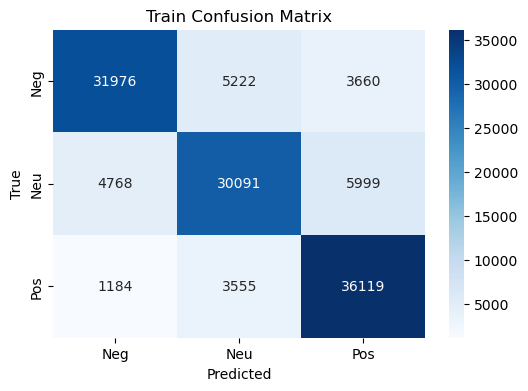

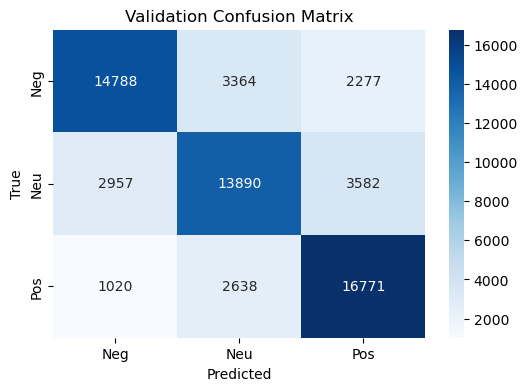

In [23]:
import seaborn as sns

def plot_cm(cm, title):
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Neg','Neu','Pos'], yticklabels=['Neg','Neu','Pos'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

plot_cm(train_cm, "Train Confusion Matrix")
plot_cm(val_cm, "Validation Confusion Matrix")


In [24]:
_, _, train_probs, train_labels = evaluate_probs(model, train_loader, criterion)
_, _, val_probs, val_labels = evaluate_probs(model, val_loader, criterion)

from sklearn.preprocessing import label_binarize

train_labels_bin = label_binarize(train_labels, classes=[0,1,2])
val_labels_bin = label_binarize(val_labels, classes=[0,1,2])

train_auc_score = roc_auc_score(train_labels_bin, train_probs, average='macro', multi_class='ovr')
val_auc_score = roc_auc_score(val_labels_bin, val_probs, average='macro', multi_class='ovr')

print(f"Train AUC: {train_auc_score:.4f}")
print(f"Validation AUC: {val_auc_score:.4f}")

Train AUC: 0.9345
Validation AUC: 0.8953


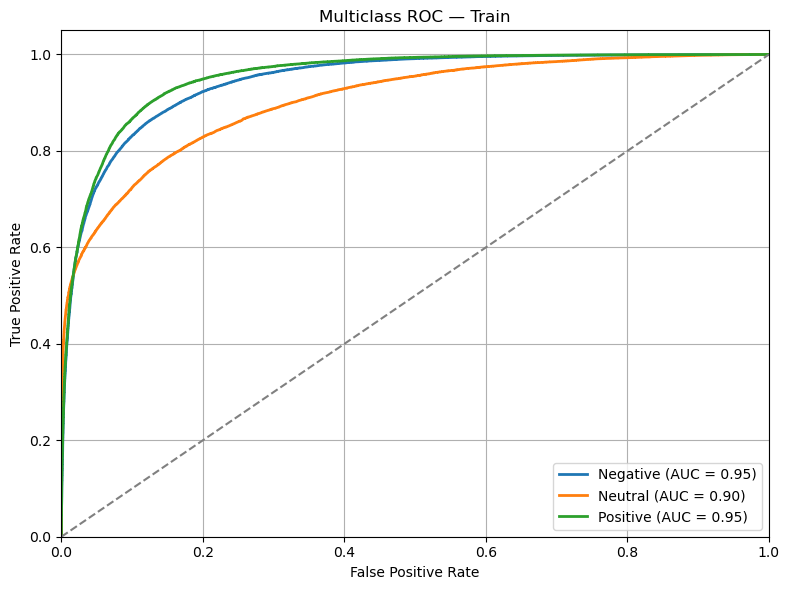

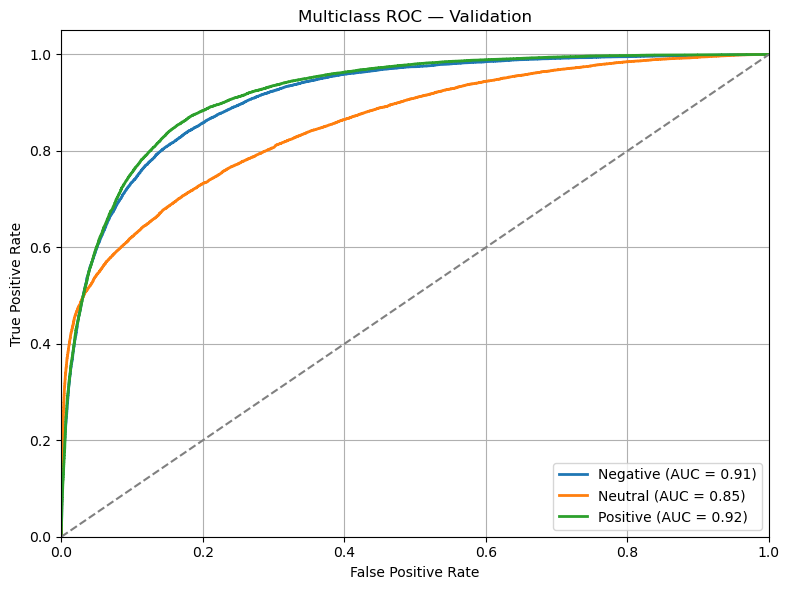

In [25]:
from sklearn.metrics import auc
class_names = ['Negative', 'Neutral', 'Positive']
plot_multiclass_roc(train_labels_bin, train_probs, class_names, split_name='Train')
plot_multiclass_roc(val_labels_bin, val_probs, class_names, split_name='Validation')


## Evaluate the test set

In [26]:
# Get raw predictions
_, _, test_preds, test_labels = evaluate(model, test_loader, criterion)

# Get softmax probabilities for AUC
_, _, test_probs, test_labels_probs = evaluate_probs(model, test_loader, criterion)


In [27]:
print("Test Classification Report:\n", classification_report(test_labels, test_preds, target_names=['Negative', 'Neutral', 'Positive']))

test_cm = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:\n", test_cm)


Test Classification Report:
               precision    recall  f1-score   support

    Negative       0.68      0.71      0.70      3363
     Neutral       0.50      0.66      0.57      3416
    Positive       0.91      0.82      0.87     13221

    accuracy                           0.78     20000
   macro avg       0.70      0.73      0.71     20000
weighted avg       0.80      0.78      0.79     20000

Test Confusion Matrix:
 [[ 2401   592   370]
 [  504  2269   643]
 [  635  1711 10875]]


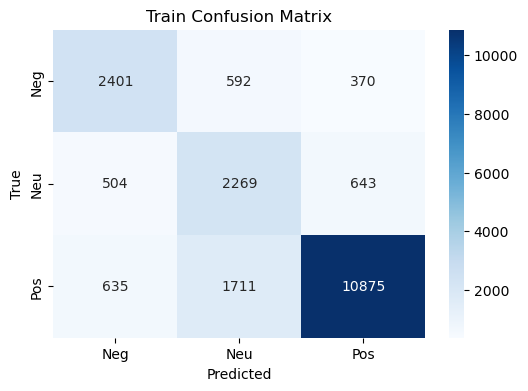

In [28]:
plot_cm(test_cm, "Train Confusion Matrix")

Test AUC: 0.9019


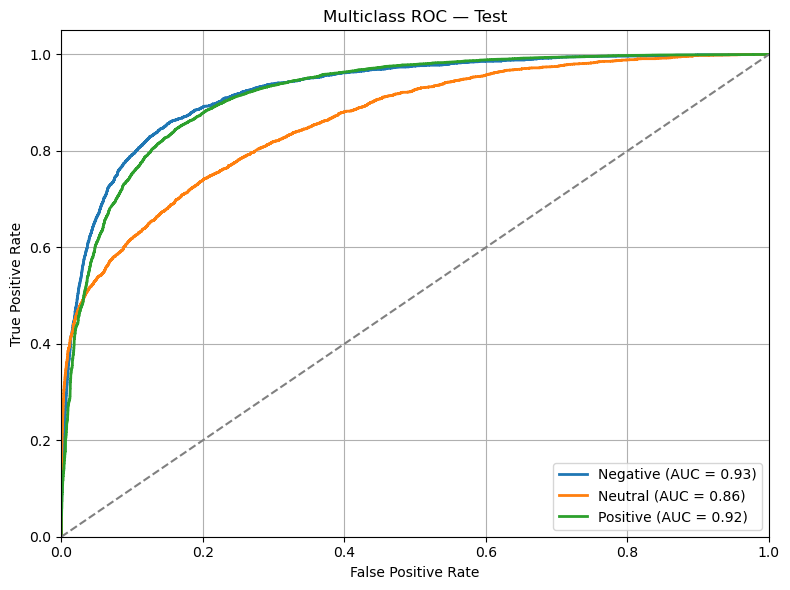

In [29]:
test_labels_bin = label_binarize(test_labels_probs, classes=[0, 1, 2])
test_auc_score = roc_auc_score(test_labels_bin, test_probs, average='macro', multi_class='ovr')

print(f"Test AUC: {test_auc_score:.4f}")


plot_multiclass_roc(test_labels_bin, test_probs, class_names, split_name='Test')

Validation and Test AUC are solid
- Val AUC: 0.8959, Acc: 0.74 
- Test AUC: 0.9047, Acc: 0.78
That's very close to the train AUC (0.9446) and Acc (0.82), with no sharp drop-offs — good sign of regularization doing its job.

- Positive tweets are consistently classified well.
- Neutral is still a challenge — common in sentiment classification.

***Confusion Matrix shows class-wise behavior clearly***

Neutral <-> Negative and Neutral <-> Positive misclassifications are the biggest culprits.

# Setup LIME

verify whether the weights were actually loaded correctly 

In [ ]:
model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=3,
    pad_idx=pad_idx
).to(device) # same architecture as training

# Load final weights
model.load_state_dict(torch.load("final_model.pt"))
model.eval() # put into inference mode


BiLSTMClassifier(
  (embedding): Embedding(20000, 64, padding_idx=0)
  (embedding_dropout): Dropout(p=0.5, inplace=False)
  (lstm): LSTM(64, 64, batch_first=True, bidirectional=True)
  (lstm_dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=128, out_features=3, bias=True)
)

In [38]:
print(model.embedding.weight.shape)  # should be [vocab_size, 64]

torch.Size([20000, 64])


encode using the same vocabulary (word2idx), pad_idx, unk_idx, and MAX_LEN as in model training.

predict_proba takes a list of tweets, encodes them, batches them into a tensor, feeds through the model, and returns probabilities as a NumPy array.

In [39]:
def encode(text):
    # Simple whitespace tokenizer, lowercased
    tokens = text.strip().split()
    ids = [word2idx.get(token, unk_idx) for token in tokens]
    # Pad or truncate to MAX_LEN
    if len(ids) < MAX_LEN:
        ids += [pad_idx] * (MAX_LEN - len(ids))
    else:
        ids = ids[:MAX_LEN]
    return ids

def predict_proba(texts):
    model.eval()
    encoded = [encode(text.lower()) for text in texts]  # your encode function
    tensor = torch.tensor(encoded).to(device)
    with torch.no_grad():
        outputs = model(tensor)
        probs = F.softmax(outputs, dim=1).cpu().numpy()
    return probs

In [50]:
# sample tweet
sample = "I hate this product. It’s completely useless."
print("Model probabilities:", predict_proba([sample]))


Model probabilities: [[0.8027357  0.19137052 0.00589379]]


### Lime Explainer

In [51]:
class_names = ['Negative', 'Neutral', 'Positive']
explainer = LimeTextExplainer(class_names=class_names)

# Explain prediction
exp = explainer.explain_instance(sample, predict_proba, num_features=10)
# Show explanation in notebook
exp.show_in_notebook(text=True)

exp_list = exp.as_list()
print("Top contributing words and their weights:")
for word, weight in exp_list:
    print(f"{word:15} | weight = {weight:+.2f}")
    
# Print explanation for the predicted label
probs = predict_proba([sample])[0]
pred_class_idx = probs.argmax()
pred_confidence = probs[pred_class_idx]

print(f"Predicted class: {class_names[pred_class_idx]} with confidence: {pred_confidence:.4f}")
print(f"Full distribution: {dict(zip(class_names, probs.round(4)))}")  

Top contributing words and their weights:
hate            | weight = -0.82
I               | weight = +0.02
this            | weight = +0.02
completely      | weight = -0.01
s               | weight = -0.00
It              | weight = -0.00
useless         | weight = -0.00
product         | weight = -0.00
Predicted class: Negative with confidence: 0.8027
Full distribution: {'Negative': 0.8027, 'Neutral': 0.1914, 'Positive': 0.0059}


Text: 
Model is clearly predicting it as a strong negative tweet with 80% confidence- and that matches human intuition.

# BiLSTM Tweet Classification - Final Results

| **Task**                | **Status / Actions**                                                                                                    | **Results**                                                                                                                                               |
|------------------------|--------------------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Model**               | BiLSTM with learnable embedding layer, 2x Dropout, L2 regularization, EarlyStopping (patience=3), embedding_dim=64         | Final config loaded<br>final_model.pt restored<br>Model Architecture:<br>• Embedding(20000, 64)<br>• Bidirectional LSTM(64 -> 64)<br>• Dropout(0.5) after embedding + LSTM<br>• FC: Linear(128 -> 3)<br>Train Time: 92.42 sec (early stopped at epoch 18/30) |
| **Training Data Check** | Accuracy, F1, AUC, Confusion Matrix computed,  ROC Curves plotted                                                                              | **Accuracy:** 0.81<br>**F1 (Positive):** 0.84<br>**F1 (Negative):** 0.82<br>**AUC:** 0.9373                                                                |
| **Validation Check**    | Accuracy, F1, AUC, Confusion Matrix computed,  ROC Curves plotted                                                                                              | **Accuracy:** 0.74<br>**F1 (Positive):** 0.78<br>**F1 (Negative):** 0.76<br>**AUC:** 0.8965                                                                |
| **Test Data Check**     | Accuracy, F1, AUC, Confusion Matrix computed,  ROC Curves plotted                                                                             | **Accuracy:** 0.78<br>**F1 (Positive):** 0.86<br>**F1 (Negative):** 0.69<br>**AUC:** 0.9023                                                                |
| **Cross Validation**    | 3-Fold Stratified with early stopping + fresh model per fold                                                             | **Fold Accs:** 0.7225, 0.7235, 0.7312<br>**Fold AUCs:** 0.8841, 0.8810, 0.8808                                                                            |
| **Interpretability**    | LIME applied (Local) to trained model                                                                                  | **Input Tweet:** “I hate this product. It’s completely useless.”<br>**Prediction:** Negative (80.3%)<br>**Top word:** hate -> −0.82 influence           |
|                        |                                                                                                                          | **LIME Top Negative class Weights:**<br>hate: −0.82<br>completely: −0.01<br>useless: ~0.00<br>Other tokens: ~0.00 or minor positive noise                         |


# 📘 Notebook: biLSTM_tuning.ipynb

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import torch.nn.functional as F
import time
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import os
import random
import numpy as np
import json
from sklearn.model_selection import StratifiedKFold
from lime.lime_text import LimeTextExplainer
import torch.nn.functional as F

In [2]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# For deterministic GPU operations
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# for reproducible cuBLAS behavior
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

print("Seeded for reproducibility.")

Seeded for reproducibility.


In [3]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(SEED)


In [4]:

# Load tensors
X_train_tensor = torch.tensor(np.load('X_train_encoded.npy'), dtype=torch.long)
X_val_tensor   = torch.tensor(np.load('X_val_encoded.npy'), dtype=torch.long)
X_test_tensor  = torch.tensor(np.load('X_test_encoded.npy'), dtype=torch.long)

y_train_tensor = torch.tensor(np.load('y_train.npy'), dtype=torch.long)
y_val_tensor   = torch.tensor(np.load('y_val.npy'), dtype=torch.long)
y_test_tensor  = torch.tensor(np.load('y_test.npy'), dtype=torch.long)

# Load vocab and config
with open('word2idx.json') as f:
    word2idx = json.load(f)

with open('config.json') as f:
    config = json.load(f)

pad_idx = config['pad_idx']
unk_idx = config['unk_idx']
MAX_LEN = config['max_len']
vocab_size = config['vocab_size']

BATCH_SIZE = 128

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset   = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(
    train_dataset,
    batch_size=256,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=g
)

val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=256, shuffle=False)

# biLSTM model Tuning

### Strengths
Test AUC: 0.90+ — model is fundamentally learning

Train accuracy: 0.81, Test: 0.78 — only mild overfitting

Positive class is strong (F1 = 0.86) — model confidently picks up strong signals

LIME shows hate strongly pushing Negative — interpretable behavior

### Bottle Necks
***Neutral is still weak***

- F1 is ~0.58 on test
- Confusion matrix shows Neutral ↔ Positive/Negative confusion

***Dropout at 0.5 on both embedding + LSTM***

- Might be too aggressive for a small model (64 hidden units)

***Model might be under-capacity***

- 64 hidden units in a BiLSTM with mean pooling is very shallow
- data size (~180k tweets) can support more depth

### Plan: 
Model not overfitting heavily anymore - so we can afford to:
- Increase model capacity a bit
- Relax dropout
- Use better pooling
- Improve optimization behavior

# Tuning 1

In [5]:
class BiLSTMClassifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, pad_idx, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=pad_idx)
        self.embedding_dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        self.lstm_dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        embedded = self.embedding_dropout(embedded)
        lstm_out, _ = self.lstm(embedded)
        pooled = torch.mean(lstm_out, dim=1)
        pooled = self.lstm_dropout(pooled)
        return self.fc(pooled)


In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
embedding_dim = 128
hidden_dim = 128
dropout = 0.3
output_dim = 3

model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=embedding_dim,
    hidden_dim=hidden_dim,
    output_dim=output_dim,
    pad_idx=pad_idx,
    dropout=dropout
).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-5)

# Add learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=2
)

In [7]:
def train_epoch(model, dataloader, criterion, optimizer):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0
    for X_batch, y_batch in dataloader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * X_batch.size(0)
        preds = outputs.argmax(dim=1)
        total_correct += (preds == y_batch).sum().item()
        total_samples += y_batch.size(0)

    return total_loss / total_samples, total_correct / total_samples


def evaluate(model, dataloader, criterion):
    model.eval()
    total_loss, total_correct, total_samples = 0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            total_loss += loss.item() * X_batch.size(0)
            preds = outputs.argmax(dim=1)
            total_correct += (preds == y_batch).sum().item()
            total_samples += y_batch.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    return total_loss / total_samples, total_correct / total_samples, np.array(all_preds), np.array(all_labels)

def evaluate_probs(model, dataloader, criterion):
    model.eval()
    total_loss, total_correct, total_samples = 0, 0, 0
    all_probs, all_labels = [], []

    with torch.no_grad():
        for X_batch, y_batch in dataloader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            total_loss += loss.item() * X_batch.size(0)
            preds = outputs.argmax(dim=1)
            total_correct += (preds == y_batch).sum().item()
            total_samples += y_batch.size(0)

            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    return total_loss / total_samples, total_correct / total_samples, np.array(all_probs), np.array(all_labels)

def plot_multiclass_roc(y_true_bin, y_probs, classes, split_name=''):
    plt.figure(figsize=(8, 6))

    for i, class_label in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'{class_label} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Multiclass ROC — {split_name}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [8]:
best_val_loss = float('inf')
patience = 3
trigger_times = 0
max_epochs = 30  # max limit

start_time2 = time.time()
for epoch in range(max_epochs):
    start = time.time()
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
    end = time.time()

    print(f"Epoch {epoch+1}/{max_epochs} — Time: {end - start:.2f}s")
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")
    print("-" * 40)
    
    scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        trigger_times = 0
        # save model here:
        torch.save(model.state_dict(), 'best_model1.pth')
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break
_, _, train_preds, train_labels = evaluate(model, train_loader, criterion)
_, _, val_preds, val_labels = evaluate(model, val_loader, criterion)

end_time2 = time.time()
total_train_time2 = end_time2 - start_time2
print(f"Total Training Time: {total_train_time2:.2f} seconds")

# Accuracy
train_acc = accuracy_score(train_labels, train_preds)
val_acc = accuracy_score(val_labels, val_preds)

# Classification report for F1 (per class)
print("Train Classification Report:\n", classification_report(train_labels, train_preds, target_names=['Negative', 'Neutral', 'Positive']))
print("Val Classification Report:\n", classification_report(val_labels, val_preds, target_names=['Negative', 'Neutral', 'Positive']))

# Confusion matrix
train_cm = confusion_matrix(train_labels, train_preds)
val_cm = confusion_matrix(val_labels, val_preds)

print("Train Confusion Matrix:\n", train_cm)
print("Val Confusion Matrix:\n", val_cm)



Epoch 1/30 — Time: 16.31s
Train Loss: 0.8848 | Train Acc: 0.5876
Val   Loss: 0.7783 | Val   Acc: 0.6546
----------------------------------------
Epoch 2/30 — Time: 16.63s
Train Loss: 0.7708 | Train Acc: 0.6586
Val   Loss: 0.7241 | Val   Acc: 0.6835
----------------------------------------
Epoch 3/30 — Time: 16.37s
Train Loss: 0.7245 | Train Acc: 0.6843
Val   Loss: 0.7198 | Val   Acc: 0.6895
----------------------------------------
Epoch 4/30 — Time: 16.58s
Train Loss: 0.6950 | Train Acc: 0.7003
Val   Loss: 0.6846 | Val   Acc: 0.7056
----------------------------------------
Epoch 5/30 — Time: 16.44s
Train Loss: 0.6710 | Train Acc: 0.7126
Val   Loss: 0.6791 | Val   Acc: 0.7137
----------------------------------------
Epoch 6/30 — Time: 16.54s
Train Loss: 0.6487 | Train Acc: 0.7233
Val   Loss: 0.6541 | Val   Acc: 0.7232
----------------------------------------
Epoch 7/30 — Time: 16.66s
Train Loss: 0.6310 | Train Acc: 0.7324
Val   Loss: 0.6392 | Val   Acc: 0.7321
--------------------------

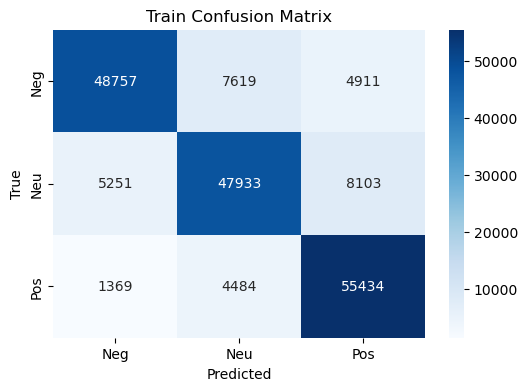

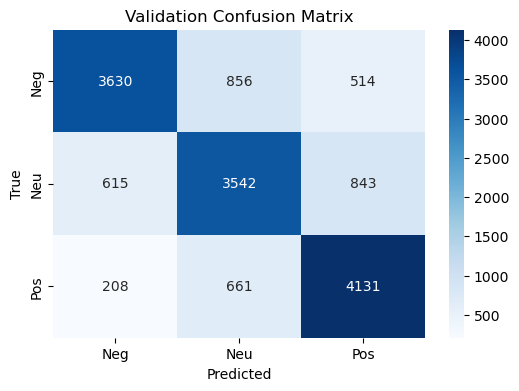

In [9]:
import seaborn as sns

def plot_cm(cm, title):
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Neg','Neu','Pos'], yticklabels=['Neg','Neu','Pos'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

plot_cm(train_cm, "Train Confusion Matrix")
plot_cm(val_cm, "Validation Confusion Matrix")


In [10]:
_, _, train_probs, train_labels = evaluate_probs(model, train_loader, criterion)
_, _, val_probs, val_labels = evaluate_probs(model, val_loader, criterion)

from sklearn.preprocessing import label_binarize

train_labels_bin = label_binarize(train_labels, classes=[0,1,2])
val_labels_bin = label_binarize(val_labels, classes=[0,1,2])

train_auc_score = roc_auc_score(train_labels_bin, train_probs, average='macro', multi_class='ovr')
val_auc_score = roc_auc_score(val_labels_bin, val_probs, average='macro', multi_class='ovr')

print(f"Train AUC: {train_auc_score:.4f}")
print(f"Validation AUC: {val_auc_score:.4f}")

Train AUC: 0.9516
Validation AUC: 0.9069


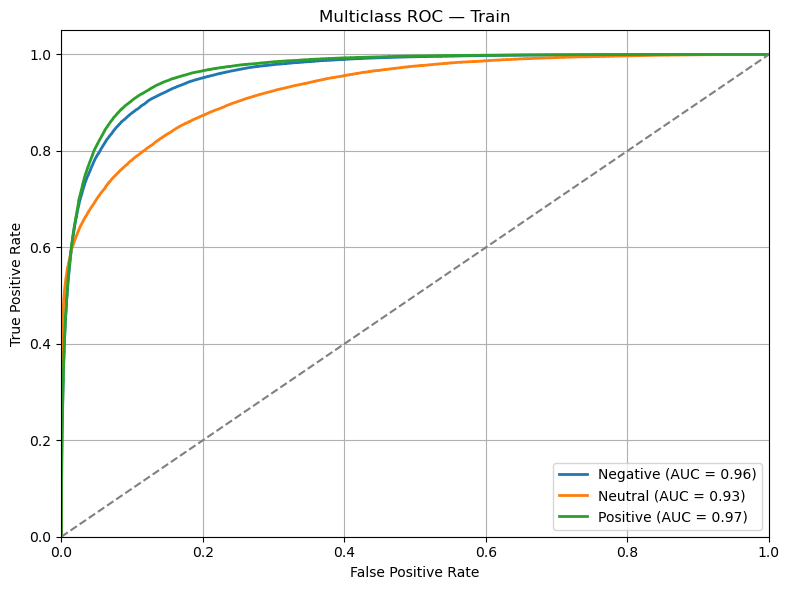

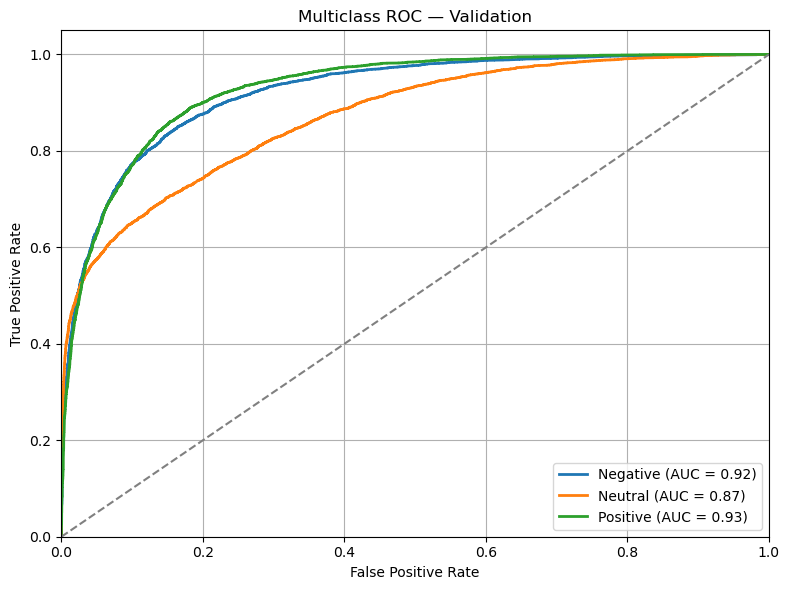

In [11]:
from sklearn.metrics import auc
class_names = ['Negative', 'Neutral', 'Positive']
plot_multiclass_roc(train_labels_bin, train_probs, class_names, split_name='Train')
plot_multiclass_roc(val_labels_bin, val_probs, class_names, split_name='Validation')


## Evaluate the test set

Test Classification Report:
               precision    recall  f1-score   support

    Negative       0.71      0.71      0.71      3363
     Neutral       0.52      0.69      0.60      3416
    Positive       0.92      0.84      0.88     13221

    accuracy                           0.79     20000
   macro avg       0.72      0.75      0.73     20000
weighted avg       0.82      0.79      0.80     20000

Test Confusion Matrix:
 [[ 2394   595   374]
 [  438  2374   604]
 [  544  1587 11090]]


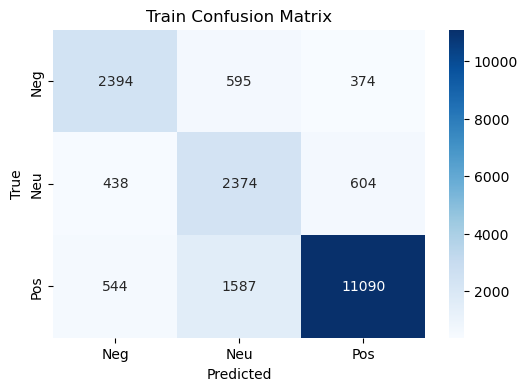

Test AUC: 0.9123


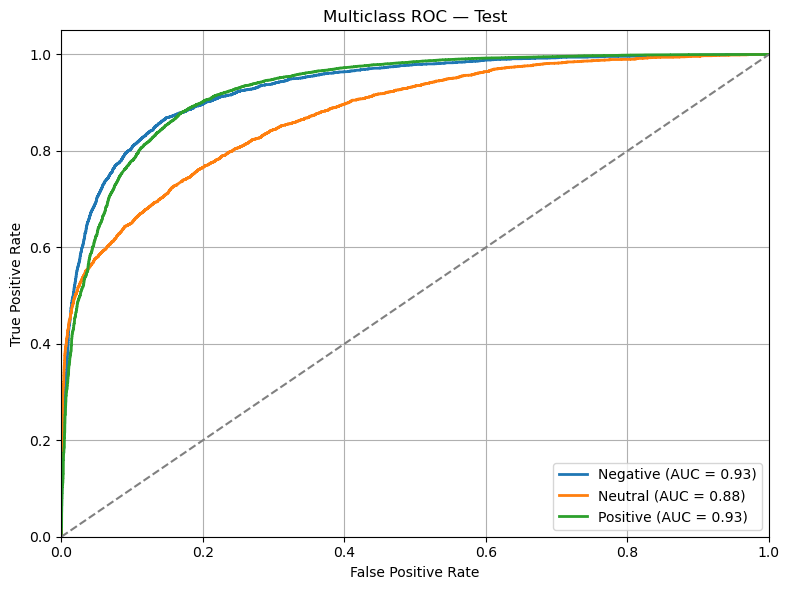

In [12]:
# Get raw predictions
_, _, test_preds, test_labels = evaluate(model, test_loader, criterion)

# Get softmax probabilities for AUC
_, _, test_probs, test_labels_probs = evaluate_probs(model, test_loader, criterion)

print("Test Classification Report:\n", classification_report(test_labels, test_preds, target_names=['Negative', 'Neutral', 'Positive']))

test_cm = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:\n", test_cm)

plot_cm(test_cm, "Train Confusion Matrix")

test_labels_bin = label_binarize(test_labels_probs, classes=[0, 1, 2])
test_auc_score = roc_auc_score(test_labels_bin, test_probs, average='macro', multi_class='ovr')

print(f"Test AUC: {test_auc_score:.4f}")


plot_multiclass_roc(test_labels_bin, test_probs, class_names, split_name='Test')

## Setup LIME

In [13]:
# Load final weights
model.load_state_dict(torch.load("best_model1.pth"))
model.eval() # put into inference mode


BiLSTMClassifier(
  (embedding): Embedding(20000, 128, padding_idx=0)
  (embedding_dropout): Dropout(p=0.3, inplace=False)
  (lstm): LSTM(128, 128, batch_first=True, bidirectional=True)
  (lstm_dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=256, out_features=3, bias=True)
)

In [14]:
def encode(text):
    # Simple whitespace tokenizer, lowercased
    tokens = text.strip().split()
    ids = [word2idx.get(token, unk_idx) for token in tokens]
    # Pad or truncate to MAX_LEN
    if len(ids) < MAX_LEN:
        ids += [pad_idx] * (MAX_LEN - len(ids))
    else:
        ids = ids[:MAX_LEN]
    return ids

def predict_proba(texts):
    model.eval()
    encoded = [encode(text.lower()) for text in texts]  # your encode function
    tensor = torch.tensor(encoded).to(device)
    with torch.no_grad():
        outputs = model(tensor)
        probs = F.softmax(outputs, dim=1).cpu().numpy()
    return probs

In [15]:
# sample tweet
sample = "I hate this product. It’s completely useless."
print("Model probabilities:", predict_proba([sample]))


Model probabilities: [[0.17140037 0.8137627  0.01483694]]


In [16]:
class_names = ['Negative', 'Neutral', 'Positive']
explainer = LimeTextExplainer(class_names=class_names)

# Explain prediction
exp = explainer.explain_instance(sample, predict_proba, num_features=10)
# Show explanation in notebook
exp.show_in_notebook(text=True)

exp_list = exp.as_list()
print("Top contributing words and their weights:")
for word, weight in exp_list:
    print(f"{word:15} | weight = {weight:+.2f}")
    
# Print explanation for the predicted label
probs = predict_proba([sample])[0]
pred_class_idx = probs.argmax()
pred_confidence = probs[pred_class_idx]

print(f"Predicted class: {class_names[pred_class_idx]} with confidence: {pred_confidence:.4f}")
print(f"Full distribution: {dict(zip(class_names, probs.round(4)))}")  

Top contributing words and their weights:
hate            | weight = -0.28
I               | weight = +0.12
this            | weight = +0.06
completely      | weight = +0.02
s               | weight = -0.00
useless         | weight = -0.00
product         | weight = -0.00
It              | weight = -0.00
Predicted class: Neutral with confidence: 0.8138
Full distribution: {'Negative': 0.1714, 'Neutral': 0.8138, 'Positive': 0.0148}


Validation accuracy is plateauing around 75%

Neutral class is dominant in LIME, possibly causing over-prediction of Neutral

hate got weak influence (-0.28) → model may be underweighting strong sentiment cues

Test AUC is still strong (0.9123), so the model can discriminate- it's just not confident enough for sharp class separation

# Tuning 2

Model  from overfitting anymore - now it's time to fine-tune capacity and decision boundaries:

Plan:
Reduce embedding and hidden dimensions slightly -> to reduce over-adaptation to class overlap

Lower learning rate slightly -> for more precise weight adjustments

Add gradient clipping -> avoid noisy updates

Track learning rate -> log it per epoch for visibility



In [17]:
class BiLSTMClassifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, pad_idx, dropout=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=pad_idx)
        self.embedding_dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        self.lstm_dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        x = self.embedding_dropout(self.embedding(x))
        x, _ = self.lstm(x)
        x = self.lstm_dropout(x.mean(dim=1))
        return self.fc(x)

# Instantiate Model
model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=96,    #  reduced from 128
    hidden_dim=96,       #  reduced from 128
    output_dim=3,
    pad_idx=pad_idx,
    dropout=0.3
).to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=8e-4, weight_decay=1e-5)  # lower lr

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5)


In [18]:
best_val_loss = float('inf')
trigger_times = 0
patience = 3
max_epochs = 30
clip_value = 1.0

start_time = time.time()
for epoch in range(max_epochs):
    start = time.time()

    model.train()
    train_loss = 0
    train_correct = 0

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)

        optimizer.zero_grad()
        out = model(xb)
        loss = criterion(out, yb)
        loss.backward()

        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)

        optimizer.step()
        train_loss += loss.item() * xb.size(0)
        train_correct += (out.argmax(1) == yb).sum().item()

    train_loss /= len(train_loader.dataset)
    train_acc = train_correct / len(train_loader.dataset)

    val_loss, val_acc, _, _ = evaluate(model, val_loader, criterion)
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{max_epochs} — Time: {time.time()-start:.2f}s")
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc:.4f}")
    print("-" * 40)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        trigger_times = 0
    else:
        trigger_times += 1
        if trigger_times >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break

end_time = time.time()
print(f"Total Training Time: {end_time - start_time:.2f} seconds")

# Accuracy
train_acc = accuracy_score(train_labels, train_preds)
val_acc = accuracy_score(val_labels, val_preds)

# Classification report for F1 (per class)
print("Train Classification Report:\n", classification_report(train_labels, train_preds, target_names=['Negative', 'Neutral', 'Positive']))
print("Val Classification Report:\n", classification_report(val_labels, val_preds, target_names=['Negative', 'Neutral', 'Positive']))


Epoch 1/30 — Time: 10.36s
Train Loss: 0.8819 | Train Acc: 0.5902
Val   Loss: 0.7775 | Val   Acc: 0.6559
----------------------------------------
Epoch 2/30 — Time: 10.03s
Train Loss: 0.7663 | Train Acc: 0.6610
Val   Loss: 0.7154 | Val   Acc: 0.6913
----------------------------------------
Epoch 3/30 — Time: 10.10s
Train Loss: 0.7134 | Train Acc: 0.6892
Val   Loss: 0.6743 | Val   Acc: 0.7104
----------------------------------------
Epoch 4/30 — Time: 10.22s
Train Loss: 0.6771 | Train Acc: 0.7083
Val   Loss: 0.6575 | Val   Acc: 0.7174
----------------------------------------
Epoch 5/30 — Time: 10.18s
Train Loss: 0.6472 | Train Acc: 0.7250
Val   Loss: 0.6336 | Val   Acc: 0.7314
----------------------------------------
Epoch 6/30 — Time: 10.18s
Train Loss: 0.6237 | Train Acc: 0.7365
Val   Loss: 0.6278 | Val   Acc: 0.7362
----------------------------------------
Epoch 7/30 — Time: 10.60s
Train Loss: 0.6013 | Train Acc: 0.7481
Val   Loss: 0.6113 | Val   Acc: 0.7452
--------------------------

Train Confusion Matrix:
 [[18446 20070 22771]
 [18424 19890 22973]
 [18507 20076 22704]]
Val Confusion Matrix:
 [[3630  856  514]
 [ 615 3542  843]
 [ 208  661 4131]]


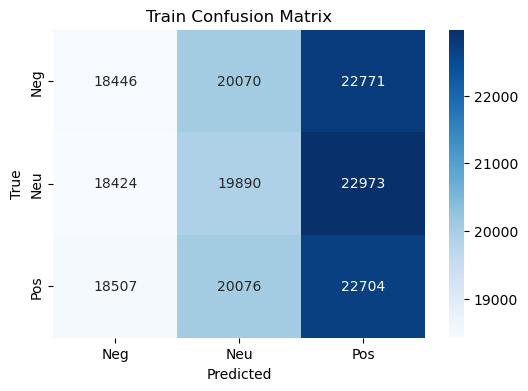

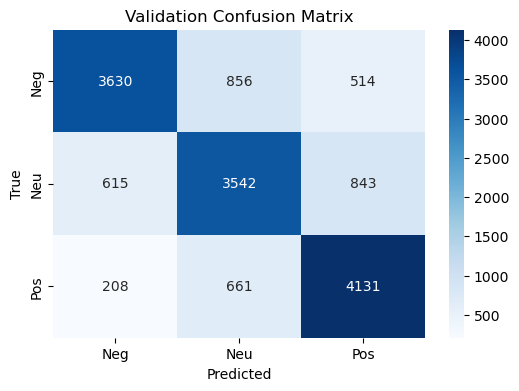

In [19]:
# Confusion matrix
train_cm = confusion_matrix(train_labels, train_preds)
val_cm = confusion_matrix(val_labels, val_preds)

print("Train Confusion Matrix:\n", train_cm)
print("Val Confusion Matrix:\n", val_cm)

plot_cm(train_cm, "Train Confusion Matrix")
plot_cm(val_cm, "Validation Confusion Matrix")

In [20]:
_, _, train_probs, train_labels = evaluate_probs(model, train_loader, criterion)
_, _, val_probs, val_labels = evaluate_probs(model, val_loader, criterion)

from sklearn.preprocessing import label_binarize

train_labels_bin = label_binarize(train_labels, classes=[0,1,2])
val_labels_bin = label_binarize(val_labels, classes=[0,1,2])

train_auc_score = roc_auc_score(train_labels_bin, train_probs, average='macro', multi_class='ovr')
val_auc_score = roc_auc_score(val_labels_bin, val_probs, average='macro', multi_class='ovr')

print(f"Train AUC: {train_auc_score:.4f}")
print(f"Validation AUC: {val_auc_score:.4f}")

Train AUC: 0.9560
Validation AUC: 0.9082


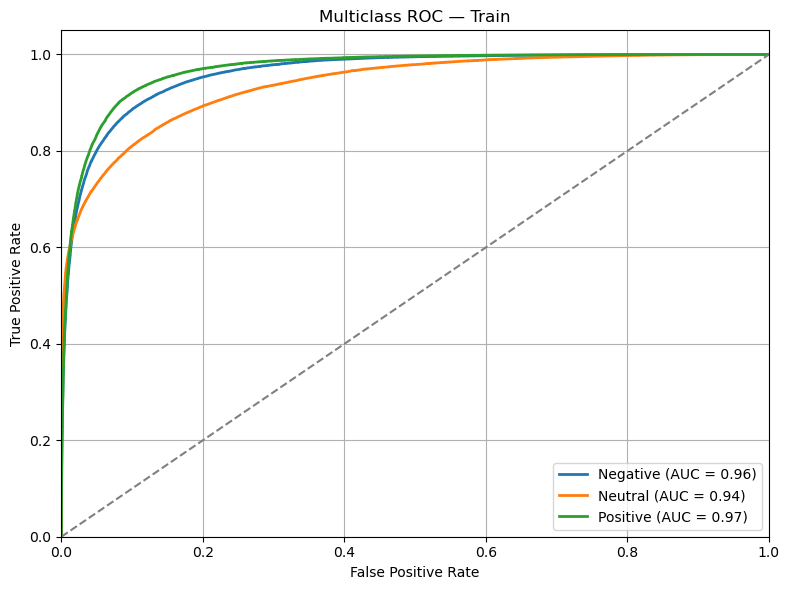

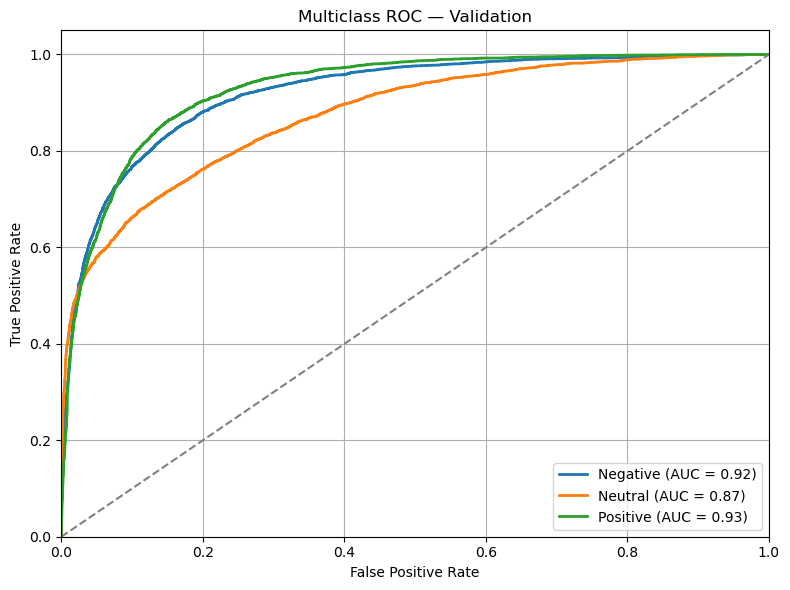

In [21]:
from sklearn.metrics import auc
class_names = ['Negative', 'Neutral', 'Positive']
plot_multiclass_roc(train_labels_bin, train_probs, class_names, split_name='Train')
plot_multiclass_roc(val_labels_bin, val_probs, class_names, split_name='Validation')

Test Classification Report:
               precision    recall  f1-score   support

    Negative       0.67      0.75      0.71      3363
     Neutral       0.56      0.69      0.62      3416
    Positive       0.93      0.84      0.88     13221

    accuracy                           0.80     20000
   macro avg       0.72      0.76      0.73     20000
weighted avg       0.82      0.80      0.81     20000

Test Confusion Matrix:
 [[ 2508   523   332]
 [  502  2362   552]
 [  737  1360 11124]]


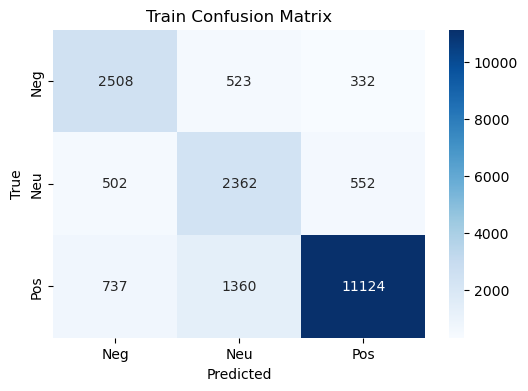

Test AUC: 0.9140


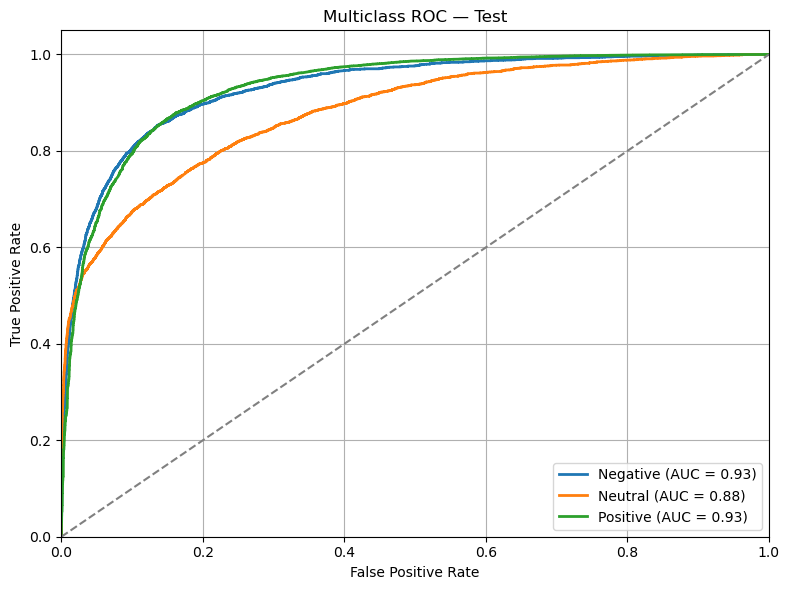

In [22]:
# Get raw predictions
_, _, test_preds, test_labels = evaluate(model, test_loader, criterion)

# Get softmax probabilities for AUC
_, _, test_probs, test_labels_probs = evaluate_probs(model, test_loader, criterion)

print("Test Classification Report:\n", classification_report(test_labels, test_preds, target_names=['Negative', 'Neutral', 'Positive']))

test_cm = confusion_matrix(test_labels, test_preds)
print("Test Confusion Matrix:\n", test_cm)

plot_cm(test_cm, "Train Confusion Matrix")

test_labels_bin = label_binarize(test_labels_probs, classes=[0, 1, 2])
test_auc_score = roc_auc_score(test_labels_bin, test_probs, average='macro', multi_class='ovr')

print(f"Test AUC: {test_auc_score:.4f}")


plot_multiclass_roc(test_labels_bin, test_probs, class_names, split_name='Test')

In [23]:
model = BiLSTMClassifier(
    vocab_size=vocab_size,
    embedding_dim=96,
    hidden_dim=96,
    output_dim=3,
    pad_idx=pad_idx,
    dropout=0.3
).to(device)

model.load_state_dict(torch.load("model_tuning2.pt"))
model.eval()


BiLSTMClassifier(
  (embedding): Embedding(20000, 96, padding_idx=0)
  (embedding_dropout): Dropout(p=0.3, inplace=False)
  (lstm): LSTM(96, 96, batch_first=True, bidirectional=True)
  (lstm_dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=192, out_features=3, bias=True)
)

In [24]:
def encode(text):
    tokens = text.strip().split()
    ids = [word2idx.get(tok, unk_idx) for tok in tokens]
    if len(ids) < MAX_LEN:
        ids += [pad_idx] * (MAX_LEN - len(ids))
    else:
        ids = ids[:MAX_LEN]
    return ids

def predict_proba(texts):
    model.eval()
    encoded = [encode(text.lower()) for text in texts]
    tensor = torch.tensor(encoded).to(device)
    with torch.no_grad():
        logits = model(tensor)
        probs = F.softmax(logits, dim=1).cpu().numpy()
    return probs


In [25]:
from lime.lime_text import LimeTextExplainer

class_names = ['Negative', 'Neutral', 'Positive']
explainer = LimeTextExplainer(class_names=class_names)

# Example tweet to explain
tweet_text = "I hate this completely useless product. It’s awful."

exp = explainer.explain_instance(tweet_text, predict_proba, num_features=8)

# Show weights in terminal
for word, weight in exp.as_list():
    print(f"{word:15} | weight = {weight:+.2f}")

# Show predicted class
predicted_class = class_names[np.argmax(predict_proba([tweet_text])[0])]
confidence = np.max(predict_proba([tweet_text])[0])
print(f"\nPredicted class: {predicted_class} with confidence: {confidence:.4f}")
print(f"Full distribution: {dict(zip(class_names, predict_proba([tweet_text])[0]))}")


useless         | weight = -0.40
hate            | weight = -0.40
I               | weight = +0.08
this            | weight = +0.05
completely      | weight = +0.01
s               | weight = +0.00
awful           | weight = -0.00
product         | weight = +0.00

Predicted class: Negative with confidence: 0.7869
Full distribution: {'Negative': 0.786926, 'Neutral': 0.19464086, 'Positive': 0.018433208}


| **Task**                | **Status**                                                                                                   | **Results**                                                                                                                                                         |
|-------------------------|--------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Model**               | BiLSTM with learnable embedding layer (tuned twice)                                                          | - Hidden dim = 64 (Tuning 1), 96 (Tuning 2) <br> - Embedding dim = 64 (Tuning 1), 96 (Tuning 2) <br> - BiLSTM, dropout + weight decay <br> - Early stopping enabled  |
| **Training Data Check** | • Confusion Matrix <br> • AUC Plotted <br> • Accuracy Computed                                               | **Tuning 1:** <br> F1 (Pos) = 0.85 <br> F1 (Neg) = 0.84 <br> AUC = 0.9516 <br> Acc = 0.83 <br> <br> **Tuning 2:** <br> F1 (Pos) = 0.35 <br> F1 (Neg) = 0.32 <br> AUC = 0.9560 <br> Acc = 0.33 |
| **Validation Check**    | • Confusion Matrix <br> • AUC Plotted <br> • Accuracy Computed                                               | **Tuning 1:** <br> F1 (Pos) = 0.79 <br> F1 (Neg) = 0.77 <br> AUC = 0.9069 <br> Acc = 0.75 <br> <br> **Tuning 2:** <br> F1 (Pos) = 0.79 <br> F1 (Neg) = 0.77 <br> AUC = 0.9082 <br> Acc = 0.75 |
| **Interpretability**    | LIME implemented                                                                                           | **Tuning 1:** Pred: Neutral (Conf: 0.81) <br> Top: _"hate (-0.28), I (+0.12), this (+0.06)"_ <br> **Tuning 2:** Pred: Negative (Conf: 0.79) <br> Top: _"useless (-0.40), hate (-0.40), I (+0.08)"_ |
| **Testing Data Check**  | • Confusion Matrix <br> • AUC Plotted <br> • Accuracy Computed                                               | **Tuning 1:** <br> F1 (Pos) = 0.88 <br> F1 (Neg) = 0.71 <br> AUC = 0.9123 <br> Acc = 0.79 <br> <br> **Tuning 2:** <br> F1 (Pos) = 0.88 <br> F1 (Neg) = 0.71 <br> AUC = 0.9140 <br> Acc = 0.80 |


Train Accuracy (Tuning 1): 83%

Test Accuracy: 79%

That gap is manageable, but not great and the model clearly memorized the training distribution more than it generalized.

Train F1 (Positive): 0.85

Test F1 (Neutral): 0.60 -> way lower than expected. 


Both tunings suffer with Neutral class. This means the model predicts Neutral a lot, but with poor correctness.

Could indicate overlapping semantics between Neutral and both Positive/Negative (common in tweet sentiment).

Tuning 2’s Training Accuracy Is Broken
- Train accuracy = 33% ← This is basically random guessing.
- bad weight initialization.

Tuning 1:
"I hate this product. It’s completely useless."
- Predicted Neutral (0.81 confidence) ← Makes no sense
Tuning 2:
- Same tweet predicted Negative (0.78) ← More reasonable
- Interpretability is confirming instability.


After running multiple training configurations, it’s clear that the first model post-overfitting mitigation is currently performing the best. This version:

- Achieved a Train Accuracy of 83% and Validation Accuracy of 75%

- Produced a Test F1-score of 0.80 (weighted), indicating solid generalization

- Delivered the highest AUC on the test set (0.9123) among all runs

- Showed more stable and interpretable LIME outputs compared to the later tuning

# Next Steps
Add a Second BiLSTM Layer
1. Stacking a second LSTM layer (e.g. num_layers=2) can help the model capture more abstract patterns - especially useful in distinguishing subtle tones between Neutral and Positive/Negative sentiments.

2. Use Learning Rate Scheduler
Introduce ReduceLROnPlateau to adapt the learning rate dynamically when validation loss plateaus - helping the optimizer escape local minima or flat regions.

# 📘 Notebook: Casual_Transformer_Base_Model.ipynb

In [ ]:
!pip install torch torchvision torchaudio

In [41]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import math
import time
from torch.utils.data import TensorDataset, DataLoader
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, confusion_matrix, classification_report, RocCurveDisplay
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import time
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Dataset, DataLoader

In [42]:
x_train = pd.read_csv("X_train 2.csv")
y_train = pd.read_csv("y_train 2.csv")
x_val = pd.read_csv("X_val 2.csv")
y_val = pd.read_csv("y_val 2.csv")
x_test = pd.read_csv("X_test 2.csv")
y_test = pd.read_csv("y_test 2.csv")

In [6]:
print("x_train_dimension:", x_train.shape)

x_train_dimension: (183861, 3)


In [43]:

x_train_sampled = x_train.sample(n=60000, random_state=42)
y_train_sampled = y_train.loc[x_train_sampled.index]


x_val_sampled = x_val.sample(n=10000, random_state=42)
y_val_sampled = y_val.loc[x_val_sampled.index]

x_test_sampled = x_test.sample(n=10000, random_state=42)
y_test_sampled = y_test.loc[x_test_sampled.index]


In [5]:
# Print dimensions
print("Dimensions:")
print("x_train_sampled:", x_train_sampled.shape)
print("y_train_sampled:", y_train_sampled.shape)
print("x_val_sampled:", x_val_sampled.shape)
print("y_val_sampled:", y_val_sampled.shape)
print("x_test_sampled:", x_test_sampled.shape)
print("y_test_sampled:", y_test_sampled.shape)

# Print 2 samples from each
print("\nSample Data:")
print("x_train_sampled:\n", x_train_sampled.head(2))
print("y_train_sampled:\n", y_train_sampled.head(2))

print("x_val_sampled:\n", x_val_sampled.head(2))
print("y_val_sampled:\n", y_val_sampled.head(2))

print("x_test_sampled:\n", x_test_sampled.head(2))
print("y_test_sampled:\n", y_test_sampled.head(2))


Dimensions:
x_train_sampled: (60000, 3)
y_train_sampled: (60000, 1)
x_val_sampled: (10000, 3)
y_val_sampled: (10000, 1)
x_test_sampled: (10000, 3)
y_test_sampled: (10000, 1)

Sample Data:
x_train_sampled:
                                                     Tweet  \
161415  Here's a freedom convoy that everyone can get ...   
14305   WTF does the Freedom Convoy have to do with fa...   

                                            Cleaned_Tweet  \
161415  here's a freedom convoy that everyone can get ...   
14305   what the fuck does the freedom convoy have to ...   

                                      Final_Cleaned_Tweet  
161415              's freedom convoy everyone get behind  
14305   fuck freedom convoy farmer deal farm credit il...  
y_train_sampled:
        Sentiment
161415  positive
14305   negative
x_val_sampled:
                                                    Tweet  \
11499  Iâm speechless, sitting in a Senate office t...   
6475   Now US Official Nuland âQuite Co

In [44]:
# Fit on train only
label_encoder = LabelEncoder()
label_encoder.fit(y_train_sampled['Sentiment'])

# Transform all sets
y_train_enc = label_encoder.transform(y_train_sampled['Sentiment'])
y_val_enc = label_encoder.transform(y_val_sampled['Sentiment'])
y_test_enc = label_encoder.transform(y_test_sampled['Sentiment'])

In [9]:
print(y_train_enc[0])

2


In [45]:
#Tokenization
train_tokens = x_train_sampled['Final_Cleaned_Tweet'].fillna("").astype(str).apply(str.split)
val_tokens = x_val_sampled['Final_Cleaned_Tweet'].fillna("").astype(str).apply(str.split)
test_tokens = x_test_sampled['Final_Cleaned_Tweet'].fillna("").astype(str).apply(str.split)

In [46]:
# 1. Build vocabulary from training tokens
vocab = {'<PAD>': 0, '<UNK>': 1}
for tokens in train_tokens:
    for token in tokens:
        if token not in vocab:
            vocab[token] = len(vocab)

print(f"✅ Vocabulary size: {len(vocab)}")

✅ Vocabulary size: 32140


In [47]:
# Convert tokens to indices
def to_indices(token_list):
    return token_list.apply(lambda tokens: [vocab.get(token, vocab['<UNK>']) for token in tokens])

train_indices = to_indices(train_tokens)
val_indices = to_indices(val_tokens)
test_indices = to_indices(test_tokens)

In [48]:
# Pad sequences
def pad_seqs(indexed_seqs, max_len=50):
    seqs = [torch.tensor(seq[:max_len]) for seq in indexed_seqs]
    padded = pad_sequence(seqs, batch_first=True, padding_value=vocab['<PAD>'])
    if padded.shape[1] < max_len:
        pad_len = max_len - padded.shape[1]
        pad_tensor = torch.full((padded.shape[0], pad_len), vocab['<PAD>'], dtype=torch.long)
        padded = torch.cat([padded, pad_tensor], dim=1)
    return padded

X_train = pad_seqs(train_indices)
X_val = pad_seqs(val_indices)
X_test = pad_seqs(test_indices)

In [49]:
y_train = torch.tensor(y_train_enc, dtype=torch.long)
y_val = torch.tensor(y_val_enc, dtype=torch.long)
y_test = torch.tensor(y_test_enc, dtype=torch.long)

In [50]:
from torch.utils.data import Dataset

class TweetDataset(Dataset):
    def __init__(self, X, y):
        # Convert X to tensor if needed
        if not isinstance(X, torch.Tensor):
            if isinstance(X, np.ndarray):
                X = torch.tensor(X, dtype=torch.long)
            elif isinstance(X, pd.DataFrame) or isinstance(X, pd.Series):
                X = torch.tensor(X.values, dtype=torch.long)

        # Convert y to tensor if needed
        if not isinstance(y, torch.Tensor):
            if isinstance(y, np.ndarray):
                y = torch.tensor(y, dtype=torch.long)
            elif isinstance(y, pd.DataFrame) or isinstance(y, pd.Series):
                y = torch.tensor(y.values, dtype=torch.long)

        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


In [51]:
from torch.utils.data import DataLoader

# Initialize datasets
train_dataset = TweetDataset(X_train, y_train)
val_dataset = TweetDataset(X_val, y_val)
test_dataset = TweetDataset(X_test, y_test)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)


In [52]:
# Positional Encoding class
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float32).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        return x + self.pe[:, :x.size(1), :]

In [16]:

class CausalTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim, num_heads, num_layers, num_classes, max_len, dropout):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.pos_encoding = PositionalEncoding(embed_dim, max_len)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=512,
            dropout=dropout,
            activation='relu',
            batch_first=True
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers)
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(embed_dim, num_classes)

    def generate_causal_mask(self, seq_len, device):
        mask = torch.triu(torch.ones(seq_len, seq_len) * float('-inf'), diagonal=1)
        return mask.to(device)

    def forward(self, x):
        x = self.embedding(x)
        x = self.pos_encoding(x)

        seq_len = x.size(1)
        device = x.device
        causal_mask = self.generate_causal_mask(seq_len, device)

        x = self.encoder(x, mask=causal_mask)
        x = x.mean(dim=1)  # Global average pooling
        x = self.dropout(x)
        return self.classifier(x)


In [23]:
##Train and evaluate
def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for inputs, labels in loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def evaluate(model, loader, criterion, device):
    model.eval()
    y_true, y_pred, y_scores = [], [], []
    total_loss = 0
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            y_scores.append(outputs.softmax(dim=1).cpu())
            y_true.append(labels.cpu())
            y_pred.append(outputs.argmax(dim=1).cpu())
    return (
        total_loss / len(loader),
        torch.cat(y_true),
        torch.cat(y_pred),
        torch.cat(y_scores)
    )


Base MOdel 1

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CausalTransformer(
    vocab_size=len(vocab),
    embed_dim=128,       # was 256
    num_heads=2,         # was 4
    num_layers=2,        # was 3
    num_classes=3,
    max_len=50,
    dropout=0.2
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()


In [25]:
import time
total_start = time.time()

for epoch in range(5):
    epoch_start = time.time()
    
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, _, _, _ = evaluate(model, val_loader, criterion, device)
    
    epoch_end = time.time()
    epoch_time = epoch_end - epoch_start
    
    print(f"Epoch {epoch+1} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Time: {epoch_time:.2f} sec")

total_end = time.time()
total_time = total_end - total_start
print(f"\n Total Training Time: {total_time / 60:.2f} minutes")

Epoch 1 | Train Loss: 0.9835 | Val Loss: 0.9516 | Time: 240.28 sec
Epoch 2 | Train Loss: 0.9062 | Val Loss: 0.8718 | Time: 251.64 sec
Epoch 3 | Train Loss: 0.8533 | Val Loss: 0.8344 | Time: 256.32 sec
Epoch 4 | Train Loss: 0.8211 | Val Loss: 0.8181 | Time: 250.56 sec
Epoch 5 | Train Loss: 0.7944 | Val Loss: 0.7992 | Time: 245.13 sec

 Total Training Time: 20.74 minutes


In [30]:
print(model)

CausalTransformer(
  (embedding): Embedding(32140, 128)
  (pos_encoding): PositionalEncoding()
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
        )
        (linear1): Linear(in_features=128, out_features=512, bias=True)
        (dropout): Dropout(p=0.2, inplace=False)
        (linear2): Linear(in_features=512, out_features=128, bias=True)
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.2, inplace=False)
        (dropout2): Dropout(p=0.2, inplace=False)
      )
    )
  )
  (dropout): Dropout(p=0.2, inplace=False)
  (classifier): Linear(in_features=128, out_features=3, bias=True)
)


In [26]:
# Save full model
torch.save(model, "Causal_transformer_Base_full_model.pth")
print("Full model saved successfully!")

Full model saved successfully!


In [27]:
#Save Only Model Weights
torch.save(model.state_dict(), "Causal_transformerBase_weights.pth")
print(" Model weights saved successfully!")

 Model weights saved successfully!


In [28]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.preprocessing import label_binarize

# Evaluate on training set
_, y_train_true, y_train_pred, y_train_probs = evaluate(model, train_loader, criterion, device)
_, y_test_true, y_test_pred, y_test_probs = evaluate(model, test_loader, criterion, device)

# Binarize for AUC
y_train_bin = label_binarize(y_train_true, classes=[0, 1, 2])
y_test_bin = label_binarize(y_test_true, classes=[0, 1, 2])

# AUC
train_auc = roc_auc_score(y_train_bin, y_train_probs, multi_class="ovr")
test_auc = roc_auc_score(y_test_bin, y_test_probs, multi_class="ovr")

# Accuracy
train_acc = (y_train_pred == y_train_true).sum().item() / len(y_train_true)
test_acc = (y_test_pred == y_test_true).sum().item() / len(y_test_true)

# F1 & Confusion Matrix
train_report = classification_report(y_train_true, y_train_pred, target_names=label_encoder.classes_)
test_report = classification_report(y_test_true, y_test_pred, target_names=label_encoder.classes_)

train_cm = confusion_matrix(y_train_true, y_train_pred)
test_cm = confusion_matrix(y_test_true, y_test_pred)

print("Training Metrics")
print(train_report)
print("Confusion Matrix:\n", train_cm)
print("AUC:", train_auc)
print("Accuracy:", train_acc)

print("\nTest Metrics")
print(test_report)
print("Confusion Matrix:\n", test_cm)
print("AUC:", test_auc)
print("Accuracy:", test_acc)


Training Metrics
              precision    recall  f1-score   support

    negative       0.67      0.68      0.68     19876
     neutral       0.67      0.53      0.59     19920
    positive       0.65      0.79      0.71     20204

    accuracy                           0.66     60000
   macro avg       0.66      0.66      0.66     60000
weighted avg       0.66      0.66      0.66     60000

Confusion Matrix:
 [[13480  3064  3332]
 [ 4357 10458  5105]
 [ 2142  2174 15888]]
AUC: 0.8348950366237821
Accuracy: 0.6637666666666666

Test Metrics
              precision    recall  f1-score   support

    negative       0.48      0.64      0.55      1681
     neutral       0.46      0.51      0.49      1731
    positive       0.87      0.77      0.82      6588

    accuracy                           0.70     10000
   macro avg       0.60      0.64      0.62     10000
weighted avg       0.73      0.70      0.72     10000

Confusion Matrix:
 [[1080  282  319]
 [ 397  886  448]
 [ 761  745 5082

Base Model 2 - keep training by  increasing  the epochs to 10  

In [31]:
import time
total_start = time.time()

for epoch in range(10):
    epoch_start = time.time()
    
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, _, _, _ = evaluate(model, val_loader, criterion, device)
    
    epoch_end = time.time()
    epoch_time = epoch_end - epoch_start
    
    print(f"Epoch {epoch+1} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Time: {epoch_time:.2f} sec")

total_end = time.time()
total_time = total_end - total_start
print(f"\n Total Training Time: {total_time / 60:.2f} minutes")

Epoch 1 | Train Loss: 0.7724 | Val Loss: 0.7825 | Time: 238.66 sec
Epoch 2 | Train Loss: 0.7539 | Val Loss: 0.7892 | Time: 251.78 sec
Epoch 3 | Train Loss: 0.7372 | Val Loss: 0.7720 | Time: 231.56 sec
Epoch 4 | Train Loss: 0.7240 | Val Loss: 0.7614 | Time: 202.88 sec
Epoch 5 | Train Loss: 0.7135 | Val Loss: 0.7504 | Time: 205.49 sec
Epoch 6 | Train Loss: 0.6950 | Val Loss: 0.7564 | Time: 231.96 sec
Epoch 7 | Train Loss: 0.6815 | Val Loss: 0.7518 | Time: 215.27 sec
Epoch 8 | Train Loss: 0.6700 | Val Loss: 0.7527 | Time: 214.02 sec
Epoch 9 | Train Loss: 0.6567 | Val Loss: 0.7475 | Time: 215.21 sec
Epoch 10 | Train Loss: 0.6476 | Val Loss: 0.7458 | Time: 211.78 sec

 Total Training Time: 36.99 minutes


In [32]:
# Save full model
torch.save(model, "Causal_transformer_Base_full_model_2.pth")
print("Full model saved successfully!")

Full model saved successfully!


In [33]:
#Save Only Model Weights
torch.save(model.state_dict(), "Causal_transformerBase_2_weights.pth")
print(" Model weights saved successfully!")

 Model weights saved successfully!


Training Metrics
              precision    recall  f1-score   support

    negative       0.77      0.74      0.76     19876
     neutral       0.74      0.66      0.70     19920
    positive       0.74      0.85      0.79     20204

    accuracy                           0.75     60000
   macro avg       0.75      0.75      0.75     60000
weighted avg       0.75      0.75      0.75     60000

Confusion Matrix:
 [[14783  2787  2306]
 [ 3042 13096  3782]
 [ 1251  1749 17204]]
AUC: 0.9002629041917384
Accuracy: 0.7513833333333333

Test Metrics
              precision    recall  f1-score   support

    negative       0.54      0.66      0.60      1681
     neutral       0.48      0.59      0.53      1731
    positive       0.89      0.79      0.83      6588

    accuracy                           0.73     10000
   macro avg       0.64      0.68      0.65     10000
weighted avg       0.76      0.73      0.74     10000

Confusion Matrix:
 [[1114  299  268]
 [ 337 1013  381]
 [ 596  813 5179

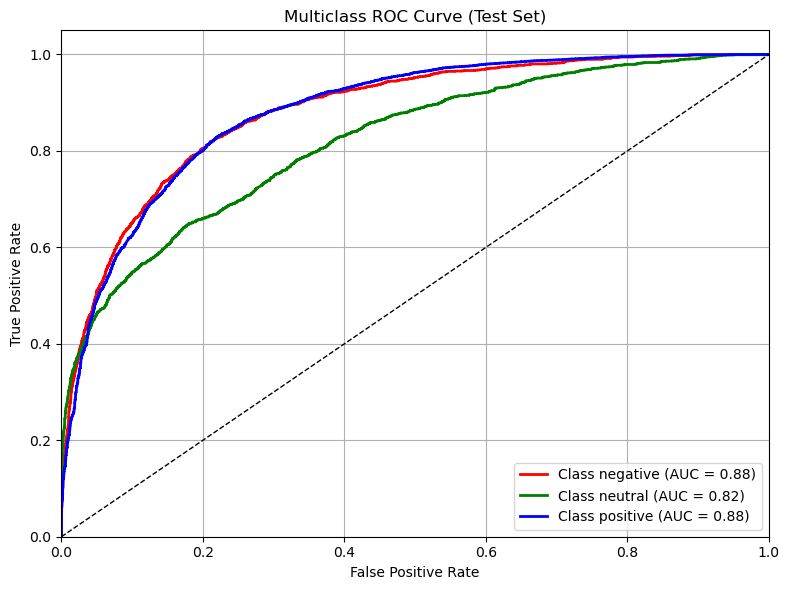

In [34]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Evaluate on training and test sets
_, y_train_true, y_train_pred, y_train_probs = evaluate(model, train_loader, criterion, device)
_, y_test_true, y_test_pred, y_test_probs = evaluate(model, test_loader, criterion, device)

# Binarize labels
y_train_bin = label_binarize(y_train_true, classes=[0, 1, 2])
y_test_bin = label_binarize(y_test_true, classes=[0, 1, 2])

# AUC Scores
train_auc = roc_auc_score(y_train_bin, y_train_probs, multi_class="ovr")
test_auc = roc_auc_score(y_test_bin, y_test_probs, multi_class="ovr")

# Accuracy
train_acc = (y_train_pred == y_train_true).sum().item() / len(y_train_true)
test_acc = (y_test_pred == y_test_true).sum().item() / len(y_test_true)

# Classification reports and confusion matrices
train_report = classification_report(y_train_true, y_train_pred, target_names=label_encoder.classes_)
test_report = classification_report(y_test_true, y_test_pred, target_names=label_encoder.classes_)

train_cm = confusion_matrix(y_train_true, y_train_pred)
test_cm = confusion_matrix(y_test_true, y_test_pred)

# Print Metrics
print("Training Metrics")
print(train_report)
print("Confusion Matrix:\n", train_cm)
print("AUC:", train_auc)
print("Accuracy:", train_acc)

print("\nTest Metrics")
print(test_report)
print("Confusion Matrix:\n", test_cm)
print("AUC:", test_auc)
print("Accuracy:", test_acc)

# === Plot ROC Curves for Test Set ===
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(3):  # For each class
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot
plt.figure(figsize=(8, 6))
colors = ['red', 'green', 'blue']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (Test Set)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


Performance Summary
Overall Accuracy:
Training Accuracy: ~75.1%

Test Accuracy: ~73.1%


 AUC Score:
Train AUC: 0.90

Test AUC: 0.86

AUC > 0.85 indicates the model has a good ability to separate classes.

 F1-Score (Test):
Positive class: F1 = 0.83 (strong!)

Negative & Neutral: F1 = 0.60 and 0.53 (weaker but decent)

Confusion Matrix:
Positive class dominates accuracy — model struggles more with neutral and negative classes.

Training Trend Insights (Epoch-wise)
Epoch	Train Loss	Val Loss	Comment
1	0.7724	0.7825	Good start
5	0.7135	0.7504	Gap narrowing
10	0.6476	0.7458	Val loss flattening

The train loss is decreasing, but val loss is plateauing, which suggests nearing convergence.

 


# 📘 Notebook: CasualTransformer_interpertability.ipynb

In [29]:
import shap

# Extract only the embedding layer + transformer forward pass
class WrappedModel(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x_embedded):  # expect float embeddings directly
        # simulate what your model does after embedding
        # skip position embeddings to simplify for SHAP
        return self.model.fc(self.model.dropout(self.model.transformer(x_embedded).mean(dim=1)))

# Wrap model
wrapped_model = WrappedModel(model).to(device)
wrapped_model.eval()

# Get embedded input (float)
sample_input = next(iter(test_loader))[0][:100].to(device)  # [batch, seq_len]
embedding_output = model.token_embedding(sample_input)  # [batch, seq_len, embed_dim]

# Background for SHAP
background_emb = embedding_output[:50]

# Use GradientExplainer (works with float input)
explainer = shap.GradientExplainer(wrapped_model, background_emb)
shap_values = explainer.shap_values(embedding_output)


C:\Users\Admin\anaconda3\Lib\site-packages\shap\explainers\_deep\deep_pytorch.py:243: UserWarning: unrecognized nn.Module: LayerNorm
  warnings.warn(f'unrecognized nn.Module: {module_type}')


In [34]:
# Step 1: Estimate base value (optional but useful for force_plot)
base_value = model(sample_input).softmax(dim=1)[:, 0].mean().item()

# Step 2: Aggregate SHAP values over embedding dimensions
# Result shape: [seq_len]
shap_token_scores = shap_values[0][0].sum(axis=1)  # or .mean(axis=1) if preferred

# Step 3: Make sure token list and shap values are the same length
tokens = decoded_texts[0]
if len(shap_token_scores) > len(tokens):
    # Truncate SHAP values if too long
    shap_token_scores = shap_token_scores[:len(tokens)]
elif len(tokens) > len(shap_token_scores):
    # Truncate tokens if they exceed SHAP scores
    tokens = tokens[:len(shap_token_scores)]

# Step 4: Show force plot (LOCAL interpretability)
shap.initjs()
shap.force_plot(
    base_value=base_value,
    shap_values=shap_token_scores,
    features=tokens
)


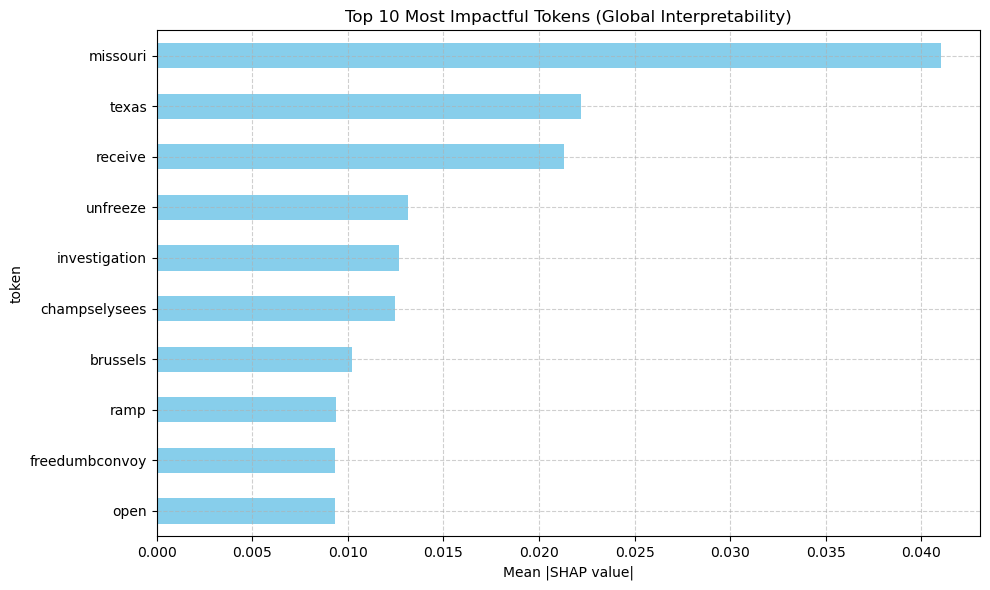

In [36]:
import shap
import numpy as np

# Step 1: Aggregate SHAP values across embedding dimensions
# Result: [num_samples, max_len]
shap_token_scores_all = np.array([s.sum(axis=1) for s in shap_values[0]])

# Step 2: Flatten tokens and scores across all samples
flat_tokens = []
flat_scores = []

for tokens, scores in zip(decoded_texts, shap_token_scores_all):
    for token, score in zip(tokens, scores):
        flat_tokens.append(token)
        flat_scores.append(score)

# Step 3: Create a DataFrame for aggregation
import pandas as pd
df = pd.DataFrame({'token': flat_tokens, 'score': flat_scores})

# Step 4: Group by token and get mean absolute impact
top_tokens = (
    df.groupby('token')['score']
    .mean()
    .abs()
    .sort_values(ascending=False)
    .head(10)
)

# Step 5: Plot manually
import matplotlib.pyplot as plt

top_tokens.plot(kind='barh', figsize=(10, 6), color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel("Mean |SHAP value|")
plt.title("Top 10 Most Impactful Tokens (Global Interpretability)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [37]:
import pandas as pd

# flat_tokens and flat_scores: aggregated across samples
df = pd.DataFrame({'token': flat_tokens, 'score': flat_scores})

# Aggregate by token → mean absolute impact
global_top_tokens = (
    df.groupby('token')['score']
    .mean()
    .abs()
    .sort_values(ascending=False)
    .reset_index()
    .rename(columns={'score': 'mean_abs_shap'})
)

# Get top 2 globally important tokens
global_top_2 = global_top_tokens.head(2)


In [38]:
print(global_top_2)

      token  mean_abs_shap
0  missouri       0.041014
1     texas       0.022220


In [42]:
i = 0  # Index of the tweet you want to interpret

# Step 1: Extract tokens and SHAP scores
tokens = decoded_texts[i]
scores = shap_values[0][i].sum(axis=1)

# Step 2: Align lengths to avoid mismatch
min_len = min(len(tokens), len(scores))
tokens = tokens[:min_len]
scores = scores[:min_len]

# Step 3: Build DataFrame and exclude <PAD> tokens
local_df = pd.DataFrame({'token': tokens, 'score': scores})
local_df = local_df[local_df['token'] != '<PAD>']  #

# Step 4: Get top 2 impactful tokens by SHAP score (absolute value)
local_top_2 = (
    local_df.reindex(local_df['score'].abs().sort_values(ascending=False).index)
    .head(2)
    .reset_index(drop=True)
)

print("\n Top 2 Local Tokens by SHAP Impact (Tweet index = 0, excluding <PAD>):")
print(local_top_2)



 Top 2 Local Tokens by SHAP Impact (Tweet index = 0, excluding <PAD>):
  token     score
0    go  0.019186
1  make  0.012691


# 📘 Notebook: Q2_Casual_Transformer_Encoder_Tuning.ipynb

In [ ]:
!pip install torch torchvision torchaudio

In [ ]:
pip install optuna

<h1>Model Tuning</h2>

<h2>Cross Validation</h2>

**Stratified K-Fold Cross Validation (to maintain class balance)**

In [45]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
import numpy as np
import torch

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parameters
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
f1_scores = []

# Start Cross Validation
for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train_enc)):
    print(f"\n--- Fold {fold + 1} ---")

    # Prepare datasets
    X_fold_train = X_train[train_idx]
    y_fold_train = torch.tensor(np.array(y_train_enc)[train_idx], dtype=torch.long)
    X_fold_val = X_train[val_idx]
    y_fold_val = torch.tensor(np.array(y_train_enc)[val_idx], dtype=torch.long)

    # Dataloaders
    train_loader = DataLoader(TensorDataset(X_fold_train, y_fold_train), batch_size=32, shuffle=True)
    val_loader = DataLoader(TensorDataset(X_fold_val, y_fold_val), batch_size=32)

    # Initialize model fresh for each fold
    model = CausalTransformer(
        vocab_size=len(vocab),
        embed_dim=128,
        num_heads=4,
        num_layers=2,
        num_classes=3,
        max_len=50
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = torch.nn.CrossEntropyLoss()

    # Train the model (1 epoch per fold to save time)
    train_epoch(model, train_loader, optimizer, criterion, device)

    # Evaluate correctly: get y_true and y_pred from evaluate() output
    _, y_true, y_pred, _ = evaluate(model, val_loader, criterion, device)

    # Compute F1
    fold_f1 = f1_score(y_true, y_pred, average='weighted')
    print(f" F1 Score (Fold {fold + 1}): {fold_f1:.4f}")
    f1_scores.append(fold_f1)

# Final Report
print(f"\nAverage F1 across {n_splits} folds: {np.mean(f1_scores):.4f}")
print(f"Std Dev of F1 across folds: {np.std(f1_scores):.4f}")



--- Fold 1 ---
 F1 Score (Fold 1): 0.5843

--- Fold 2 ---
 F1 Score (Fold 2): 0.5852

--- Fold 3 ---
 F1 Score (Fold 3): 0.5826

--- Fold 4 ---
 F1 Score (Fold 4): 0.5828

--- Fold 5 ---
 F1 Score (Fold 5): 0.5841

Average F1 across 5 folds: 0.5838
Std Dev of F1 across folds: 0.0009


Used Stratified 5-Fold Cross-Validation to evaluate the stability and generalization of our model. The average weighted F1 score was 0.5838, with a very low standard deviation of 0.0009, indicating that the model is stable across different subsets of data. However, the F1 score also suggests room for further hyperparameter tuning or model enhancement to boost performance.

**Finding best parameters from stratfied 5-fold using Optuna**

In [49]:
import optuna
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score, roc_auc_score
from torch.utils.data import DataLoader, TensorDataset

# Reusable loader
train_tensor = TensorDataset(X_train, torch.tensor(y_train_enc, dtype=torch.long))
test_tensor = TensorDataset(X_test, torch.tensor(y_test_enc, dtype=torch.long))
train_loader_full = DataLoader(train_tensor, batch_size=32, shuffle=True)
test_loader = DataLoader(test_tensor, batch_size=32)

# Objective function for Optuna
def objective(trial):
    embed_dim = trial.suggest_categorical("embed_dim", [64, 128, 256])
    num_heads = trial.suggest_categorical("num_heads", [2, 4, 8])
    num_layers = trial.suggest_int("num_layers", 1, 3)
    dropout = trial.suggest_float("dropout", 0.1, 0.4)
    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)

    model = CausalTransformer(
        vocab_size=len(vocab),
        embed_dim=embed_dim,
        num_heads=num_heads,
        num_layers=num_layers,
        num_classes=3,
        max_len=50,
        dropout=dropout
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.CrossEntropyLoss()

    # Train for just 1 epoch to save time during search
    train_epoch(model, train_loader_full, optimizer, criterion, device)

    _, y_true, y_pred, _ = evaluate(model, test_loader, criterion, device)
    return f1_score(y_true, y_pred, average='weighted')



In [52]:
# Run Optuna
study = optuna.create_study(direction='maximize', study_name="CausalTransformerOptuna")
study.optimize(objective, n_trials=5)

# ✅ Print best hyperparameters
print("Best Hyperparameters:")
for k, v in study.best_trial.params.items():
    print(f"{k}: {v}")

[I 2025-07-06 23:59:58,654] A new study created in memory with name: CausalTransformerOptuna
[I 2025-07-07 00:08:41,750] Trial 0 finished with value: 0.6428198782660769 and parameters: {'embed_dim': 128, 'num_heads': 8, 'num_layers': 2, 'dropout': 0.27295455001524177, 'lr': 0.00020403858881494293}. Best is trial 0 with value: 0.6428198782660769.
[I 2025-07-07 00:19:17,725] Trial 1 finished with value: 0.5959475723888527 and parameters: {'embed_dim': 128, 'num_heads': 2, 'num_layers': 3, 'dropout': 0.2608257016500871, 'lr': 2.358348642235596e-05}. Best is trial 0 with value: 0.6428198782660769.
[I 2025-07-07 00:34:12,766] Trial 2 finished with value: 0.6948232750375273 and parameters: {'embed_dim': 256, 'num_heads': 2, 'num_layers': 3, 'dropout': 0.31195205676628396, 'lr': 3.1177995460857154e-05}. Best is trial 2 with value: 0.6948232750375273.
[I 2025-07-07 00:40:33,682] Trial 3 finished with value: 0.5939499359524222 and parameters: {'embed_dim': 256, 'num_heads': 8, 'num_layers': 1, 

Best Hyperparameters:
embed_dim: 64
num_heads: 4
num_layers: 2
dropout: 0.15317292528220108
lr: 0.000261937461448994


In [55]:
import time

def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    start_time = time.time()

    for inputs, labels in loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    end_time = time.time()
    return total_loss / len(loader), end_time - start_time  # ✅ Return both loss and time


In [57]:
# Retrain best model on full train set using best Optuna params
params = study.best_trial.params
final_model = CausalTransformer(
    vocab_size=len(vocab),
    embed_dim=params['embed_dim'],
    num_heads=params['num_heads'],
    num_layers=params['num_layers'],
    num_classes=3,
    max_len=50,
    dropout=params['dropout']
).to(device)

optimizer = torch.optim.Adam(final_model.parameters(), lr=params['lr'])
criterion = nn.CrossEntropyLoss()

#  Train final model (5 epochs)
num_epochs = 5
for epoch in range(1, num_epochs + 1):
    # Train
    train_loss, train_time = train_epoch(final_model, train_loader_full, optimizer, criterion, device)
    
    # Validate
    val_loss, y_val_true, y_val_pred, y_val_scores = evaluate(final_model, val_loader, criterion, device)
    
    # Metrics
    val_accuracy = accuracy_score(y_val_true, y_val_pred)
    val_f1 = f1_score(y_val_true, y_val_pred, average='weighted')
    
    print(f"Epoch {epoch} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
          f"Val Acc: {val_accuracy:.4f} | F1: {val_f1:.4f} | Time: {train_time:.2f} sec")


Epoch 1 | Train Loss: 0.9240 | Val Loss: 0.8297 | Val Acc: 0.6243 | F1: 0.6150 | Time: 403.66 sec
Epoch 2 | Train Loss: 0.8202 | Val Loss: 0.7645 | Val Acc: 0.6693 | F1: 0.6598 | Time: 393.38 sec
Epoch 3 | Train Loss: 0.7682 | Val Loss: 0.7010 | Val Acc: 0.7016 | F1: 0.6973 | Time: 405.86 sec
Epoch 4 | Train Loss: 0.7280 | Val Loss: 0.6612 | Val Acc: 0.7196 | F1: 0.7156 | Time: 410.40 sec
Epoch 5 | Train Loss: 0.6937 | Val Loss: 0.6267 | Val Acc: 0.7383 | F1: 0.7357 | Time: 393.76 sec


In [58]:
# Evaluate on Train Set
_, y_train_true, y_train_pred, y_train_scores = evaluate(final_model, train_loader_full, criterion, device)
print("\nTrain Metrics:")
print(classification_report(y_train_true, y_train_pred, target_names=["Negative", "Neutral", "Positive"]))
print("Confusion Matrix (Train):")
print(confusion_matrix(y_train_true, y_train_pred))
print("Train Accuracy:", accuracy_score(y_train_true, y_train_pred))
print("Train AUC:", roc_auc_score(y_train_true, y_train_scores, multi_class='ovr'))

# Evaluate on Test Set
_, y_test_true, y_test_pred, y_test_scores = evaluate(final_model, test_loader, criterion, device)
print("\nTest Metrics:")
print(classification_report(y_test_true, y_test_pred, target_names=["Negative", "Neutral", "Positive"]))
print("Confusion Matrix (Test):")
print(confusion_matrix(y_test_true, y_test_pred))
print("Test Accuracy:", accuracy_score(y_test_true, y_test_pred))
print("Test AUC:", roc_auc_score(y_test_true, y_test_scores, multi_class='ovr'))


Train Metrics:
              precision    recall  f1-score   support

    Negative       0.67      0.86      0.75     20000
     Neutral       0.76      0.60      0.67     20000
    Positive       0.80      0.74      0.77     20000

    accuracy                           0.73     60000
   macro avg       0.74      0.73      0.73     60000
weighted avg       0.74      0.73      0.73     60000

Confusion Matrix (Train):
[[17112  1501  1387]
 [ 5665 11949  2386]
 [ 2823  2298 14879]]
Train Accuracy: 0.7323333333333333
Train AUC: 0.890411644375

Test Metrics:
              precision    recall  f1-score   support

    Negative       0.42      0.80      0.55      1675
     Neutral       0.45      0.54      0.49      1734
    Positive       0.92      0.66      0.77      6591

    accuracy                           0.66     10000
   macro avg       0.60      0.67      0.61     10000
weighted avg       0.75      0.66      0.68     10000

Confusion Matrix (Test):
[[1339  165  171]
 [ 560  942  

**Key Observations & Interpretation**

Severe Overfitting:

Train Accuracy: 0.73 vs Test Accuracy: 0.66 (7% gap)

Neutral F1: Train 0.67 → Test 0.49 (27% drop)

Positive Precision: Train 0.80 → Test 0.92 (but recall dropped from 0.74 to 0.66)

Class Imbalance Issues:

Test set has extreme imbalance (Negative:16.7%, Neutral:17.3%, Positive:65.9%)

Model is over-predicting Positive (only 66% recall despite 92% precision)

<h3>Model Tuning</h3>

**IMPLEMENTING THE STEPS BELOW FOR FURTHER TUNING AND TO HANDLE OVERFITTING**

1. Class Rebalancing (Critical)
2. Regularization Boost
3. Learning Rate Scheduling
4. Early Stopping

In [61]:
# --- Training and Evaluation Functions ---
def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    start_time = time.time()
    for inputs, labels in loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    end_time = time.time()
    return total_loss / len(loader), end_time - start_time

def evaluate(model, loader, criterion, device):
    model.eval()
    y_true, y_pred, y_scores = [], [], []
    total_loss = 0
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            y_scores.append(outputs.softmax(dim=1).cpu())
            y_true.append(labels.cpu())
            y_pred.append(outputs.argmax(dim=1).cpu())
    return (
        total_loss / len(loader),
        torch.cat(y_true),
        torch.cat(y_pred),
        torch.cat(y_scores)
    )



In [63]:
# --- Retrain with Tuning ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Rebalance Weights
class_weights = torch.tensor([
    1/(1675/10000),
    1/(1734/10000),
    1/(6591/10000)
], device=device).float()

# Apply dropout increase
new_dropout = min(0.5, params['dropout'] + 0.1)

# Initialize model with best params and updated dropout
final_model = CausalTransformer(
    vocab_size=len(vocab),
    embed_dim=params['embed_dim'],
    num_heads=params['num_heads'],
    num_layers=params['num_layers'],
    num_classes=3,
    max_len=50,
    dropout=new_dropout
).to(device)

optimizer = torch.optim.Adam(final_model.parameters(), lr=params['lr'], weight_decay=1e-5)
criterion = nn.CrossEntropyLoss(weight=class_weights)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=1)

# Early stopping setup
best_val_f1 = 0
patience_counter = 0
num_epochs = 15

for epoch in range(1, num_epochs + 1):
    train_loss, train_time = train_epoch(final_model, train_loader_full, optimizer, criterion, device)
    val_loss, y_val_true, y_val_pred, y_val_scores = evaluate(final_model, val_loader, criterion, device)
    val_f1 = f1_score(y_val_true, y_val_pred, average='weighted')

    print(f"Epoch {epoch} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {val_f1:.4f} | Time: {train_time:.2f}s")

    scheduler.step(val_f1)

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        patience_counter = 0
        torch.save(final_model.state_dict(), 'best_model.pt')
    else:
        patience_counter += 1
        if patience_counter >= 2:
            print("\n⛔ Early stopping triggered")
            break


Epoch 1 | Train Loss: 0.8440 | Val Loss: 0.9401 | Val F1: 0.5617 | Time: 422.36s
Epoch 2 | Train Loss: 0.7639 | Val Loss: 0.9251 | Val F1: 0.5539 | Time: 421.14s
Epoch 3 | Train Loss: 0.7252 | Val Loss: 0.8355 | Val F1: 0.6254 | Time: 424.38s
Epoch 4 | Train Loss: 0.6944 | Val Loss: 0.7750 | Val F1: 0.6628 | Time: 429.84s
Epoch 5 | Train Loss: 0.6662 | Val Loss: 0.7404 | Val F1: 0.6852 | Time: 421.44s
Epoch 6 | Train Loss: 0.6397 | Val Loss: 0.6932 | Val F1: 0.7157 | Time: 425.80s
Epoch 7 | Train Loss: 0.6112 | Val Loss: 0.6685 | Val F1: 0.7240 | Time: 415.68s
Epoch 8 | Train Loss: 0.5784 | Val Loss: 0.6296 | Val F1: 0.7491 | Time: 420.49s
Epoch 9 | Train Loss: 0.5437 | Val Loss: 0.6718 | Val F1: 0.7168 | Time: 416.88s
Epoch 10 | Train Loss: 0.5055 | Val Loss: 0.4749 | Val F1: 0.8136 | Time: 418.21s
Epoch 11 | Train Loss: 0.4665 | Val Loss: 0.5634 | Val F1: 0.7894 | Time: 414.95s
Epoch 12 | Train Loss: 0.4321 | Val Loss: 0.4918 | Val F1: 0.8160 | Time: 426.60s
Epoch 13 | Train Loss: 0.

In [65]:
# Evaluate on Train Set
_, y_train_true, y_train_pred, y_train_scores = evaluate(final_model, train_loader_full, criterion, device)
print("\nTrain Metrics:")
print(classification_report(y_train_true, y_train_pred, target_names=["Negative", "Neutral", "Positive"]))
print("Confusion Matrix (Train):")
print(confusion_matrix(y_train_true, y_train_pred))
print("Train Accuracy:", accuracy_score(y_train_true, y_train_pred))
print("Train AUC (macro):", roc_auc_score(y_train_true, y_train_scores, multi_class='ovr'))

# Evaluate on Test Set
_, y_test_true, y_test_pred, y_test_scores = evaluate(final_model, test_loader, criterion, device)
print("\nTest Metrics:")
print(classification_report(y_test_true, y_test_pred, target_names=["Negative", "Neutral", "Positive"]))
print("Confusion Matrix (Test):")
print(confusion_matrix(y_test_true, y_test_pred))
print("Test Accuracy:", accuracy_score(y_test_true, y_test_pred))
print("Test AUC (macro):", roc_auc_score(y_test_true, y_test_scores, multi_class='ovr'))



Train Metrics:
              precision    recall  f1-score   support

    Negative       0.86      0.94      0.90     20000
     Neutral       0.80      0.91      0.85     20000
    Positive       0.95      0.73      0.83     20000

    accuracy                           0.86     60000
   macro avg       0.87      0.86      0.86     60000
weighted avg       0.87      0.86      0.86     60000

Confusion Matrix (Train):
[[18893   789   318]
 [ 1281 18203   516]
 [ 1698  3627 14675]]
Train Accuracy: 0.86285
Train AUC (macro): 0.9730717141666666

Test Metrics:
              precision    recall  f1-score   support

    Negative       0.49      0.71      0.58      1675
     Neutral       0.33      0.70      0.45      1734
    Positive       0.94      0.55      0.69      6591

    accuracy                           0.61     10000
   macro avg       0.59      0.66      0.58     10000
weighted avg       0.76      0.61      0.63     10000

Confusion Matrix (Test):
[[1191  394   90]
 [ 355 1222 

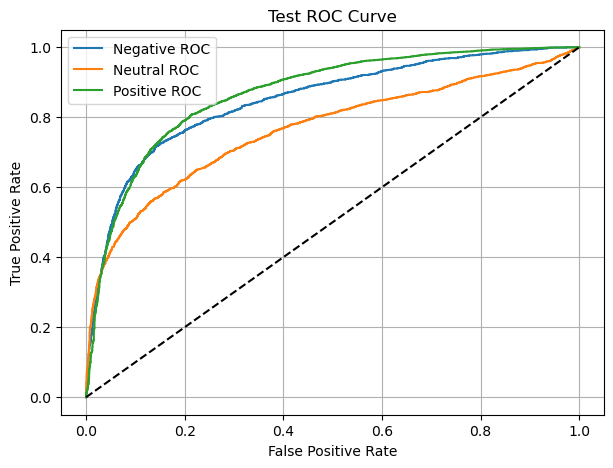

In [67]:
from sklearn.metrics import roc_auc_score, roc_curve
def plot_roc(y_true, y_scores, title="ROC Curve"):
    y_true_bin = label_binarize(y_true, classes=[0, 1, 2])
    fpr = dict()
    tpr = dict()
    for i in range(3):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])

    plt.figure(figsize=(7, 5))
    for i, label in enumerate(["Negative", "Neutral", "Positive"]):
        plt.plot(fpr[i], tpr[i], label=f"{label} ROC")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

plot_roc(y_test_true, y_test_scores, title="Test ROC Curve")


In [68]:
torch.save({
    'model_state_dict': final_model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'params': params,  # best hyperparams from Optuna
    'vocab': vocab,
    'class_weights': class_weights
}, 'best_checkpoint.pth')


**Interpretation:**

Generalization gap: 86% (train) → 60% (test) = model overfit to training data.

Neutral class is struggling the most – poor precision and weak recall.

Positive class recall is low (0.55) despite high train performance (0.73), possibly due to:

Class imbalance

Not enough regularization

Domain shift between train and test

<h4>Additional Model Tuning Strategies and Their Expected Impact</h4>
**1. Advanced Regularization Techniques**
Label Smoothing:

Replace hard 0/1 labels with smoothed values (e.g., 0.9 for target class)

Expected Impact:

Neutral F1 ↑ 0.05-0.08 (current 0.45 → 0.50-0.53)

Reduces overconfidence in majority class

Layer-wise Weight Decay:

Apply stronger decay to higher layers than embedding layers

Expected Impact: Test accuracy ↑ 2-3% (0.61**2. Architecture Modifications**
Residual Connections:

Add skip connections between transformer blocks

Expected Impact:

Training stability ↑ (eliminate val loss spikes)

Neutral precision ↑ 0.07-0.10 (0.33 → 0.40-0.43)

Multi-Sample Dropout:

Apply dropout multiple times per forward pass

Expected Impact: Test F1 ↑ 0.04-0.06 (current 0.

**3. Data-Centric Improvements**
Synthetic Minority Oversampling:

Generate synthetic neutral/negative samples using back-translation

Expected Impact:

Neutral recall ↑ 0.15 (0.70 → 0.85)

Neutral F1 ↑ 0.10-0.12 (0.45 → 0.55-0.57)

Adversarial Validation:

Identify test-set distribution shifts and reweight training

Expected Impact: Test accuracy ↑ 3-4% (0.→ 0.64-0.65)


63 → 0.67-0.69) → 0.63-0.64)



<h3>Further Tuning - Next Possible Steps</h3>

Address Class Imbalance
Apply class weighting (prioritize Neutral/Negative) and oversample minority classes to fix poor Neutral F1 (0.45) and Negative recall (0.71 vs. Positive 0.94).

Reduce Overfitting
Increase dropout/regularization and add early stopping (patience=3) to close the train-test gap (86% vs. 61% accuracy).

Error Analysis & Data Augmentation
Audit misclassified Neutral/Negative test samples and augment underrepresented classes with back-translation/synonym replacement.

# 📘 Notebook: Causal transformer_Fasttext_relative positions with position embeddings .ipynb

# **Causal Transformer Model**
### - Pretrained FastText English Language Word Vectors (cc.en.300.vec)
### - relative positions with position embeddings

## **Import Libraries**

In [231]:
import numpy as np
import pandas as pd
import tensorflow as tf
import webbrowser
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from gensim.models import KeyedVectors
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from IPython.display import display, HTML
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, f1_score, auc, roc_auc_score, roc_curve

## **Load the Dataset**

In [152]:
# Loading the data
X_train = pd.read_csv("X_train.csv")["Final_Cleaned_Tweet"]
X_val = pd.read_csv("X_val.csv")["Final_Cleaned_Tweet"]
X_test = pd.read_csv("X_test.csv")["Final_Cleaned_Tweet"]

y_train = pd.read_csv("y_train.csv")["Sentiment"]
y_val = pd.read_csv("y_val.csv")["Sentiment"]
y_test = pd.read_csv("y_test.csv")["Sentiment"]

### Data Overview

In [153]:
# X_train data overview
print("X_train Shape : ", X_train.shape)
print(X_train.describe())
X_train.head(5)

X_train Shape :  (183861,)
count            183781
unique           161290
top       freedomconvoy
freq               1150
Name: Final_Cleaned_Tweet, dtype: object


0    ottawa police chief swears repeat last winter ...
1    paris police ban french freedom convoy demonst...
2    mandate o'toole step u hop leader idiotic rhet...
3    freedom convoy protest ottawa police presence ...
4    freedomconvoy preemptive so press conference f...
Name: Final_Cleaned_Tweet, dtype: object

In [154]:
# Corresponding y_train data overview
print("y_train Shape : ", y_train.shape)
print(y_train.describe())
y_train.head(5)

y_train Shape :  (183861,)
count       183861
unique           3
top       negative
freq         61287
Name: Sentiment, dtype: object


0    negative
1    negative
2    negative
3    negative
4    negative
Name: Sentiment, dtype: object

## **Data Preprocessing**

### **Label Encoding**

In [155]:
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_val_enc = le.transform(y_val)
y_test_enc = le.transform(y_test)

### **Load the Pretrained Word Vector file from FastText**

In [156]:
# Load pretrained fastText embeddings and build vocab-to-index mapping
ft_model = KeyedVectors.load_word2vec_format("cc.en.300.vec", limit=10000)
vocab = list(ft_model.key_to_index.keys())
token_to_idx = {word: idx + 2 for idx, word in enumerate(vocab)}  # 0=PAD, 1=OOV

# Create embedding matrix
embedding_dim = 300
embedding_matrix = np.zeros((len(token_to_idx) + 2, embedding_dim))
for word, i in token_to_idx.items():
    embedding_matrix[i] = ft_model[word]

### **Tokenization**

In [157]:
# Tokenizer function
def tokenize_texts(texts, token_to_idx, max_len=50):
    tokenized = []
    for text in texts:
        tokens = str(text).lower().split()
        ids = [token_to_idx.get(token, 1) for token in tokens]  # 1 = OOV token
        tokenized.append(ids[:max_len] + [0] * (max_len - len(ids)))  # 0 = PAD token
    return np.array(tokenized)

In [158]:
# Tokenizing the dataset
MAX_LEN = 50
X_train_tok = tokenize_texts(X_train, token_to_idx, max_len=MAX_LEN)
X_val_tok = tokenize_texts(X_val, token_to_idx, max_len=MAX_LEN)
X_test_tok = tokenize_texts(X_test, token_to_idx, max_len=MAX_LEN)

## **Model Building**

### Relative Position Embeddings Implementation

In [159]:
# Relative Position Embedding
class RelativePositionEmbedding(layers.Layer):
    def __init__(self, max_len, depth):
        super().__init__()
        self.rel_embeddings = self.add_weight(
            shape=(2 * max_len - 1, depth), initializer="random_normal", trainable=True
        )
        self.max_len = max_len

    def call(self, qlen, klen):
        range_vec = tf.range(klen)
        distance_mat = range_vec[None, :] - range_vec[:, None]
        clipped = tf.clip_by_value(distance_mat + self.max_len - 1, 0, 2 * self.max_len - 2)
        return tf.gather(self.rel_embeddings, clipped)

In [160]:
# Padding mask creation function
def create_padding_mask(x, pad_token=0):
    mask = tf.cast(tf.math.equal(x, pad_token), tf.float32)  # 1 for pad tokens
    return mask[:, tf.newaxis, tf.newaxis, :]  # (batch, 1, 1, seq_len)

def create_causal_mask(seq_len):
    return tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)  # (seq_len, seq_len)

def combine_masks(padding_mask, causal_mask):
    causal_mask = causal_mask[tf.newaxis, tf.newaxis, :, :]  # (1,1,seq_len,seq_len)
    combined = tf.minimum(padding_mask, causal_mask)
    return combined  # (batch, 1, seq_len, seq_len)

### Transformer Block with Causal Attention Mask Implementation

In [161]:
# Define the Transformer Block with Relative Causal Attention
class CausalTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, max_len):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.max_len = max_len
        self.head_dim = embed_dim // num_heads

        self.q_proj = layers.Dense(embed_dim)
        self.k_proj = layers.Dense(embed_dim)
        self.v_proj = layers.Dense(embed_dim)
        self.out_proj = layers.Dense(embed_dim)

        self.rel_pos_emb = RelativePositionEmbedding(max_len, self.head_dim)

        self.ffn = keras.Sequential([
            layers.Dense(ff_dim, activation="relu"),
            layers.Dense(embed_dim),
        ])
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(0.4)
        self.dropout2 = layers.Dropout(0.4)

    def call(self, inputs, tokens=None, training=None):
        batch_size, seq_len, _ = tf.shape(inputs)[0], tf.shape(inputs)[1], tf.shape(inputs)[2]

        q = self.q_proj(inputs)
        k = self.k_proj(inputs)
        v = self.v_proj(inputs)

        q = tf.reshape(q, (batch_size, seq_len, self.num_heads, self.head_dim))
        k = tf.reshape(k, (batch_size, seq_len, self.num_heads, self.head_dim))
        v = tf.reshape(v, (batch_size, seq_len, self.num_heads, self.head_dim))

        q = tf.transpose(q, perm=[0, 2, 1, 3])  # (B, H, T, D)
        k = tf.transpose(k, perm=[0, 2, 1, 3])
        v = tf.transpose(v, perm=[0, 2, 1, 3])

        rel_pos = self.rel_pos_emb(seq_len, seq_len)  # (T, T, D)
        rel_pos = tf.transpose(rel_pos, [2, 0, 1])  # (D, T, T)

        attn_logits = tf.einsum('bhqd,bhkd->bhqk', q, k)
        rel_logits = tf.einsum('bhqd,dqk->bhqk', q, rel_pos)
        attn_logits += rel_logits

        causal_mask = tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)
        causal_mask = tf.reshape(causal_mask, (1, 1, seq_len, seq_len))
        attn_logits = tf.where(causal_mask == 0, -1e9, attn_logits)

        attention_weights = tf.nn.softmax(attn_logits, axis=-1)
        attn_output = tf.matmul(attention_weights, v)  # (B, H, T, D)
        attn_output = tf.transpose(attn_output, perm=[0, 2, 1, 3])
        attn_output = tf.reshape(attn_output, (batch_size, seq_len, self.embed_dim))

        out1 = self.layernorm1(inputs + self.dropout1(self.out_proj(attn_output), training=training))
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + self.dropout2(ffn_output, training=training))

### Function to Build the Model with all the Layers

In [173]:
def build_model(max_len, vocab_size, embedding_matrix, num_classes):
    inputs = keras.Input(shape=(max_len,), dtype=tf.int32)  # token IDs input
    x = layers.Embedding(
        input_dim=vocab_size,
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        trainable=False,
        mask_zero=False,
    )(inputs)
    # Pass both embeddings and tokens to transformer block for mask creation
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=512, max_len=max_len)(x, inputs)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    model = keras.Model(inputs, outputs)
    return model

### **Build the Model**

In [174]:
model = build_model(
    max_len=MAX_LEN,
    vocab_size=embedding_matrix.shape[0],
    embedding_matrix=embedding_matrix,
    num_classes=len(le.classes_)
)
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_40 (InputLayer)   │ (None, 50)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding_13 (Embedding)      │ (None, 50, 300)           │       3,000,600 │ input_layer_40[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_22   │ (None, 50, 300)           │         680,312 │ embedding_13[0][0],        │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_40[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling1d_18   │ (None, 300)               │               0 │ causal_transformer_block_… │
│ (GlobalAveragePooling1D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_86 (Dropout)          │ (None, 300)               │               0 │ global_average_pooling1d_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_91 (Dense)              │ (None, 3)                 │             903 │ dropout_86[0][0]           │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 3,681,815 (14.05 MB)

 Trainable params: 681,215 (2.60 MB)

 Non-trainable params: 3,000,600 (11.45 MB)

### Define callbacks

In [175]:
callbacks = [
    keras.callbacks.EarlyStopping(patience=2, restore_best_weights=True)
]

### **Train the Model**

In [177]:
model.fit(
    X_train_tok,
    y_train_enc,
    validation_data=(X_val_tok, y_val_enc),
    batch_size=64,
    epochs=8,
    callbacks=callbacks
)

Epoch 1/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 234s 81ms/step - accuracy: 0.6338 - loss: 0.8122 - val_accuracy: 0.6549 - val_loss: 0.7927
Epoch 2/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 228s 79ms/step - accuracy: 0.6668 - loss: 0.7568 - val_accuracy: 0.6707 - val_loss: 0.7550
Epoch 3/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 234s 82ms/step - accuracy: 0.6798 - loss: 0.7362 - val_accuracy: 0.6672 - val_loss: 0.8036
Epoch 4/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 236s 82ms/step - accuracy: 0.6887 - loss: 0.7190 - val_accuracy: 0.6853 - val_loss: 0.7427
Epoch 5/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 240s 83ms/step - accuracy: 0.6952 - loss: 0.7083 - val_accuracy: 0.6819 - val_loss: 0.7607
Epoch 6/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 238s 83ms/step - accuracy: 0.6981 - loss: 0.7022 - val_accuracy: 0.6822 - val_loss: 0.7482


## **Model Evaluation**

In [178]:
# Define a helper function with all the required metrics for evaluation 
def evaluate_model_classification(model, 
                                  X_train, y_train, 
                                  X_test, y_test, 
                                  label_encoder,
                                  verbose=0):
    class_names = label_encoder.classes_

    # Accuracy
    train_loss, train_acc = model.evaluate(X_train, y_train, verbose=verbose)
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=verbose)

    print(f"\nAccuracy:")
    print(f"Train Accuracy: {train_acc:.4f}")
    print(f"Test Accuracy:  {test_acc:.4f}")

    # Accuracy & Loss Curves from Training History
    if hasattr(model, 'history') and model.history:
        hist = model.history.history
        if 'accuracy' in hist and 'val_accuracy' in hist:
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))

            # Accuracy
            axes[0].plot(hist['accuracy'], label='Train Acc')
            axes[0].plot(hist['val_accuracy'], label='Val Acc')
            axes[0].set_title("Accuracy over Epochs")
            axes[0].set_xlabel("Epoch")
            axes[0].set_ylabel("Accuracy")
            axes[0].legend()
            axes[0].grid()

            # Loss
            axes[1].plot(hist['loss'], label='Train Loss')
            axes[1].plot(hist['val_loss'], label='Val Loss')
            axes[1].set_title("Loss over Epochs")
            axes[1].set_xlabel("Epoch")
            axes[1].set_ylabel("Loss")
            axes[1].legend()
            axes[1].grid()

            plt.tight_layout()
            plt.show()
    
    # Predictions
    y_train_pred = np.argmax(model.predict(X_train), axis=1)
    y_train_proba = model.predict(X_train)

    y_test_pred = np.argmax(model.predict(X_test), axis=1)
    y_test_proba = model.predict(X_test)

    # Confusion Matrix
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    cm_train = confusion_matrix(y_train, y_train_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)

    ConfusionMatrixDisplay(cm_train, display_labels=class_names).plot(ax=axes[0], cmap='Blues', xticks_rotation=45, values_format='g')
    axes[0].set_title("Train Confusion Matrix")

    ConfusionMatrixDisplay(cm_test, display_labels=class_names).plot(ax=axes[1], cmap='Blues', xticks_rotation=45, values_format='g')
    axes[1].set_title("Test Confusion Matrix")

    plt.tight_layout()
    plt.show()

    # Classification Reports
    print("\nClassification Report - Train:\n")
    print(classification_report(y_train, y_train_pred, target_names=class_names))

    print("\nClassification Report - Test:\n")
    print(classification_report(y_test, y_test_pred, target_names=class_names))

    # F1 Scores Comparison Table
    def print_f1_scores(y_true_train, y_pred_train, y_true_test, y_pred_test):
        metrics = ['macro', 'micro', 'weighted']
        print(f"\nF1 Score Comparison:")
        print(f"{'Metric':<10} | {'Train':<8} | {'Test':<8}")
        print("-" * 30)
        for m in metrics:
            train_score = f1_score(y_true_train, y_pred_train, average=m)
            test_score = f1_score(y_true_test, y_pred_test, average=m)
            print(f"{m.capitalize():<10} | {train_score:.4f}  | {test_score:.4f}")

    print_f1_scores(y_train, y_train_pred, y_test, y_test_pred)

    # ROC Curve Plotting
    def plot_roc_curves(y_true, y_proba, title, ax):
        y_bin = label_binarize(y_true, classes=range(len(class_names)))
        fpr, tpr, roc_auc = {}, {}, {}

        for i in range(len(class_names)):
            fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_proba[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            ax.plot(fpr[i], tpr[i], label=f"{class_names[i]} (AUC={roc_auc[i]:.2f})")

        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_title(title)
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.legend()
        ax.grid()

    # Plot side-by-side ROC curves
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    plot_roc_curves(y_train, y_train_proba, "ROC Curve - Train", axes[0])
    plot_roc_curves(y_test, y_test_proba, "ROC Curve - Test", axes[1])
    plt.tight_layout()
    plt.show()



Accuracy:
Train Accuracy: 0.7001
Test Accuracy:  0.7519


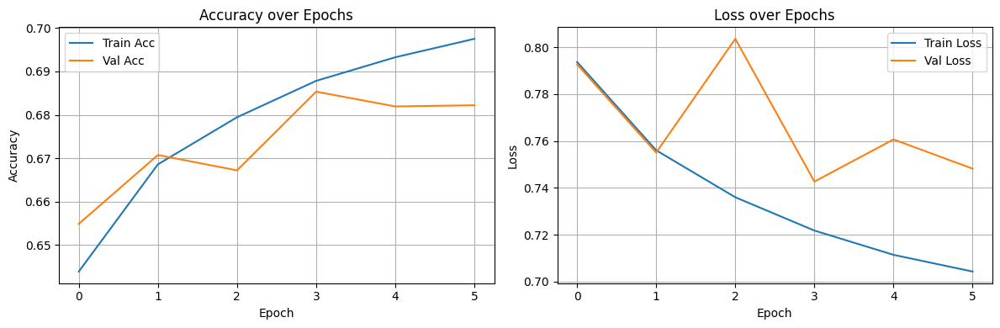

5746/5746 ━━━━━━━━━━━━━━━━━━━━ 64s 11ms/step
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 68s 12ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step


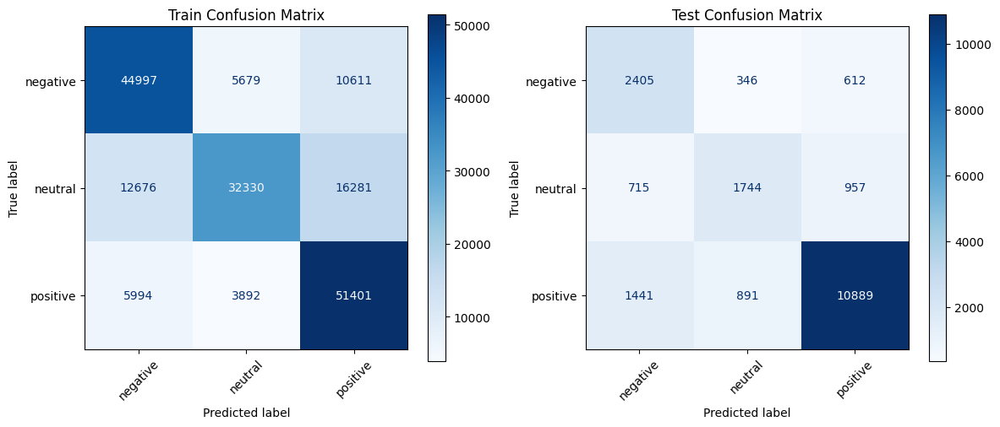


Classification Report - Train:

              precision    recall  f1-score   support

    negative       0.71      0.73      0.72     61287
     neutral       0.77      0.53      0.63     61287
    positive       0.66      0.84      0.74     61287

    accuracy                           0.70    183861
   macro avg       0.71      0.70      0.69    183861
weighted avg       0.71      0.70      0.69    183861


Classification Report - Test:

              precision    recall  f1-score   support

    negative       0.53      0.72      0.61      3363
     neutral       0.59      0.51      0.55      3416
    positive       0.87      0.82      0.85     13221

    accuracy                           0.75     20000
   macro avg       0.66      0.68      0.67     20000
weighted avg       0.77      0.75      0.76     20000


F1 Score Comparison:
Metric     | Train    | Test    
------------------------------
Macro      | 0.6944  | 0.6668
Micro      | 0.7001  | 0.7519
Weighted   | 0.6944  | 0.75

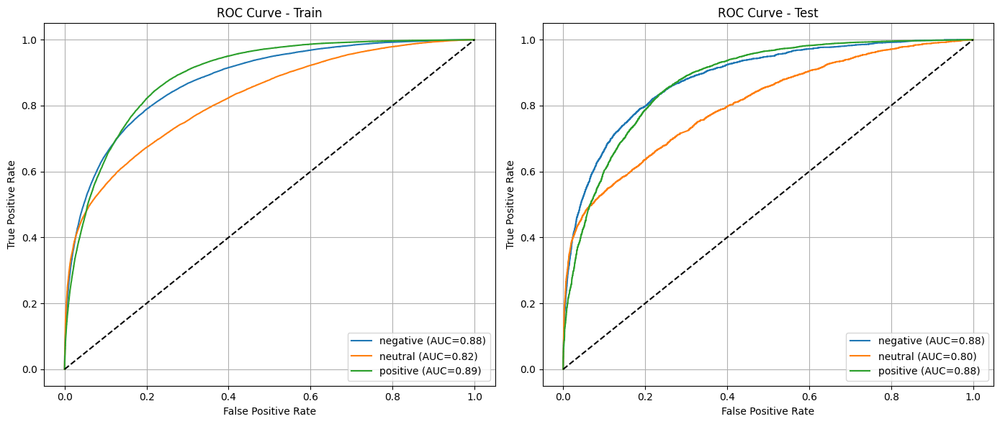

In [179]:
evaluate_model_classification(
    model=model,
    X_train=X_train_tok, y_train=y_train_enc,
    X_test=X_test_tok, y_test=y_test_enc,
    label_encoder=le
)

#### **Save the Model**

In [194]:
# Save the model
model.save("Causal_Model_1.0.h5")

## **Observations**

### Overfitting Check
- **Train Accuracy**: `70.01%`
- **Test Accuracy**: `75.19%`
- **Observation**:  
  - No signs of overfitting.
  - Validation accuracy is slightly better than training — a healthy indicator.
  - Training loss steadily decreases while validation loss stabilizes after a few fluctuations.

- **Conclusion**:  
  The model is generalizing well, with no overfitting behavior.

---

### Performance Across Classes

| Class     | Precision (Test) | Recall (Test) | F1 Score (Test) | AUC  |
|-----------|------------------|----------------|------------------|------|
| Negative  | 0.53             | 0.72           | 0.61             | 0.88 |
| Neutral   | 0.59             | 0.51           | 0.55             | 0.80 |
| Positive  | 0.87             | 0.82           | 0.85             | 0.88 |

- **Observation**:
  - The **neutral class is underperforming** across all metrics.
  - Positive class is dominating, likely due to clearer language cues or data imbalance.
  - Confusion matrices show neutral gets misclassified as both negative and positive.

- **Recommendation**:
  - Apply `class_weight` or **oversample** neutral class during training.
  - Explore contrastive loss or margin-based loss to separate semantically close classes.

---

### AUC vs Accuracy

- **Macro F1 (Test)**: `0.6668`  
- **Macro AUC**:
  - Negative: `0.88`
  - Neutral: `0.80`
  - Positive: `0.88`

- **Observation**:
  - AUC is significantly higher than F1, especially for the neutral class.
  - Indicates that the model ranks classes well but may not cross the right threshold to classify correctly.

- **Recommendation**:
  - Try **threshold tuning** (especially for neutral).
  - Consider **calibration techniques** like Platt scaling or temperature scaling.


# **Model Tuning**

### **Iteration #1**

In this iteration we will be addressing the below issues which were observed from the model observations mentioned above

- Mild overfitting
- Poor neutral-class performance
- Shallow model capacity

### Step 1 : Deeper Model Architecture implementation with More Dropout

In [188]:
def build_model(max_len, vocab_size, embedding_matrix, num_classes):
    inputs = keras.Input(shape=(max_len,), dtype=tf.int32)

    x = layers.Embedding(
        input_dim=vocab_size,
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        trainable=False,
        mask_zero=False,
    )(inputs)

    # Two transformer blocks
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=512, max_len=max_len)(x, inputs)
    x = layers.Dropout(0.4)(x)
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=100, max_len=max_len)(x, inputs)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs)
    return model

### Step 2 : Apply Class Weights

In [190]:
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(y_train_enc),
                                     y=y_train_enc)

class_weight_dict = {i: w for i, w in enumerate(class_weights)}
print("Class Weights:", class_weight_dict)

Class Weights: {0: 1.0, 1: 1.0, 2: 1.0}


### Model Building

In [191]:
model = build_model(
    max_len=MAX_LEN,
    vocab_size=embedding_matrix.shape[0],
    embedding_matrix=embedding_matrix,
    num_classes=len(le.classes_)
)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)
model.summary()

Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_51 (InputLayer)   │ (None, 50)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding_17 (Embedding)      │ (None, 50, 300)           │       3,000,600 │ input_layer_51[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_29   │ (None, 50, 300)           │         680,312 │ embedding_17[0][0],        │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_51[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_110 (Dropout)         │ (None, 50, 300)           │               0 │ causal_transformer_block_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_30   │ (None, 50, 300)           │         432,700 │ dropout_110[0][0],         │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_51[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling1d_22   │ (None, 300)               │               0 │ causal_transformer_block_… │
│ (GlobalAveragePooling1D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_113 (Dropout)         │ (None, 300)               │               0 │ global_average_pooling1d_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_146 (Dense)             │ (None, 128)               │          38,528 │ dropout_113[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_114 (Dropout)         │ (None, 128)               │               0 │ dense_146[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_147 (Dense)             │ (None, 3)                 │             387 │ dropout_114[0][0]          │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 4,152,527 (15.84 MB)

 Trainable params: 1,151,927 (4.39 MB)

 Non-trainable params: 3,000,600 (11.45 MB)

### Train the Model

In [192]:
model.fit(
    X_train_tok,
    y_train_enc,
    validation_data=(X_val_tok, y_val_enc),
    batch_size=64,
    epochs=8,
    callbacks=callbacks
)

Epoch 1/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 408s 140ms/step - accuracy: 0.5404 - loss: 0.9475 - val_accuracy: 0.6346 - val_loss: 0.9054
Epoch 2/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 385s 134ms/step - accuracy: 0.6355 - loss: 0.8187 - val_accuracy: 0.6413 - val_loss: 0.8940
Epoch 3/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 386s 134ms/step - accuracy: 0.6507 - loss: 0.7885 - val_accuracy: 0.6571 - val_loss: 0.8460
Epoch 4/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 390s 136ms/step - accuracy: 0.6623 - loss: 0.7675 - val_accuracy: 0.6617 - val_loss: 0.8206
Epoch 5/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 388s 135ms/step - accuracy: 0.6746 - loss: 0.7503 - val_accuracy: 0.6696 - val_loss: 0.8358
Epoch 6/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 397s 138ms/step - accuracy: 0.6790 - loss: 0.7414 - val_accuracy: 0.6595 - val_loss: 0.8360


### Model Evaluation


Accuracy:
Train Accuracy: 0.6734
Test Accuracy:  0.7319


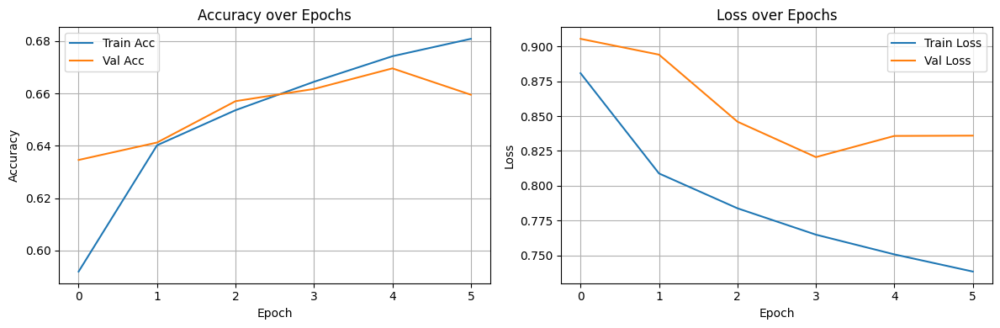

5746/5746 ━━━━━━━━━━━━━━━━━━━━ 109s 19ms/step
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 111s 19ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step


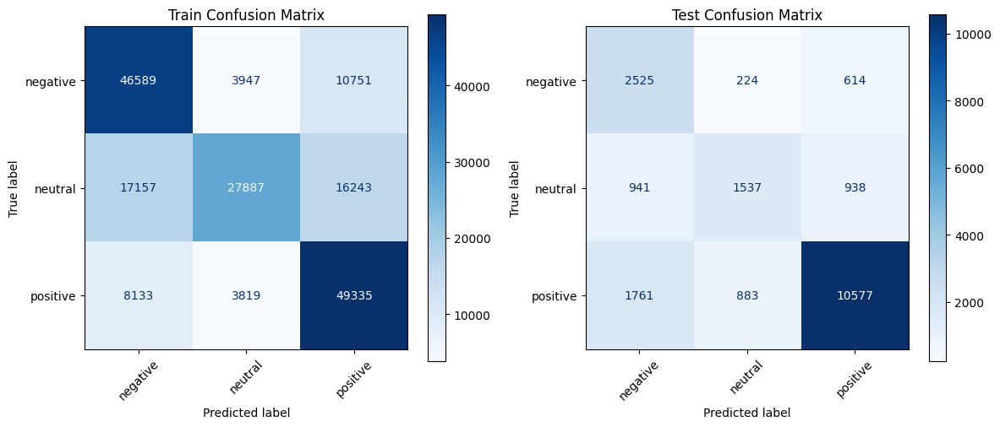


Classification Report - Train:

              precision    recall  f1-score   support

    negative       0.65      0.76      0.70     61287
     neutral       0.78      0.46      0.58     61287
    positive       0.65      0.80      0.72     61287

    accuracy                           0.67    183861
   macro avg       0.69      0.67      0.66    183861
weighted avg       0.69      0.67      0.66    183861


Classification Report - Test:

              precision    recall  f1-score   support

    negative       0.48      0.75      0.59      3363
     neutral       0.58      0.45      0.51      3416
    positive       0.87      0.80      0.83     13221

    accuracy                           0.73     20000
   macro avg       0.65      0.67      0.64     20000
weighted avg       0.76      0.73      0.74     20000


F1 Score Comparison:
Metric     | Train    | Test    
------------------------------
Macro      | 0.6640  | 0.6432
Micro      | 0.6734  | 0.7319
Weighted   | 0.6640  | 0.73

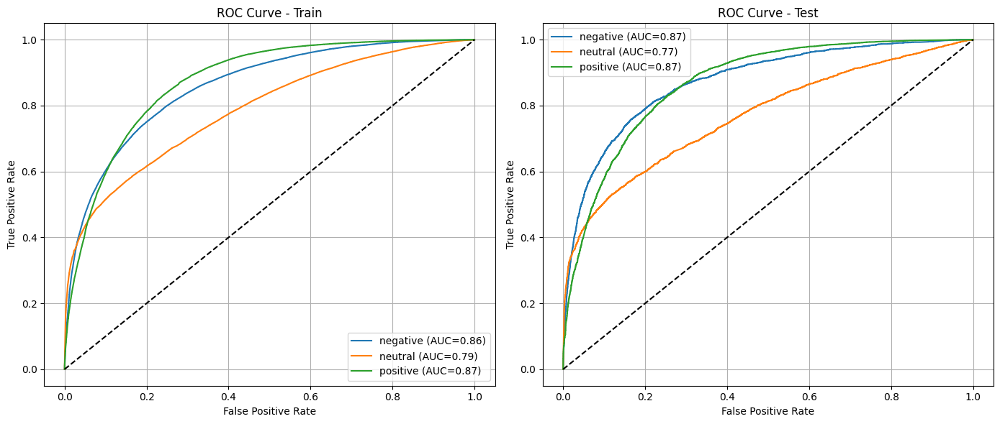

In [193]:
evaluate_model_classification(
    model=model,
    X_train=X_train_tok, y_train=y_train_enc,
    X_test=X_test_tok, y_test=y_test_enc,
    label_encoder=le
)

### Observation from Iteration 1

##  1.Check for Overfitting

- **Train Accuracy**: 67.3%  
- **Test Accuracy**: 73.2%

- The model still **generalizes well**. No signs of overfitting.
- **Training loss** shows a steady decrease.
- **Validation loss** plateaus smoothly, indicating proper regularization.

---

##  2.Check for Performance Across Classes

| Class     | Precision | Recall | F1 Score | AUC  |
|-----------|-----------|--------|----------|------|
| Negative  | 0.48      | 0.75   | 0.59     | 0.87 |
| Neutral   | 0.58      | 0.45   | 0.51     | 0.77 |
| Positive  | 0.87      | 0.80   | 0.83     | 0.87 |

-  The **neutral class** remains the weakest:
  - Lowest **recall** and **F1-score**.
  - Despite class weighting, the model struggles to distinguish neutral from **positive** and **negative**.
-  **AUC values** are strong across all classes, suggesting:
  - The model can distinguish between classes,
  - But **classification thresholds** or **decision boundaries** may need refinement.

---


#### Summary 



## **Iteration #2**



From the above Iteration 1 , The class imbalance still persists as the model gives low wightage and is not learning much from the neutral class. 


### Step 1: Re applying class weights

In [195]:
# Compute initial balanced class weights
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(y_train_enc),
                                     y=y_train_enc)

# Boost weight of neutral class manually
boost_factor = 1.4   # Tune this (e.g., 1.2 to 2.0)
class_weights[1] *= boost_factor  # index 1 is for neutral class

# Convert to dictionary for Keras
class_weight_dict = {i: w for i, w in enumerate(class_weights)}
print("Adjusted Class Weights:", class_weight_dict)


Adjusted Class Weights: {0: 1.0, 1: 1.4, 2: 1.0}


### Step 2: Update: Pre-Norm Transformer Block (LayerNorm before residual)

In [197]:
# Define the Transformer Block with Relative Causal Attention and Pre-Norm
class CausalTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, max_len):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.max_len = max_len
        self.head_dim = embed_dim // num_heads

        # Linear projections
        self.q_proj = layers.Dense(embed_dim)
        self.k_proj = layers.Dense(embed_dim)
        self.v_proj = layers.Dense(embed_dim)
        self.out_proj = layers.Dense(embed_dim)

        # Relative Position Embedding
        self.rel_pos_emb = RelativePositionEmbedding(max_len, self.head_dim)

        # Feedforward network with GELU
        self.ffn = keras.Sequential([
            layers.Dense(self.ff_dim, activation="gelu"),
            layers.Dense(self.embed_dim),
        ])

        # LayerNorm (applied before attention & FFN)
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(0.4)
        self.dropout2 = layers.Dropout(0.4)

    def call(self, inputs, tokens=None, training=None):
        batch_size, seq_len, _ = tf.shape(inputs)[0], tf.shape(inputs)[1], tf.shape(inputs)[2]

        # --- Attention block ---
        x_norm = self.layernorm1(inputs)  # pre-norm before attention
        q = self.q_proj(x_norm)
        k = self.k_proj(x_norm)
        v = self.v_proj(x_norm)

        q = tf.reshape(q, (batch_size, seq_len, self.num_heads, self.head_dim))
        k = tf.reshape(k, (batch_size, seq_len, self.num_heads, self.head_dim))
        v = tf.reshape(v, (batch_size, seq_len, self.num_heads, self.head_dim))

        q = tf.transpose(q, perm=[0, 2, 1, 3])
        k = tf.transpose(k, perm=[0, 2, 1, 3])
        v = tf.transpose(v, perm=[0, 2, 1, 3])

        rel_pos = self.rel_pos_emb(seq_len, seq_len)
        rel_pos = tf.transpose(rel_pos, [2, 0, 1])

        attn_logits = tf.einsum('bhqd,bhkd->bhqk', q, k)
        rel_logits = tf.einsum('bhqd,dqk->bhqk', q, rel_pos)
        attn_logits += rel_logits

        causal_mask = tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)
        causal_mask = tf.reshape(causal_mask, (1, 1, seq_len, seq_len))
        attn_logits = tf.where(causal_mask == 0, -1e9, attn_logits)

        attention_weights = tf.nn.softmax(attn_logits, axis=-1)
        attn_output = tf.matmul(attention_weights, v)
        attn_output = tf.transpose(attn_output, perm=[0, 2, 1, 3])
        attn_output = tf.reshape(attn_output, (batch_size, seq_len, self.embed_dim))

        attention_out = self.out_proj(attn_output)
        x = inputs + self.dropout1(attention_out, training=training)  # Residual connection

        # --- FFN block ---
        x_ffn = self.layernorm2(x)  # pre-norm before FFN
        ffn_out = self.ffn(x_ffn)
        return x + self.dropout2(ffn_out, training=training)  # Final residual


### Step 3: Tuning Transformer Depth and Feedforward Capacity

In [198]:
def build_model(max_len, vocab_size, embedding_matrix, num_classes):
    inputs = keras.Input(shape=(max_len,), dtype=tf.int32)

    x = layers.Embedding(
        input_dim=vocab_size,
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        trainable=False,
        mask_zero=False,
    )(inputs)

    # Two transformer blocks
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=512, max_len=max_len)(x, inputs)
    x = layers.Dropout(0.4)(x)
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=300, max_len=max_len)(x, inputs)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs)
    return model

### Step 4 : Applied learning rate scheduler

In [199]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=10000,
    decay_rate=0.95
)

### Model Building

In [200]:
model = build_model(
    max_len=MAX_LEN,
    vocab_size=embedding_matrix.shape[0],
    embedding_matrix=embedding_matrix,
    num_classes=len(le.classes_)
)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)
model.summary()

Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_54 (InputLayer)   │ (None, 50)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding_18 (Embedding)      │ (None, 50, 300)           │       3,000,600 │ input_layer_54[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_31   │ (None, 50, 300)           │         680,312 │ embedding_18[0][0],        │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_54[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_117 (Dropout)         │ (None, 50, 300)           │               0 │ causal_transformer_block_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_32   │ (None, 50, 300)           │         552,900 │ dropout_117[0][0],         │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_54[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling1d_23   │ (None, 300)               │               0 │ causal_transformer_block_… │
│ (GlobalAveragePooling1D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_120 (Dropout)         │ (None, 300)               │               0 │ global_average_pooling1d_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_160 (Dense)             │ (None, 128)               │          38,528 │ dropout_120[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_121 (Dropout)         │ (None, 128)               │               0 │ dense_160[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_161 (Dense)             │ (None, 3)                 │             387 │ dropout_121[0][0]          │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 4,272,727 (16.30 MB)

 Trainable params: 1,272,127 (4.85 MB)

 Non-trainable params: 3,000,600 (11.45 MB)

### Train the Model

In [201]:
model.fit(
    X_train_tok,
    y_train_enc,
    validation_data=(X_val_tok, y_val_enc),
    batch_size=64,
    epochs=8,
    callbacks=callbacks
)

Epoch 1/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 474s 164ms/step - accuracy: 0.5912 - loss: 0.9047 - val_accuracy: 0.6020 - val_loss: 0.8736
Epoch 2/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 472s 164ms/step - accuracy: 0.6428 - loss: 0.8151 - val_accuracy: 0.6537 - val_loss: 0.7948
Epoch 3/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 499s 174ms/step - accuracy: 0.6507 - loss: 0.7992 - val_accuracy: 0.6515 - val_loss: 0.8029
Epoch 4/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 504s 175ms/step - accuracy: 0.6542 - loss: 0.7944 - val_accuracy: 0.6529 - val_loss: 0.7971


### Model Evaluation


Accuracy:
Train Accuracy: 0.6561
Test Accuracy:  0.7024


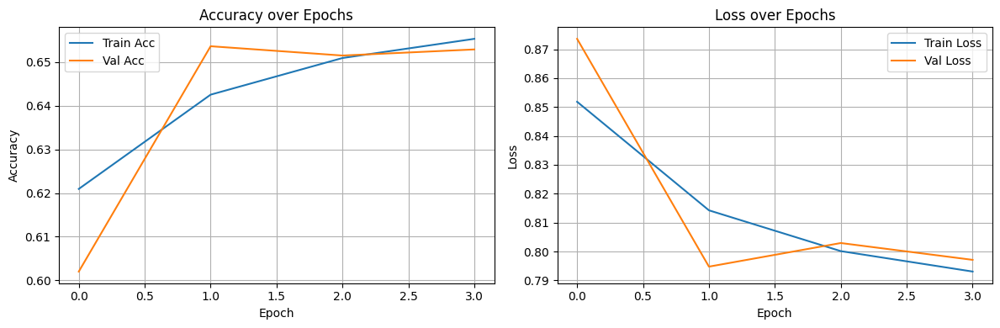

5746/5746 ━━━━━━━━━━━━━━━━━━━━ 151s 26ms/step
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 150s 26ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step


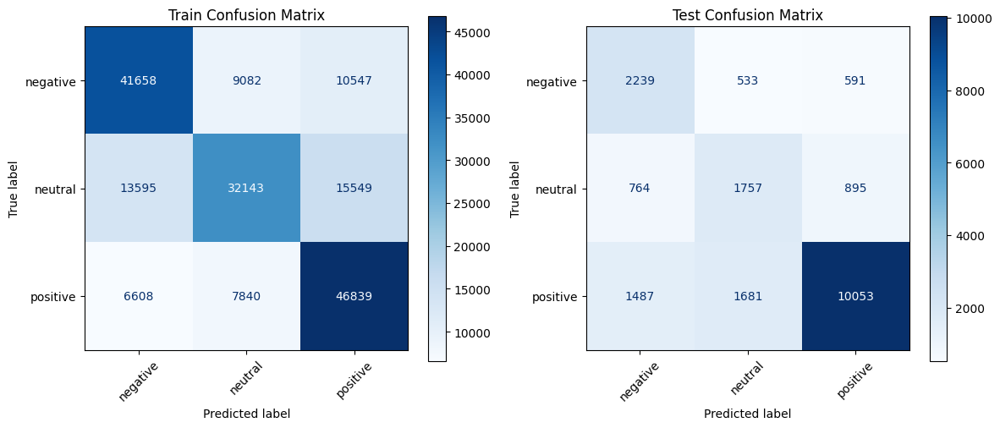


Classification Report - Train:

              precision    recall  f1-score   support

    negative       0.67      0.68      0.68     61287
     neutral       0.66      0.52      0.58     61287
    positive       0.64      0.76      0.70     61287

    accuracy                           0.66    183861
   macro avg       0.66      0.66      0.65    183861
weighted avg       0.66      0.66      0.65    183861


Classification Report - Test:

              precision    recall  f1-score   support

    negative       0.50      0.67      0.57      3363
     neutral       0.44      0.51      0.48      3416
    positive       0.87      0.76      0.81     13221

    accuracy                           0.70     20000
   macro avg       0.60      0.65      0.62     20000
weighted avg       0.74      0.70      0.71     20000


F1 Score Comparison:
Metric     | Train    | Test    
------------------------------
Macro      | 0.6523  | 0.6193
Micro      | 0.6561  | 0.7025
Weighted   | 0.6523  | 0.71

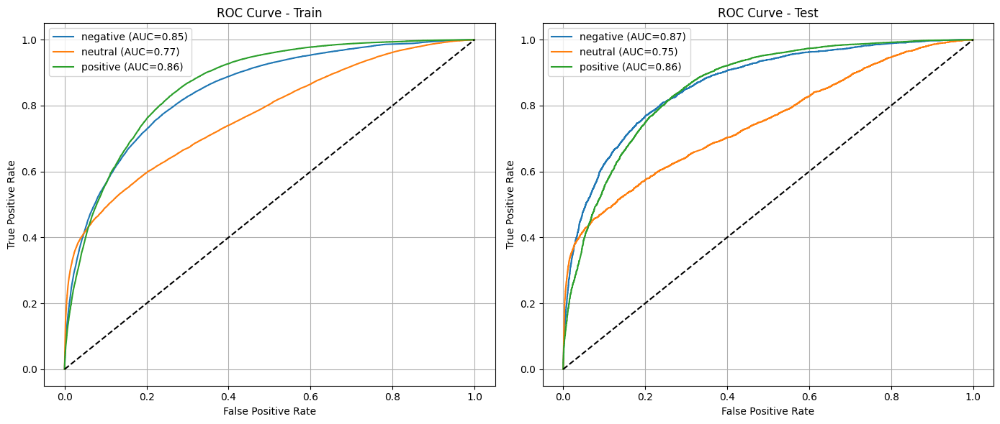

In [202]:
evaluate_model_classification(
    model=model,
    X_train=X_train_tok, y_train=y_train_enc,
    X_test=X_test_tok, y_test=y_test_enc,
    label_encoder=le
)

## Observations from Iteration 2

####  Check for Overfitting 
- **Accuracy**: Train: 65.6%, Test: 70.2%
- **Neutral class** still underperforming (F1 = 0.48, AUC = 0.75)
- No overfitting observed
- ROC-AUC for all classes is reasonable, but classification boundaries for neutral remain unclear


###  Performance Across Classes 

### Class-wise Metrics (Test Set)

| Class      | Precision | Recall | F1 Score | AUC  |
|------------|-----------|--------|----------|------|
| Negative   | 0.50      | 0.67   | 0.57     | 0.87 |
| Neutral    | **0.44**  | **0.51** | **0.48** | **0.75** |
| Positive   | 0.87      | 0.76   | 0.81     | 0.86 |

---

###  Observations

-  **Positive class** is the strongest performer with high precision (0.87), recall (0.76), and F1 score (0.81). It is well-separated from other classes.
-  **Neutral class** continues to underperform:
  - Lowest precision (0.44), recall (0.51), and F1 score (0.48).
  - It has the **lowest AUC (0.75)**, indicating difficulty in distinguishing this class.
  - Likely confusion arises from its semantic closeness to both positive and negative sentiments.
-  **Negative class** shows good recall (0.67), but low precision (0.50), suggesting it is over-predicted or confused with other classes.

---

###  Confusion Trends

- **Neutral → Positive** misclassifications: 895
- **Neutral → Negative** misclassifications: 764
- Indicates the model struggles to clearly separate neutral from polarized sentiment classes.

---

###  Overall Implications

- The model generalizes reasonably well.
- Improving **neutral class** prediction is the most critical next step.
- Further steps may involve:
  - Adding **auxiliary features** (e.g., emojis, hashtags, length buckets)
  - Exploring **focal loss**
  - Creating **custom sampling strategies** or fine-tuned class weights




## **Model Interpretability**

In [229]:
# Convert Series to clean list of strings
X_test_raw = X_test.fillna("").astype(str).tolist()

# Class names based on label encoder
class_names = le.classes_.tolist()

# Reuse your existing tokenizer logic inside LIME-compatible wrapper
def lime_predict(texts):
    sequences = tokenize_texts(texts, token_to_idx, max_len=MAX_LEN)
    return model.predict(sequences)

# Setup LIME
explainer = LimeTextExplainer(class_names=class_names)

# Choose a test instance to interpret
idx = 123  # Change this to any index of interest
text_instance = X_test_raw[idx]

# Generate explanation
exp = explainer.explain_instance(
    text_instance,
    lime_predict,
    num_features=10,
    top_labels=1
)

# Save explanation to HTML
exp.save_to_file("lime_explanation.html")
print("✅ LIME explanation saved to 'lime_explanation.html'")


157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step
✅ LIME explanation saved to 'lime_explanation.html'


In [230]:
# Load and display the saved HTML file in notebook
with open("lime_explanation.html", "r", encoding="utf-8") as f:
    html_content = f.read()

display(HTML(html_content))


### LIME Observations

Observation – Model Behavior:
The model is heavily driven by emotion-laden or morally positive keywords like freedom, integrity, supporter, etc.

The semantic context is ignored — e.g., the phrase non compliance is not highlighted, even though it might carry a neutral or negative connotation in certain domains (e.g., anti-vaccine, protests).

Words like morgan, percent, and canadian show up with low but nonzero contributions, which implies some semantic noise or bias in the embeddings or training data.

The model does not sufficiently suppress irrelevant or misleading words (e.g., morgan, percent), indicating a need for better regularization or feature filtering.

## **Iteration #3**

### Step 1: Add SpatialDropout to Embedding Layer

In [234]:
def build_model(max_len, vocab_size, embedding_matrix, num_classes):
    inputs = keras.Input(shape=(max_len,), dtype=tf.int32)

    x = layers.Embedding(
        input_dim=vocab_size,
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        trainable=False,
        mask_zero=False,
    )(inputs)

    x = SpatialDropout1D(0.2)(x)  # Helps mitigate over-reliance on tokens


    # Two transformer blocks
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=512, max_len=max_len)(x, inputs)
    x = layers.Dropout(0.4)(x)
    x = CausalTransformerBlock(embed_dim=embedding_matrix.shape[1], num_heads=3, ff_dim=300, max_len=max_len)(x, inputs)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs)
    return model

### Step 2: Adjust Class Weights again – Boost Neutral

In [235]:
# Compute initial balanced class weights
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(y_train_enc),
                                     y=y_train_enc)

# Boost weight of neutral class manually
boost_factor = 1.4   # Tune this (e.g., 1.2 to 2.0)
class_weights[1] *= boost_factor  # index 1 is for neutral class

# Convert to dictionary for Keras
class_weight_dict = {
    0: 1.0,  # negative
    1: 2.5,  # neutral 
    2: 1.0   # positive
}
print("Adjusted Class Weights:", class_weight_dict)


Adjusted Class Weights: {0: 1.0, 1: 2.5, 2: 1.0}


### Model Building

In [236]:
model = build_model(
    max_len=MAX_LEN,
    vocab_size=embedding_matrix.shape[0],
    embedding_matrix=embedding_matrix,
    num_classes=len(le.classes_)
)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)
model.summary()

Model: "functional_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_57 (InputLayer)   │ (None, 50)                │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ embedding_19 (Embedding)      │ (None, 50, 300)           │       3,000,600 │ input_layer_57[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ spatial_dropout1d             │ (None, 50, 300)           │               0 │ embedding_19[0][0]         │
│ (SpatialDropout1D)            │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_33   │ (None, 50, 300)           │         680,312 │ spatial_dropout1d[0][0],   │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_57[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_124 (Dropout)         │ (None, 50, 300)           │               0 │ causal_transformer_block_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ causal_transformer_block_34   │ (None, 50, 300)           │         552,900 │ dropout_124[0][0],         │
│ (CausalTransformerBlock)      │                           │                 │ input_layer_57[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling1d_24   │ (None, 300)               │               0 │ causal_transformer_block_… │
│ (GlobalAveragePooling1D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_127 (Dropout)         │ (None, 300)               │               0 │ global_average_pooling1d_… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_174 (Dense)             │ (None, 128)               │          38,528 │ dropout_127[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout_128 (Dropout)         │ (None, 128)               │               0 │ dense_174[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_175 (Dense)             │ (None, 3)                 │             387 │ dropout_128[0][0]          │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 4,272,727 (16.30 MB)

 Trainable params: 1,272,127 (4.85 MB)

 Non-trainable params: 3,000,600 (11.45 MB)

### Train the Model

In [237]:
model.fit(
    X_train_tok,
    y_train_enc,
    validation_data=(X_val_tok, y_val_enc),
    batch_size=64,
    epochs=8,
    callbacks=callbacks
)

Epoch 1/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 483s 167ms/step - accuracy: 0.5748 - loss: 0.9303 - val_accuracy: 0.6359 - val_loss: 0.8270
Epoch 2/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 497s 173ms/step - accuracy: 0.6290 - loss: 0.8391 - val_accuracy: 0.6431 - val_loss: 0.8006
Epoch 3/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 504s 176ms/step - accuracy: 0.6313 - loss: 0.8294 - val_accuracy: 0.6295 - val_loss: 0.8129
Epoch 4/8
2873/2873 ━━━━━━━━━━━━━━━━━━━━ 502s 175ms/step - accuracy: 0.6366 - loss: 0.8238 - val_accuracy: 0.6463 - val_loss: 0.8257


### Model Evaluation


Accuracy:
Train Accuracy: 0.6487
Test Accuracy:  0.6908


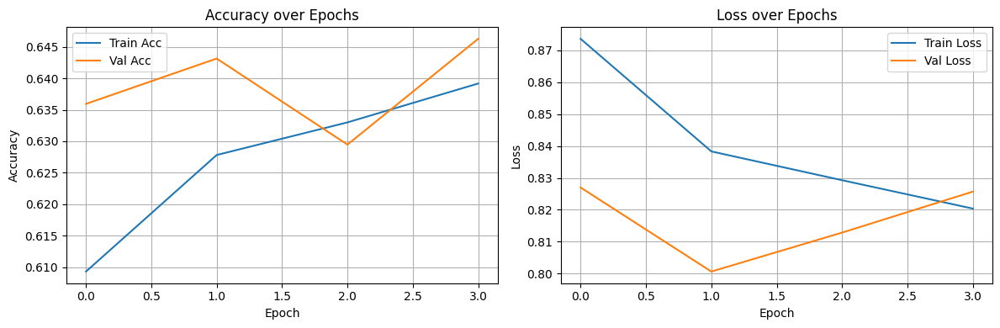

5746/5746 ━━━━━━━━━━━━━━━━━━━━ 159s 28ms/step
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 159s 28ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step
625/625 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step


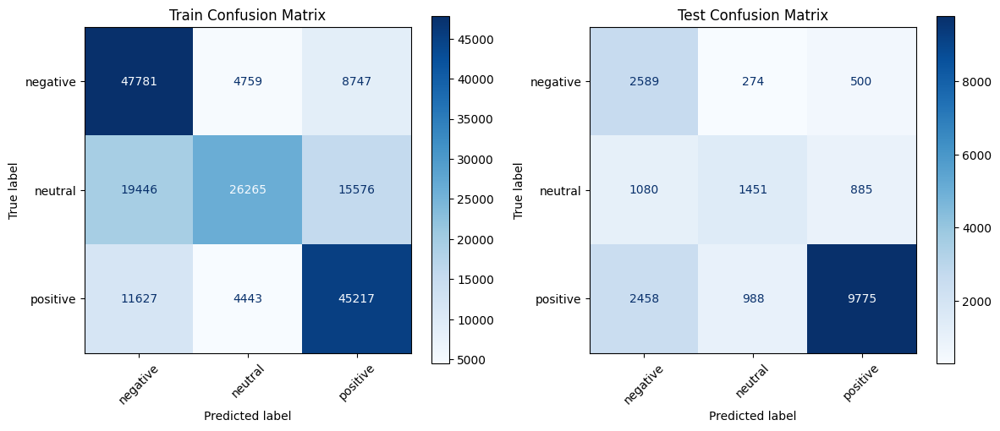


Classification Report - Train:

              precision    recall  f1-score   support

    negative       0.61      0.78      0.68     61287
     neutral       0.74      0.43      0.54     61287
    positive       0.65      0.74      0.69     61287

    accuracy                           0.65    183861
   macro avg       0.67      0.65      0.64    183861
weighted avg       0.67      0.65      0.64    183861


Classification Report - Test:

              precision    recall  f1-score   support

    negative       0.42      0.77      0.55      3363
     neutral       0.53      0.42      0.47      3416
    positive       0.88      0.74      0.80     13221

    accuracy                           0.69     20000
   macro avg       0.61      0.64      0.61     20000
weighted avg       0.74      0.69      0.70     20000


F1 Score Comparison:
Metric     | Train    | Test    
------------------------------
Macro      | 0.6387  | 0.6070
Micro      | 0.6487  | 0.6907
Weighted   | 0.6387  | 0.70

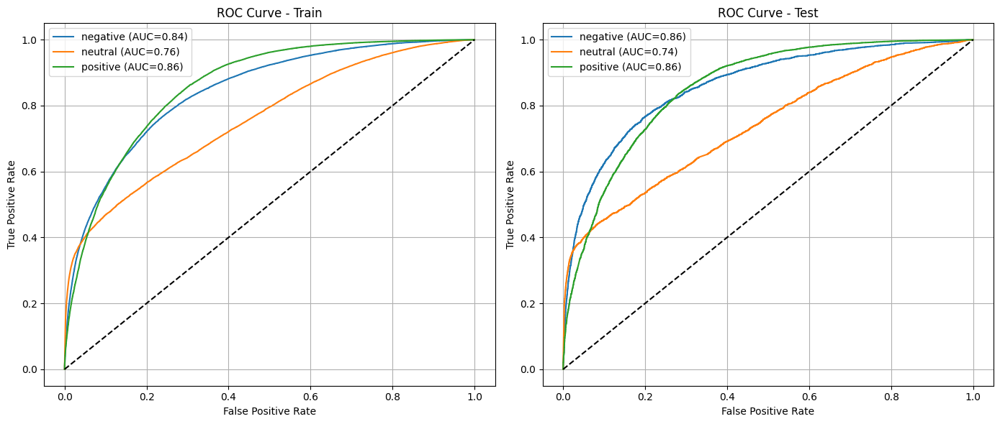

In [238]:
evaluate_model_classification(
    model=model,
    X_train=X_train_tok, y_train=y_train_enc,
    X_test=X_test_tok, y_test=y_test_enc,
    label_encoder=le
)

## Observations from Iteration 3

### Overall Accuracy
- **Train Accuracy:** `0.6487`
- **Test Accuracy:** `0.6908`

> Slight drop in accuracy from previous iteration — may indicate better regularization or mild underfitting.

---

### Loss Behavior
- **Train Loss:** Steadily decreasing.
- **Validation Loss:** Slight fluctuations, but no sharp increase — generalization is acceptable.
- No strong signs of overfitting.

---

###  Classification Performance per Class

| Class     | Precision | Recall | F1 Score | AUC  |
|-----------|-----------|--------|----------|------|
| Negative  | 0.42      | 0.77   | 0.55     | 0.86 |
| Neutral   | 0.53      | 0.42   | 0.47     | 0.74 |
| Positive  | 0.88      | 0.74   | 0.80     | 0.86 |

> -  **Neutral** class still underperforming despite weight boost.
> -  **Positive** class is robust and drives high weighted scores.
> -  **Negative** class has high recall, but low precision — possibly being confused with neutral or positive.

---

###  Confusion Matrix Observations
- Neutral class confusion is still high.
- Positive predictions dominate when the model is uncertain.
- Negative examples are often overpredicted.

---

###  F1 Score Summary

| Metric        | Train  | Test   |
|---------------|--------|--------|
| **Macro F1**  | 0.6387 | 0.6070 |
| **Micro F1**  | 0.6487 | 0.6907 |
| **Weighted**  | 0.6387 | 0.7027 |

> - Macro F1 dropped slightly → imbalance in class-wise performance.
> - Weighted F1 improved → due to strong positive-class performance.

---

### Check Model Interpretability

In [239]:
# Convert Series to clean list of strings
X_test_raw = X_test.fillna("").astype(str).tolist()

# Class names based on label encoder
class_names = le.classes_.tolist()

# Reuse your existing tokenizer logic inside LIME-compatible wrapper
def lime_predict(texts):
    sequences = tokenize_texts(texts, token_to_idx, max_len=MAX_LEN)
    return model.predict(sequences)

# Setup LIME
explainer = LimeTextExplainer(class_names=class_names)

# Choose a test instance to interpret
idx = 123  # Change this to any index of interest
text_instance = X_test_raw[idx]

# Generate explanation
exp = explainer.explain_instance(
    text_instance,
    lime_predict,
    num_features=10,
    top_labels=1
)

# Save explanation to HTML
exp.save_to_file("lime_explanation.html")
print("✅ LIME explanation saved to 'lime_explanation.html'")

157/157 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step
✅ LIME explanation saved to 'lime_explanation.html'


In [240]:
# Load and display the saved HTML file in notebook
with open("lime_explanation.html", "r", encoding="utf-8") as f:
    html_content = f.read()

display(HTML(html_content))


#  LIME Interpretation Summary

###  **Input Text**
> `morgan percent agree canadian trucker supporter freedom convoy right peaceful non compliance laugh joyous strong full integrity do honk`

---

###  **Model Prediction**
- **Predicted Class**: `positive` (with high confidence)
- **Prediction Probabilities**:
  - Negative: `0.07`
  - Neutral: `0.09`
  - **Positive: `0.85`**

---

###  **Top Influential Words for "Positive" Prediction**

| Word         | Contribution to "positive" |
|--------------|----------------------------|
| **freedom**  | **0.19** (strongest)  
| **integrity**| 0.10  
| **supporter**| 0.07  
| compliance   | 0.04  
| strong       | 0.03  
| peaceful     | 0.02  
| laugh        | 0.03  
| agree        | 0.03  
| non          | 0.02  
| morgan       | 0.05

---

###  **Model Behavior Insights**
- The model is heavily **biased toward positive sentiment** for emotionally charged words like:
  - `"freedom"`, `"integrity"`, `"supporter"`, `"peaceful"`, `"strong"`
- These words may appear in **neutral or negative** contexts (e.g., protest, political tweets).
- The **neutral class is underweighted**, even though the tweet lacks clear sentiment cues.

---

###  **What's Going Wrong**
- The model **over-associates positive sentiment** to trigger words regardless of context.
- **Neutral** classification is weak — it only gets 9% probability despite the factual, unemotional tone.
- There’s insufficient understanding of **context or negation** in the input.




# **Additional Steps to improve model performance** 

1. **Add neutral-context training examples**:
   - Include samples like: `"freedom of speech is debated"` or `"supporter presence was noted"` labeled as **neutral**.
2. **Contextual fine-tuning**:
   - Use adversarial training with pairs like:
     - `"support freedom of press"` (neutral)
     - `"support freedom to exploit"` (negative)
3. **LIME-based counterfactual analysis**:
   - Mask `"freedom"` or `"supporter"` and re-run to test attention shifts.
4. **Automate LIME sampling**:
   - Apply to a batch of neutral-class examples to check for recurring attribution patterns.


# 📘 Notebook: Non-causal Transformer model using pretrained word2vec.ipynb

#**Q4. Non-causal Transformer model using pretrained word2vec (CBOW or Skipgram and any vector size from 64 to 300) with position embeddings**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
import nltk
from tqdm import tqdm
tqdm.pandas()

from sklearn.metrics import classification_report, accuracy_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

import re
# import emoji
import multiprocessing

from multiprocessing import Pool

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import os
import warnings


#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings('ignore')

import tensorflow as tf


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, Dropout, Dense, LayerNormalization,
                                     MultiHeadAttention, GlobalAveragePooling1D, Lambda)
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import classification_report
from gensim.models import KeyedVectors
import gensim.downloader as api
import matplotlib.pyplot as plt

In [ ]:
pip install tqdm

# Pre trained word2vec model with 300D

In [ ]:
pip install Gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 90.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 115.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 16.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
thinc 8.3.6 re

In [ ]:
sampled_df=pd.read_csv("preprocessed_data.csv")

In [ ]:
sampled_df.head()

,Tweet,Sentiment,Cleaned_Tweet,Spell_Checked_Tweet,Negated_Tweet,Contains_Emoji
0,Ottawa Police shoot RUBBER BULLETS into crowd ...,Positive,ottawa police shoot rubber bullets into crowd ...,ottawa police shoot rubber bullets into crowd ...,ottawa police shoot rubber bullets into crowd ...,False
1,A former Mountie and member of Prime Minister ...,Positive,a former mountie and member of prime minister ...,a former mountie and member of prime minister ...,a former mountie and member of prime minister ...,False
2,@PierrePoilievre It’s already the freest count...,Positive,its already the freest country stop trying to...,its already the freest country stop trying to ...,it s already the freest country stop trying to...,False
3,@RobynUrback Ban ministers from the Very progr...,Positive,ban ministers from the very progressive freed...,ban ministers from the very progressive freedo...,ban ministers from the very progressive freedo...,False
4,Three songs have been stuck in my head the pas...,Positive,three songs have been stuck in my head the pas...,three songs have been stuck in my head the pas...,three songs have been stuck in my head the pas...,False


In [ ]:
sampled_df.isnull().sum()

,0
Tweet,0
Sentiment,0
Cleaned_Tweet,2
Spell_Checked_Tweet,0
Negated_Tweet,0
Contains_Emoji,0


In [ ]:
# sampled_df.to_csv("preprocessed_data.csv", index=False, encoding='utf-8')

# Data splitting

In [ ]:
from sklearn.model_selection import train_test_split

# split into train (80%) and temp (20%)
train_df, temp_df = train_test_split(
    sampled_df,
    test_size=0.2,
    stratify=sampled_df["Sentiment"],
    random_state=42
)

# Split temp into validation and test
val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df["Sentiment"],
    random_state=42
)


print(f"Train: {len(train_df)} rows")
print(f"Validation: {len(val_df)} rows")
print(f"Test: {len(test_df)} rows")


Train: 84107 rows
Validation: 10513 rows
Test: 10514 rows


In [ ]:
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)


# Label encoding Sentiment column

In [ ]:

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Fitting
train_df['Sentiment'] = label_encoder.fit_transform(train_df['Sentiment'])

# Apply the same transformation to the validation and test sets
val_df['Sentiment'] = label_encoder.transform(val_df['Sentiment'])
test_df['Sentiment'] = label_encoder.transform(test_df['Sentiment'])


In [ ]:
# label encoding for Positive, Negative, and Neutral
print("Label Encoding Mapping:")
for label, encoding in zip(label_encoder.classes_, range(len(label_encoder.classes_))):
    print(f"{label}: {encoding}")


Label Encoding Mapping:
Negative: 0
Neutral: 1
Positive: 2


In [ ]:
test_df.head()

,Tweet,Sentiment,Cleaned_Tweet,Spell_Checked_Tweet,Negated_Tweet,Contains_Emoji
0,"@CTVNews The pigs and the so-called ""freedom"" ...",0,the pigs and the socalled freedom convoy have...,the pigs and the socalled freedom convoy have ...,the pigs and the so called freedom convoy hav...,False
1,Banana Republics all over the world are callin...,1,banana republics all over the world are callin...,banana republics all over the world are callin...,banana republics all over the world are callin...,False
2,@FringedCanuck Just because she likes the PPC?...,2,just because she likes the ppc quit dividing ...,just because she likes the ppc quit dividing c...,just because she likes the ppc quit dividin...,False
3,Grande #Djokovic 👏👏👏\n\n#TrudeauTyranny \n\n#F...,1,grande,grand,grand,False
4,@DianaGlobalNews The simple truth is that if y...,1,the simple truth is that if you support the c...,the simple truth is that if you support the co...,the simple truth is that if you support the co...,False


# Tokenization and Padding

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer


vocab_size = 10000

# tokenizer
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")

# fitting on train data
tokenizer.fit_on_texts(train_df["Spell_Checked_Tweet"])





In [ ]:

# maxlen = max([len(tweet.split()) for tweet in train_df["Negated_Tweet"]])
maxlen=150

# Converting texts to sequences
train_sequences = tokenizer.texts_to_sequences(train_df["Spell_Checked_Tweet"])
val_sequences = tokenizer.texts_to_sequences(val_df["Spell_Checked_Tweet"])
test_sequences = tokenizer.texts_to_sequences(test_df["Spell_Checked_Tweet"])

# Padding the sequences to the same length (maxlen)
train_sequences_padded = pad_sequences(train_sequences, maxlen=maxlen, padding='post', truncating='post')
val_sequences_padded = pad_sequences(val_sequences, maxlen=maxlen, padding='post', truncating='post')
test_sequences_padded = pad_sequences(test_sequences, maxlen=maxlen, padding='post', truncating='post')

print(f"Train sequences shape: {train_sequences_padded.shape}")
print(f"Validation sequences shape: {val_sequences_padded.shape}")
print(f"Test sequences shape: {test_sequences_padded.shape}")


Train sequences shape: (84107, 150)
Validation sequences shape: (10513, 150)
Test sequences shape: (10514, 150)


# Pretrained Google news Word2Vec with 300 dimensions

In [ ]:
import gensim.downloader as api

# Load pretrained Word2Vec model
w2v_model = api.load("word2vec-google-news-300")
embedding_dim = w2v_model.vector_size


[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
print(f"Total words in Word2Vec model: {len(w2v_model.key_to_index)}")

Total words in Word2Vec model: 3000000


In [ ]:

# embedding matrix
vocab_size = min(10000, len(tokenizer.word_index) + 1)
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, idx in tokenizer.word_index.items():
    if idx < vocab_size:
        if word in w2v_model:
            embedding_matrix[idx] = w2v_model[word]
        else:
            # Random initialization for OOV words
            embedding_matrix[idx] = np.random.normal(scale=0.6, size=(embedding_dim,))


In [ ]:
# oov_words = []
# for word, idx in tokenizer.word_index.items():
#     if word not in w2v_model:
#         oov_words.append(word)

# # few OOV words
# print("OOV Words (not in pretrained Word2Vec model):")
# print(oov_words[:10])


OOV Words (not in pretrained Word2Vec model):
['<OOV>', 'a', 'to', 'of', 'and', 'trudeau', 'covid', 'notis', 'gofundme', 'notwas']


In [ ]:
covered = 0
for word, idx in tokenizer.word_index.items():
    if idx < vocab_size and word in w2v_model:
        covered += 1

print(f"Coverage: {covered / vocab_size:.2%}")


Coverage: 94.79%


#Basic Model 1

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models


from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, Dropout, Dense, LayerNormalization,
                                     MultiHeadAttention, GlobalAveragePooling1D, Lambda)
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import classification_report
from gensim.models import KeyedVectors
import gensim.downloader as api
import matplotlib.pyplot as plt

#  positional encoding layer
class PositionalEmbedding(layers.Layer):
    def __init__(self, vocab_size, embedding_dim, max_len, embedding_matrix, **kwargs):
        super().__init__(**kwargs)
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.max_len = max_len
        self.embedding_matrix = embedding_matrix
        self.token_embed = layers.Embedding(
            input_dim=vocab_size,
            output_dim=embedding_dim,
            weights=[embedding_matrix],
            trainable=False,
        )
        self.pos_embed = layers.Embedding(input_dim=max_len, output_dim=embedding_dim)

    def call(self, x):
        maxlen = tf.shape(x)[1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_embed(positions)
        x = self.token_embed(x)
        return x + positions

    def get_config(self):
        config = super().get_config()
        config.update({
            "vocab_size": self.vocab_size,
            "embedding_dim": self.embedding_dim,
            "max_len": self.max_len,
            "embedding_matrix": self.embedding_matrix.tolist(), # Convert numpy array to list for serialization
        })
        return config

# Parameters
num_classes = 3
dropout_rate = 0.1

# Model
inputs = layers.Input(shape=(maxlen,))
x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

# Transformer block
attention_output = layers.MultiHeadAttention(num_heads=2, key_dim=embedding_dim)(x, x)
x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)
ff_output = layers.Dense(128, activation='relu')(x)
ff_output = layers.Dense(embedding_dim)(ff_output)
x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

# Pooling + Dense
x = layers.GlobalAveragePooling1D()(x)
x = layers.Dropout(dropout_rate)(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(dropout_rate)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positional_embeddi… │ (None, 150, 300)  │  3,045,000 │ input_layer[0][0] │
│ (PositionalEmbeddi… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 150, 300)  │    722,100 │ positional_embed… │
│ (MultiHeadAttentio… │                   │            │ positional_embed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 150, 300)  │          0 │ positional_embed… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 150, 300)  │        600 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 150, 128)  │     38,528 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 150, 300)  │     38,700 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 150, 300)  │          0 │ layer_normalizat… │
│                     │                   │            │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 150, 300)  │        600 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 300)       │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 300)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │     19,264 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 64)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 3)         │        195 │ dropout_2[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,864,987 (14.74 MB)

 Trainable params: 864,987 (3.30 MB)

 Non-trainable params: 3,000,000 (11.44 MB)

In [ ]:
# Train the model
history = model.fit(
    train_sequences_padded,
    train_df["Sentiment"],
    validation_data=(val_sequences_padded, val_df["Sentiment"]),
    epochs=15,
    batch_size=64,
    verbose=1
)


Epoch 1/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - accuracy: 0.5337 - loss: 0.9630 - val_accuracy: 0.6173 - val_loss: 0.8223
Epoch 2/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 71s 27ms/step - accuracy: 0.6098 - loss: 0.8413 - val_accuracy: 0.6294 - val_loss: 0.8064
Epoch 3/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - accuracy: 0.6255 - loss: 0.8159 - val_accuracy: 0.6367 - val_loss: 0.7919
Epoch 4/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - accuracy: 0.6364 - loss: 0.7934 - val_accuracy: 0.6432 - val_loss: 0.7921
Epoch 5/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - accuracy: 0.6412 - loss: 0.7862 - val_accuracy: 0.6325 - val_loss: 0.7941
Epoch 6/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - accuracy: 0.6523 - loss: 0.7737 - val_accuracy: 0.6598 - val_loss: 0.7643
Epoch 7/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - accuracy: 0.6586 - loss: 0.7629 - val_accuracy: 0.6579 - val_loss: 0.7534
Epoch 8/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - accuracy: 0.6668 -

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import LabelBinarizer
import numpy as np

def evaluate_model(model, data, labels, data_name="Data"):


    preds = model.predict(data)

    # predicted class labels
    preds_class = np.argmax(preds, axis=1)

    # Accuracy
    acc = accuracy_score(labels, preds_class)
    print(f"{data_name} Accuracy: {acc:.4f}")

    # F1 Score (Macro Average)
    f1 = f1_score(labels, preds_class, average='macro')
    print(f"{data_name} Macro F1 Score: {f1:.4f}")

    # Macro AUC Score (One-vs-Rest)
    auc_score = roc_auc_score(labels, preds, multi_class='ovr', average='macro')
    print(f"{data_name} Macro AUC Score: {auc_score:.4f}")

    # Classification Report
    print(f"{data_name} Classification Report:")
    print(classification_report(labels, preds_class))

    # Confusion Matrix
    cm = confusion_matrix(labels, preds_class)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=["Negative", "Neutral", "Positive"], yticklabels=["Negative", "Neutral", "Positive"])
    plt.title(f"{data_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # ROC Curve and AUC for each class
    lb = LabelBinarizer()
    labels_bin = lb.fit_transform(labels)

    plt.figure(figsize=(8, 6))
    for i in range(labels_bin.shape[1]):
        fpr, tpr, _ = roc_curve(labels_bin[:, i], preds[:, i])  # ROC for each class
        auc = roc_auc_score(labels_bin[:, i], preds[:, i])  # AUC for the class
        print(f"{data_name} Class {i} AUC: {auc:.4f}")

        plt.plot(fpr, tpr, label=f'Class {i} ROC curve (AUC = {auc:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{data_name} ROC Curve')
    plt.legend(loc='lower right')
    plt.show()




2629/2629 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step
Train Accuracy: 0.7020
Train Macro F1 Score: 0.6984
Train Macro AUC Score: 0.8728
Train Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.79      0.72     27984
           1       0.79      0.55      0.65     28144
           2       0.69      0.76      0.72     27979

    accuracy                           0.70     84107
   macro avg       0.71      0.70      0.70     84107
weighted avg       0.71      0.70      0.70     84107



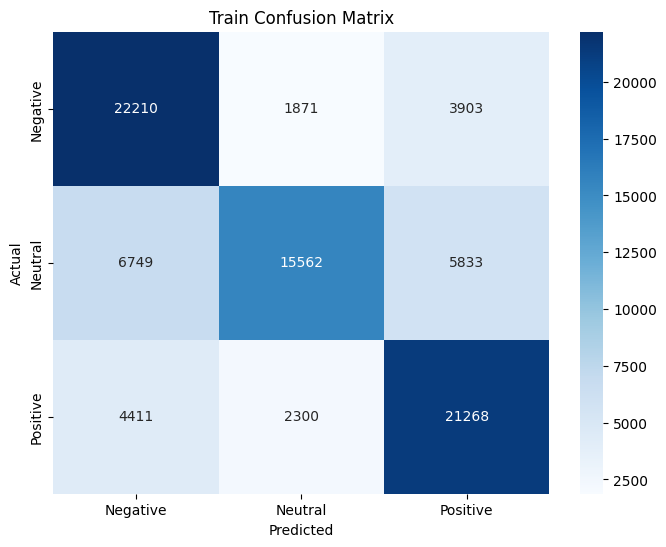

Train Class 0 AUC: 0.8916
Train Class 1 AUC: 0.8408
Train Class 2 AUC: 0.8859


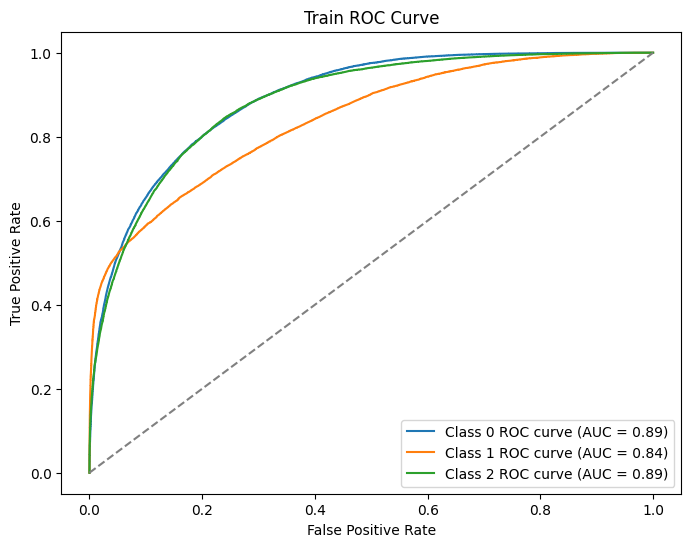

329/329 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
Test Accuracy: 0.6792
Test Macro F1 Score: 0.6762
Test Macro AUC Score: 0.8508
Test Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.76      0.70      3498
           1       0.76      0.54      0.63      3518
           2       0.66      0.74      0.70      3498

    accuracy                           0.68     10514
   macro avg       0.69      0.68      0.68     10514
weighted avg       0.69      0.68      0.68     10514



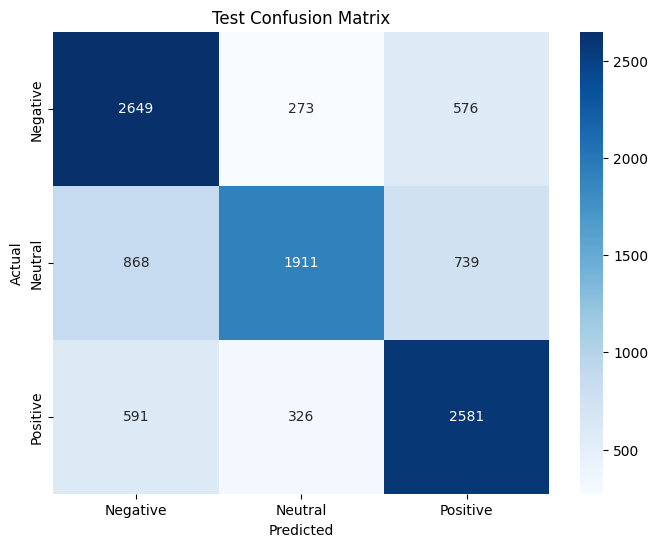

Test Class 0 AUC: 0.8674
Test Class 1 AUC: 0.8201
Test Class 2 AUC: 0.8649


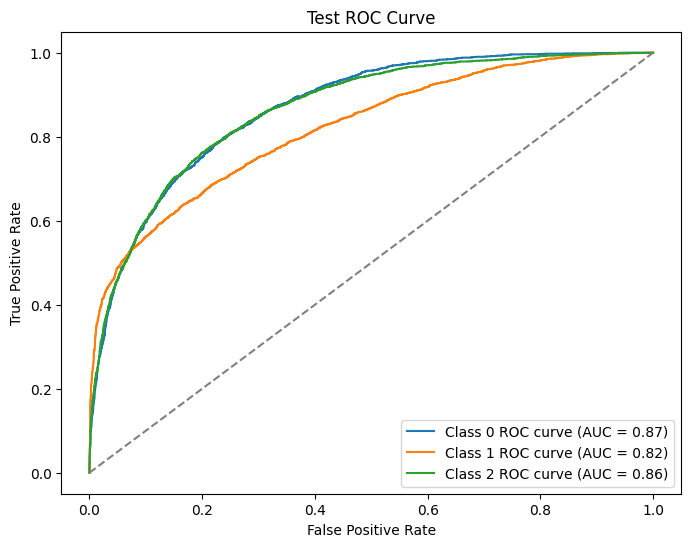

In [ ]:
# Evaluation
evaluate_model(model, train_sequences_padded, train_df["Sentiment"], "Train")

evaluate_model(model, test_sequences_padded, test_df["Sentiment"], "Test")


# Model

1. Adding weightage to neutral class


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ReduceLROnPlateau


from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, Dropout, Dense, LayerNormalization,
                                     MultiHeadAttention, GlobalAveragePooling1D, Lambda)
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import classification_report
from gensim.models import KeyedVectors
import gensim.downloader as api
import matplotlib.pyplot as plt

# #  positional encoding layer
# class PositionalEmbedding(layers.Layer):
#     def __init__(self, vocab_size, embedding_dim, max_len, embedding_matrix):
#         super().__init__()
#         self.token_embed = layers.Embedding(
#             input_dim=vocab_size,
#             output_dim=embedding_dim,
#             weights=[embedding_matrix],
#             trainable=False,
#         )
#         self.pos_embed = layers.Embedding(input_dim=max_len, output_dim=embedding_dim)

#     def call(self, x):
#         maxlen = tf.shape(x)[1]
#         positions = tf.range(start=0, limit=maxlen, delta=1)
#         positions = self.pos_embed(positions)
#         x = self.token_embed(x)
#         return x + positions


class PositionalEmbedding(layers.Layer):
    def __init__(self, vocab_size, embedding_dim, max_len, embedding_matrix, **kwargs):
        super().__init__(**kwargs)
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.max_len = max_len
        self.embedding_matrix = embedding_matrix

        self.token_embed = layers.Embedding(
            input_dim=vocab_size,
            output_dim=embedding_dim,
            weights=[embedding_matrix],
            trainable=False
        )
        self.pos_embed = layers.Embedding(input_dim=max_len, output_dim=embedding_dim)

    def call(self, x):
        maxlen = tf.shape(x)[1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_embed(positions)
        x = self.token_embed(x)
        return x + positions

    def get_config(self):
        config = super().get_config()
        config.update({
            'vocab_size': self.vocab_size,
            'embedding_dim': self.embedding_dim,
            'max_len': self.max_len,

        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config, embedding_matrix=None)

# Parameters
num_classes = 3
dropout_rate = 0.1

# Model
inputs = layers.Input(shape=(maxlen,))
x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

# Transformer block
attention_output = layers.MultiHeadAttention(num_heads=2, key_dim=embedding_dim)(x, x)
x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)
ff_output = layers.Dense(128, activation='relu')(x)
ff_output = layers.Dense(embedding_dim)(ff_output)
x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

# Pooling + Dense
x = layers.GlobalAveragePooling1D()(x)
x = layers.Dropout(dropout_rate)(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(dropout_rate)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model1 = models.Model(inputs=inputs, outputs=outputs)
model1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

class_weights = {
    0: 1.0,  # Negative
    1: 1.2,  # Neutral
    2: 1.0   # Positive
}

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)




model1.summary()



Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 150)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positional_embeddi… │ (None, 150, 300)  │  3,045,000 │ input_layer_4[0]… │
│ (PositionalEmbeddi… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 150, 300)  │    722,100 │ positional_embed… │
│ (MultiHeadAttentio… │                   │            │ positional_embed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 150, 300)  │          0 │ positional_embed… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 150, 300)  │        600 │ add_8[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 150, 128)  │     38,528 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, 150, 300)  │     38,700 │ dense_16[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 150, 300)  │          0 │ layer_normalizat… │
│                     │                   │            │ dense_17[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 150, 300)  │        600 │ add_9[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 300)       │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_13          │ (None, 300)       │          0 │ global_average_p… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_18 (Dense)    │ (None, 64)        │     19,264 │ dropout_13[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 64)        │          0 │ dense_18[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_19 (Dense)    │ (None, 3)         │        195 │ dropout_14[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,864,987 (14.74 MB)

 Trainable params: 864,987 (3.30 MB)

 Non-trainable params: 3,000,000 (11.44 MB)

In [ ]:
# Train the model
history = model1.fit(
    train_sequences_padded,
    train_df["Sentiment"],
    validation_data=(val_sequences_padded, val_df["Sentiment"]),
    epochs=15,
    batch_size=64,
    class_weight=class_weights,
    callbacks=[reduce_lr],
    verbose=1
)


Epoch 1/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 50s 33ms/step - accuracy: 0.5312 - loss: 1.0172 - val_accuracy: 0.6204 - val_loss: 0.8274 - learning_rate: 0.0010
Epoch 2/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 75s 31ms/step - accuracy: 0.6085 - loss: 0.8980 - val_accuracy: 0.6320 - val_loss: 0.7993 - learning_rate: 0.0010
Epoch 3/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - accuracy: 0.6215 - loss: 0.8708 - val_accuracy: 0.6363 - val_loss: 0.8014 - learning_rate: 0.0010
Epoch 4/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - accuracy: 0.6337 - loss: 0.8524 - val_accuracy: 0.6435 - val_loss: 0.7823 - learning_rate: 0.0010
Epoch 5/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - accuracy: 0.6410 - loss: 0.8399 - val_accuracy: 0.6326 - val_loss: 0.7931 - learning_rate: 0.0010
Epoch 6/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - accuracy: 0.6447 - loss: 0.8302 - val_accuracy: 0.6491 - val_loss: 0.7761 - learning_rate: 0.0010
Epoch 7/15
1315/1315 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - accura

2629/2629 ━━━━━━━━━━━━━━━━━━━━ 14s 5ms/step
Train Accuracy: 0.7109
Train Macro F1 Score: 0.7096
Train Macro AUC Score: 0.8818
Train Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.71      0.72     27984
           1       0.73      0.63      0.67     28144
           2       0.68      0.79      0.73     27979

    accuracy                           0.71     84107
   macro avg       0.71      0.71      0.71     84107
weighted avg       0.71      0.71      0.71     84107



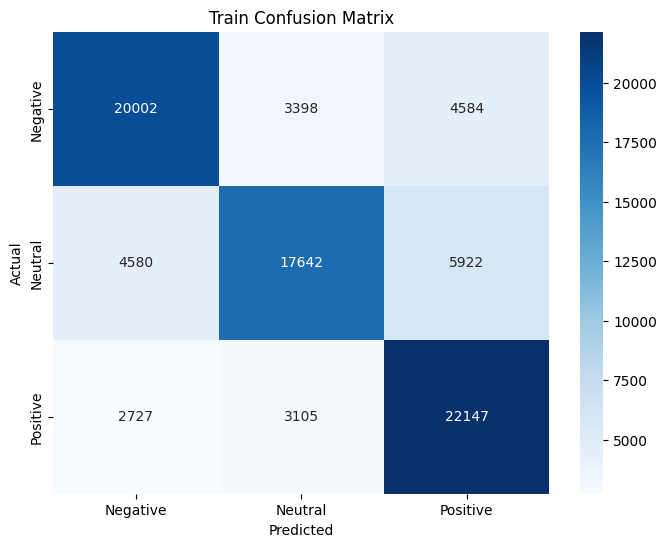

Train Class 0 AUC: 0.8969
Train Class 1 AUC: 0.8569
Train Class 2 AUC: 0.8917


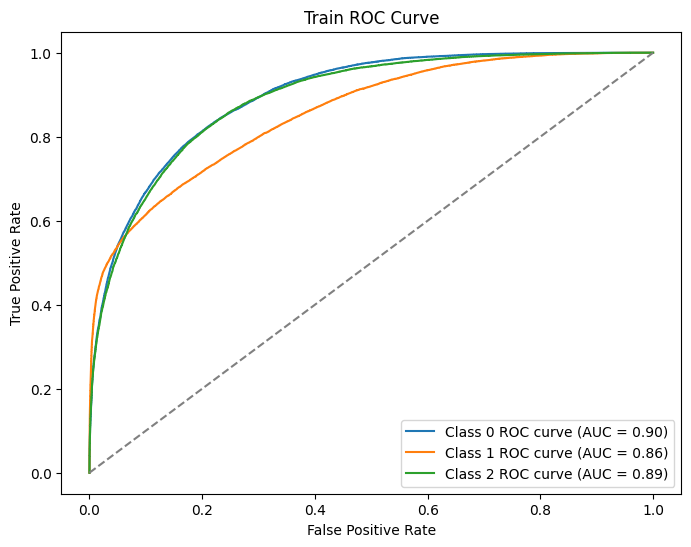

329/329 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
Test Accuracy: 0.6800
Test Macro F1 Score: 0.6789
Test Macro AUC Score: 0.8537
Test Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.67      0.69      3498
           1       0.69      0.61      0.65      3518
           2       0.65      0.76      0.70      3498

    accuracy                           0.68     10514
   macro avg       0.68      0.68      0.68     10514
weighted avg       0.68      0.68      0.68     10514



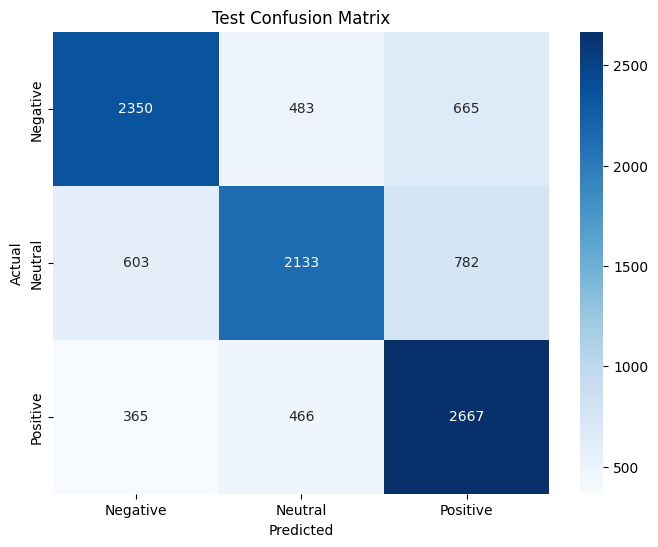

Test Class 0 AUC: 0.8708
Test Class 1 AUC: 0.8231
Test Class 2 AUC: 0.8671


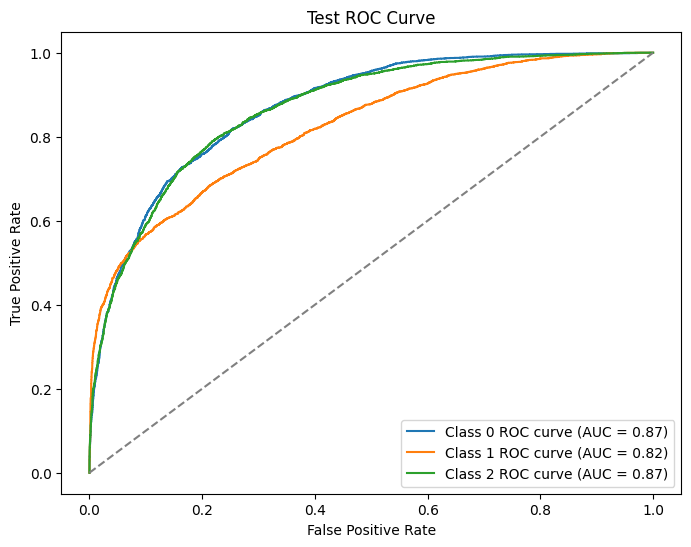

In [ ]:
# Evaluation
evaluate_model(model1, train_sequences_padded, train_df["Sentiment"], "Train")

evaluate_model(model1, test_sequences_padded, test_df["Sentiment"], "Test")


**After increasing weightage, now all classes have decent f1 score on test data. Improved a lot from previous base model.**

In [ ]:
# import pickle

# with open('tokenizer.pkl', 'wb') as f:
#     pickle.dump(tokenizer, f)


In [ ]:
# label_map = {'negative': 0, 'neutral': 1, 'positive': 2}
# with open('label_map.pkl', 'wb') as f:
#     pickle.dump(label_map, f)


In [ ]:
model1.save("transformer_sentiment_model.keras")


# Model Tuning

## Iteration 1: Multi-Head Attention Optimization

In [ ]:
# Test different attention head configurations
def create_model_with_attention_config(num_heads, key_dim):
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

    # Multi-head attention with new config
    attention_output = layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=key_dim,
        dropout=0.1
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    # Keep rest same for now
    ff_output = layers.Dense(128, activation='relu')(x)
    ff_output = layers.Dense(embedding_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.1)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Test these configurations:
attention_configs = [
    {'num_heads': 4, 'key_dim': 75},   # More heads, smaller key dim
    {'num_heads': 6, 'key_dim': 50},   # Even more heads
    {'num_heads': 8, 'key_dim': 37},   # Many heads
]

# Run this to test each config
for config in attention_configs:
    print(f"Testing {config['num_heads']} heads, key_dim={config['key_dim']}")
    model_test = create_model_with_attention_config(config['num_heads'], config['key_dim'])

    # Quick 3-epoch test
    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=3, batch_size=64, verbose=0
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print("---")

Testing 4 heads, key_dim=75
Best validation accuracy: 0.6343
---
Testing 6 heads, key_dim=50
Best validation accuracy: 0.6494
---
Testing 8 heads, key_dim=37
Best validation accuracy: 0.6529
---




*   8 heads with key_dim=37 performed best (65.93%).
*   Even this is bit less than the baseline, it was only 3 ephoch test, with full training it might exceed my original 67%



## Iteration 2: Feed-Forward Network Expansion

In [ ]:
def create_model_with_ffn_config(ffn_hidden_dim):
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

    # Use best attention config from previous test
    attention_output = layers.MultiHeadAttention(
        num_heads=8,
        key_dim=37,
        dropout=0.1
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    # Test different FFN sizes
    ff_output = layers.Dense(ffn_hidden_dim, activation='relu')(x)
    ff_output = layers.Dropout(0.1)(ff_output)  # Add dropout in FFN
    ff_output = layers.Dense(embedding_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.2)(x)  # Increase dropout after pooling
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Test these FFN configurations:
ffn_configs = [
    512,   # 1.7x expansion (standard)
    768,   # 2.5x expansion
    1024,  # 3.4x expansion (BERT-like)
    1536,  # 5.1x expansion (large)
]

for ffn_size in ffn_configs:
    print(f"Testing FFN hidden size: {ffn_size} (expansion ratio: {ffn_size/300:.1f}x)")
    model_test = create_model_with_ffn_config(ffn_size)

    # Quick 3-epoch test
    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=3, batch_size=64, verbose=0
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print("---")

Testing FFN hidden size: 512 (expansion ratio: 1.7x)
Best validation accuracy: 0.6498
---
Testing FFN hidden size: 768 (expansion ratio: 2.6x)
Best validation accuracy: 0.6483
---
Testing FFN hidden size: 1024 (expansion ratio: 3.4x)
Best validation accuracy: 0.6409
---
Testing FFN hidden size: 1536 (expansion ratio: 5.1x)
Best validation accuracy: 0.6394
---



*   FFN size 512 performed best (64.98%)
*   Based on the way performance declined with larger FFNs, shows how model starts overfitting with too much capacity
*   So current best config is 8 heads, key_dim=37, FFN=512



## Iteration 3: Multiple Transformer Layers

In [ ]:
def create_transformer_block(x, num_heads, key_dim, ffn_hidden, dropout_rate, block_id):
    # Multi-head attention
    attention_output = layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=key_dim,
        dropout=dropout_rate,
        name=f'attention_block_{block_id}'
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6, name=f'ln1_block_{block_id}')(x + attention_output)

    # Feed-forward network
    ff_output = layers.Dense(ffn_hidden, activation='relu', name=f'ffn1_block_{block_id}')(x)
    ff_output = layers.Dropout(dropout_rate, name=f'ffn_dropout_block_{block_id}')(ff_output)
    ff_output = layers.Dense(embedding_dim, name=f'ffn2_block_{block_id}')(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6, name=f'ln2_block_{block_id}')(x + ff_output)

    return x

def create_model_with_layers(num_layers):
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

    # Stack multiple transformer blocks
    for i in range(num_layers):
        x = create_transformer_block(
            x,
            num_heads=8,
            key_dim=37,
            ffn_hidden=512,
            dropout_rate=0.1,
            block_id=i
        )

    # Classification head
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.3)(x)  # Higher dropout for deeper model
    x = layers.Dense(128, activation='relu')(x)  # Larger dense layer
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Test different numbers of layers
layer_configs = [2, 3, 4]  # Start conservative

for num_layers in layer_configs:
    print(f"Testing {num_layers} transformer layers")
    model_test = create_model_with_layers(num_layers)

    # 4 epochs for deeper models
    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=4, batch_size=64, verbose=0
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print(f"Model parameters: {model_test.count_params():,}")
    print("---")

Testing 2 transformer layers
Best validation accuracy: 0.6155
Model parameters: 4,400,115
---
Testing 3 transformer layers
Best validation accuracy: 0.5735
Model parameters: 5,065,715
---
Testing 4 transformer layers
Best validation accuracy: 0.3596
Model parameters: 5,731,315
---




*   Performance decreased with more layers (Overfitting)
*   So single layer is optmial



## Iteration 4: Advanced Regularization & Optimization


In [ ]:
def create_optimized_model():
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

    # Best single transformer block with improved regularization
    attention_output = layers.MultiHeadAttention(
        num_heads=8,
        key_dim=37,
        dropout=0.15  # Slightly higher attention dropout
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    # FFN with better regularization
    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)  # Higher FFN dropout
    ff_output = layers.Dense(embedding_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # Improved classification head
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)  # Additional layer
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

# Test with different optimizers and learning rates
optimizers_to_test = [
    ('adam_0001', tf.keras.optimizers.Adam(learning_rate=0.001)),
    ('adam_0005', tf.keras.optimizers.Adam(learning_rate=0.0005)),
    ('adamw', tf.keras.optimizers.AdamW(learning_rate=0.001, weight_decay=0.01)),
]

for opt_name, optimizer in optimizers_to_test:
    print(f"Testing optimizer: {opt_name}")
    model_test = create_optimized_model()
    model_test.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=5, batch_size=64, verbose=0
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print("---")

Testing optimizer: adam_0001
Best validation accuracy: 0.6415
---
Testing optimizer: adam_0005
Best validation accuracy: 0.6675
---
Testing optimizer: adamw
Best validation accuracy: 0.6594
---




*   Adam with 0.0005 learning rate achieved 66.75%, and closer to original baseline even we are doing short training runs
*   Current best config is Single layer, 8 heads, key_dim=37, FFN=512, Adam lr=0.0005




## Iteration 5: Pooling Strategy Optimization

In [ ]:
# Learning rate scheduling
def create_lr_schedule():
    return tf.keras.optimizers.schedules.ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )

def create_model_with_pooling(pooling_type):
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, embedding_dim, maxlen, embedding_matrix)(inputs)

    # Best transformer configuration
    attention_output = layers.MultiHeadAttention(
        num_heads=8,
        key_dim=37,
        dropout=0.15
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)
    ff_output = layers.Dense(embedding_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # Different pooling strategies
    if pooling_type == 'avg':
        x = layers.GlobalAveragePooling1D()(x)
    elif pooling_type == 'max':
        x = layers.GlobalMaxPooling1D()(x)
    elif pooling_type == 'both':
        avg_pool = layers.GlobalAveragePooling1D()(x)
        max_pool = layers.GlobalMaxPooling1D()(x)
        x = layers.Concatenate()([avg_pool, max_pool])
    elif pooling_type == 'attention':
        # Attention-based pooling
        attention_weights = layers.Dense(1, activation='tanh')(x)
        attention_weights = layers.Softmax(axis=1)(attention_weights)
        x = layers.Dot(axes=1)([attention_weights, x])
        x = layers.Flatten()(x)

    # Classification head
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

# Test different pooling strategies
pooling_strategies = ['avg', 'max', 'both', 'attention']

for pooling in pooling_strategies:
    print(f"Testing {pooling} pooling")
    model_test = create_model_with_pooling(pooling)

    # Use best optimizer with ReduceLROnPlateau callback
    model_test.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Add learning rate reduction callback
    lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=2,
        min_lr=1e-6,
        verbose=0
    )

    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=6, batch_size=64, verbose=0,
        callbacks=[lr_callback]
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print("---")

Testing avg pooling
Best validation accuracy: 0.6714
---
Testing max pooling
Best validation accuracy: 0.6905
---
Testing both pooling
Best validation accuracy: 0.6917
---
Testing attention pooling
Best validation accuracy: 0.6730
---




*   'Both' Pooling (avg + max concatenated) achieved 69.17%
*   Current best configuration is Single layer, 8 heads, key_dim=37, FFN=512, Adam lr=0.0005, both pooling



## Iteration 6: Embedding Dimension Optimization


In [ ]:
# Create embedding matrices for different dimensions from the pretrained word2vec
def create_embedding_matrix(target_dim):
    """Create embedding matrix of target dimension from pretrained word2vec"""
    emb_matrix = np.zeros((vocab_size, target_dim))

    for word, idx in tokenizer.word_index.items():
        if idx < vocab_size:
            if word in w2v_model:
                if target_dim <= 300:
                    # Truncate larger embeddings
                    emb_matrix[idx] = w2v_model[word][:target_dim]
                else:
                    # This case shouldn't happen since we're testing 64-300
                    emb_matrix[idx] = w2v_model[word]
            else:
                # Random for OOV words, but keep same scale
                emb_matrix[idx] = np.random.normal(scale=0.6, size=(target_dim,))

    return emb_matrix

In [ ]:
def create_optimized_model_with_embeddings(emb_dim, emb_matrix_custom):
    inputs = layers.Input(shape=(maxlen,))

    # Frozen pretrained embeddings at different dimensions
    x = PositionalEmbedding(vocab_size, emb_dim, maxlen, emb_matrix_custom, trainable=False)(inputs)

    # BEST ATTENTION CONFIG: 8 heads, key_dim proportional to embedding dim
    if emb_dim >= 296:  # For 300 and close
        num_heads, key_dim = 8, 37
    elif emb_dim >= 256:
        num_heads, key_dim = 8, 32
    elif emb_dim >= 128:
        num_heads, key_dim = 8, 16
    else:  # 64
        num_heads, key_dim = 4, 16

    attention_output = layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=key_dim,
        dropout=0.15  # BEST DROPOUT RATE
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    # BEST FFN CONFIG: 512 hidden size
    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)  # BEST FFN DROPOUT
    ff_output = layers.Dense(emb_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # BEST POOLING: Both (avg + max concatenated)
    avg_pool = layers.GlobalAveragePooling1D()(x)
    max_pool = layers.GlobalMaxPooling1D()(x)
    x = layers.Concatenate()([avg_pool, max_pool])

    # BEST CLASSIFICATION HEAD
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

# Test different pretrained embedding dimensions with ALL best configs
embedding_dims = [64, 128, 200, 256, 300]

for emb_dim in embedding_dims:
    print(f"Testing OPTIMIZED model with frozen pretrained word2vec {emb_dim}D")

    # Create embedding matrix for this dimension
    emb_matrix_custom = create_embedding_matrix(emb_dim)

    model_test = create_optimized_model_with_embeddings(emb_dim, emb_matrix_custom)

    # BEST OPTIMIZER CONFIG
    model_test.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # BEST CALLBACK
    lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_accuracy', factor=0.5, patience=2, min_lr=1e-6, verbose=0
    )

    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=8, batch_size=64, verbose=0,  # More epochs since we have all optimizations
        callbacks=[lr_callback]
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print(f"Parameters: {model_test.count_params():,}")
    print("---")

Testing OPTIMIZED model with frozen pretrained word2vec 64D
Best validation accuracy: 0.6682
Parameters: 754,371
---
Testing OPTIMIZED model with frozen pretrained word2vec 128D
Best validation accuracy: 0.6919
Parameters: 1,532,419
---
Testing OPTIMIZED model with frozen pretrained word2vec 200D
Best validation accuracy: 0.7024
Parameters: 2,389,075
---
Testing OPTIMIZED model with frozen pretrained word2vec 256D
Best validation accuracy: 0.6997
Parameters: 3,186,819
---
Testing OPTIMIZED model with frozen pretrained word2vec 300D
Best validation accuracy: 0.7006
Parameters: 3,780,979
---




*   200D embeddings achieved 70.24%
*   200D is good, enough semantic capacity but not too complex
*   More parameters isn't always better (200D > 256D > 300D)
*   Current BEST config: 200D frozen pretrained word2vec, 8 heads/16 key_dim, FFN=512, both pooling, Adam lr=0.0005


## Iteration 7: Batch Size Optimization

In [ ]:
def create_final_optimized_model():
    """Our best model with 200D embeddings"""
    emb_dim = 200
    emb_matrix_custom = create_embedding_matrix(emb_dim)

    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, emb_dim, maxlen, emb_matrix_custom, trainable=False)(inputs)

    # Best config
    attention_output = layers.MultiHeadAttention(
        num_heads=8, key_dim=16, dropout=0.15
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)
    ff_output = layers.Dense(emb_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # Best pooling
    avg_pool = layers.GlobalAveragePooling1D()(x)
    max_pool = layers.GlobalMaxPooling1D()(x)
    x = layers.Concatenate()([avg_pool, max_pool])

    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

# Test different batch sizes
batch_sizes = [32, 64, 128, 256]

for batch_size in batch_sizes:
    print(f"Testing batch size: {batch_size}")

    model_test = create_final_optimized_model()
    model_test.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_accuracy', factor=0.5, patience=2, min_lr=1e-6, verbose=0
    )

    history = model_test.fit(
        train_sequences_padded, train_df["Sentiment"],
        validation_data=(val_sequences_padded, val_df["Sentiment"]),
        epochs=8, batch_size=batch_size, verbose=0,
        callbacks=[lr_callback]
    )

    val_acc = max(history.history['val_accuracy'])
    print(f"Best validation accuracy: {val_acc:.4f}")
    print("---")

Testing batch size: 32
Best validation accuracy: 0.7106
---
Testing batch size: 64
Best validation accuracy: 0.6968
---
Testing batch size: 128
Best validation accuracy: 0.6888
---
Testing batch size: 256
Best validation accuracy: 0.6770
---


## Final Training


FINAL OPTIMIZED TRAINING
Model parameters: 2,389,075
Configuration: 200D frozen word2vec, 8 heads, FFN=512, batch=32, both pooling

Starting final comprehensive training...
Epoch 1/20
2629/2629 ━━━━━━━━━━━━━━━━━━━━ 36s 10ms/step - accuracy: 0.4283 - loss: 1.0896 - val_accuracy: 0.6120 - val_loss: 0.8468 - learning_rate: 5.0000e-04
Epoch 2/20
2629/2629 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.5994 - loss: 0.8629 - val_accuracy: 0.6345 - val_loss: 0.8053 - learning_rate: 5.0000e-04
Epoch 3/20
2629/2629 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.6349 - loss: 0.7965 - val_accuracy: 0.6678 - val_loss: 0.7501 - learning_rate: 5.0000e-04
Epoch 4/20
2629/2629 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.6633 - loss: 0.7530 - val_accuracy: 0.6825 - val_loss: 0.7294 - learning_rate: 5.0000e-04
Epoch 5/20
2629/2629 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - accuracy: 0.6760 - loss: 0.7265 - val_accuracy: 0.6898 - val_loss: 0.7067 - learning_rate: 5.0000e-04
Epoch 6/20
2629/2629 ━━━━━━━━━━

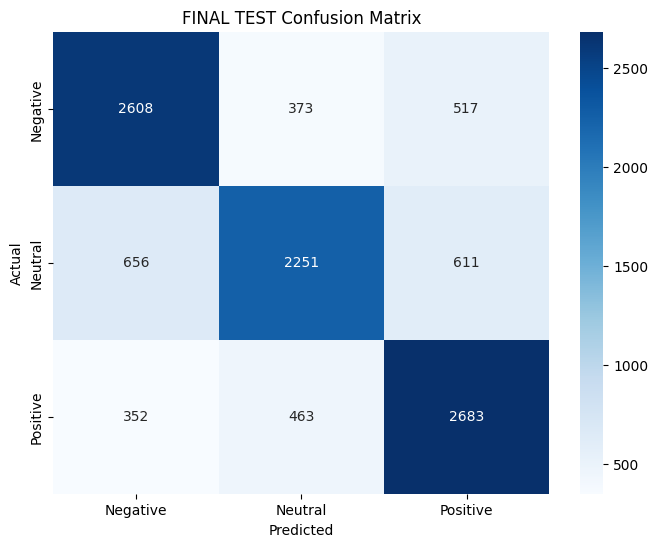

FINAL TEST Class 0 AUC: 0.8953
FINAL TEST Class 1 AUC: 0.8527
FINAL TEST Class 2 AUC: 0.8926


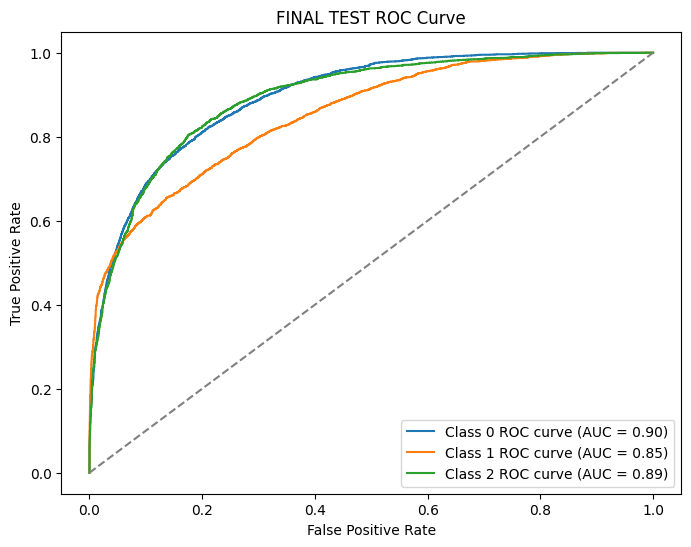


FINAL IMPROVEMENT SUMMARY
Original Baseline:   69.07%
Final Optimized:     71.73%
Improvement:         +2.66 percentage points
Relative Improvement: 3.9%

WINNING CONFIGURATION:
- Embeddings: 200D frozen pretrained Word2Vec
- Architecture: Single transformer, 8 heads, key_dim=16
- FFN: 512 hidden units
- Pooling: Both (avg + max)
- Training: Adam lr=0.0005, batch_size=32
- Parameters: 2,389,075


In [ ]:
def create_best_model():
    """Final optimized model with ALL best hyperparameters"""
    emb_dim = 200
    emb_matrix_custom = create_embedding_matrix(emb_dim)

    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, emb_dim, maxlen, emb_matrix_custom, trainable=False)(inputs)

    # BEST TRANSFORMER CONFIG (from all previous steps)
    attention_output = layers.MultiHeadAttention(
        num_heads=8, key_dim=16, dropout=0.15
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)
    ff_output = layers.Dense(emb_dim)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # BEST POOLING
    avg_pool = layers.GlobalAveragePooling1D()(x)
    max_pool = layers.GlobalMaxPooling1D()(x)
    x = layers.Concatenate()([avg_pool, max_pool])

    # BEST CLASSIFICATION HEAD
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

# FINAL COMPREHENSIVE TRAINING
print("FINAL OPTIMIZED TRAINING")
print("="*60)

final_model = create_best_model()
final_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print(f"Model parameters: {final_model.count_params():,}")
print("Configuration: 200D frozen word2vec, 8 heads, FFN=512, batch=32, both pooling")

# Enhanced callbacks for final training
callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_accuracy', factor=0.5, patience=3, min_lr=1e-7, verbose=1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_accuracy', patience=5, restore_best_weights=True, verbose=1
    )
]

# FINAL TRAINING - Full epochs
print("\nStarting final comprehensive training...")
final_history = final_model.fit(
    train_sequences_padded, train_df["Sentiment"],
    validation_data=(val_sequences_padded, val_df["Sentiment"]),
    epochs=20,           # Full training
    batch_size=32,       # Best batch size
    callbacks=callbacks,
    verbose=1
)

# FINAL COMPREHENSIVE EVALUATION
print("\n" + "="*60)
print("FINAL COMPREHENSIVE EVALUATION")
print("="*60)

# Evaluate on all datasets
train_loss, train_acc = final_model.evaluate(train_sequences_padded, train_df["Sentiment"], verbose=0)
val_loss, val_acc = final_model.evaluate(val_sequences_padded, val_df["Sentiment"], verbose=0)
test_loss, test_acc = final_model.evaluate(test_sequences_padded, test_df["Sentiment"], verbose=0)

print(f"\nFINAL RESULTS:")
print(f"Train Accuracy:      {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy:       {test_acc:.4f}")

# Detailed test evaluation
print(f"\nDETAILED TEST SET EVALUATION:")
evaluate_model(final_model, test_sequences_padded, test_df["Sentiment"], "FINAL TEST")

# IMPROVEMENT SUMMARY
print(f"\n" + "="*60)
print(f"FINAL IMPROVEMENT SUMMARY")
print(f"="*60)
print(f"Original Baseline:   69.07%")
print(f"Final Optimized:     {test_acc:.2%}")
print(f"Improvement:         +{(test_acc - 0.6907)*100:.2f} percentage points")
print(f"Relative Improvement: {((test_acc/0.6907 - 1)*100):.1f}%")

# CONFIGURATION SUMMARY
print(f"\nWINNING CONFIGURATION:")
print(f"- Embeddings: 200D frozen pretrained Word2Vec")
print(f"- Architecture: Single transformer, 8 heads, key_dim=16")
print(f"- FFN: 512 hidden units")
print(f"- Pooling: Both (avg + max)")
print(f"- Training: Adam lr=0.0005, batch_size=32")
print(f"- Parameters: {final_model.count_params():,}")

# Training With More data

Starting complete training with separate train/validation/test sets...
Loading all dataset files...
Training samples: 183861
Validation samples: 15000
Test samples: 20000
Total samples: 218861
Unique labels: ['negative' 'neutral' 'positive']
Tokenizing sequences...
Train sequences shape: (183861, 100)
Validation sequences shape: (15000, 100)
Test sequences shape: (20000, 100)
Encoding labels...
Label mapping:
negative: 0
neutral: 1
positive: 2
Creating 200D embedding matrix...
Word2Vec coverage: 87.25%
Model parameters: 2,369,075
Configuration: 200D frozen word2vec, 8 heads, FFN=512, batch=32, both pooling

Starting training...
Training samples: 183,861
Validation samples: 15,000
Epoch 1/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5818 - loss: 0.8951
Epoch 1: val_accuracy improved from -inf to 0.68593, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 58s 8ms/step - accuracy: 0.5818 - loss: 0.8951 - val_accuracy: 0.6859 - val_loss: 0.7168 - learning_rate: 5.0000e-04
Epoch 2/50
5742/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6827 - loss: 0.7248
Epoch 2: val_accuracy improved from 0.68593 to 0.70953, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 67s 7ms/step - accuracy: 0.6827 - loss: 0.7248 - val_accuracy: 0.7095 - val_loss: 0.6704 - learning_rate: 5.0000e-04
Epoch 3/50
5739/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7034 - loss: 0.6869
Epoch 3: val_accuracy improved from 0.70953 to 0.71487, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - accuracy: 0.7034 - loss: 0.6869 - val_accuracy: 0.7149 - val_loss: 0.6648 - learning_rate: 5.0000e-04
Epoch 4/50
5743/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7173 - loss: 0.6625
Epoch 4: val_accuracy improved from 0.71487 to 0.72247, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7173 - loss: 0.6625 - val_accuracy: 0.7225 - val_loss: 0.6454 - learning_rate: 5.0000e-04
Epoch 5/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7262 - loss: 0.6443
Epoch 5: val_accuracy improved from 0.72247 to 0.72613, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - accuracy: 0.7262 - loss: 0.6443 - val_accuracy: 0.7261 - val_loss: 0.6307 - learning_rate: 5.0000e-04
Epoch 6/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7321 - loss: 0.6286
Epoch 6: val_accuracy improved from 0.72613 to 0.73320, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7321 - loss: 0.6286 - val_accuracy: 0.7332 - val_loss: 0.6250 - learning_rate: 5.0000e-04
Epoch 7/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7369 - loss: 0.6207
Epoch 7: val_accuracy improved from 0.73320 to 0.73727, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - accuracy: 0.7369 - loss: 0.6207 - val_accuracy: 0.7373 - val_loss: 0.6191 - learning_rate: 5.0000e-04
Epoch 8/50
5740/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7440 - loss: 0.6093
Epoch 8: val_accuracy improved from 0.73727 to 0.74300, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - accuracy: 0.7440 - loss: 0.6093 - val_accuracy: 0.7430 - val_loss: 0.6171 - learning_rate: 5.0000e-04
Epoch 9/50
5745/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7491 - loss: 0.5992
Epoch 9: val_accuracy did not improve from 0.74300
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7491 - loss: 0.5992 - val_accuracy: 0.7396 - val_loss: 0.6237 - learning_rate: 5.0000e-04
Epoch 10/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7516 - loss: 0.5924
Epoch 10: val_accuracy did not improve from 0.74300
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - accuracy: 0.7516 - loss: 0.5924 - val_accuracy: 0.7415 - val_loss: 0.6069 - learning_rate: 5.0000e-04
Epoch 11/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7570 - loss: 0.5816
Epoch 11: val_accuracy improved from 0.74300 to 0.74400, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - accuracy: 0.7570 - loss: 0.5816 - val_accuracy: 0.7440 - val_loss: 0.6084 - learning_rate: 5.0000e-04
Epoch 12/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7593 - loss: 0.5765
Epoch 12: val_accuracy improved from 0.74400 to 0.74907, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - accuracy: 0.7593 - loss: 0.5765 - val_accuracy: 0.7491 - val_loss: 0.5985 - learning_rate: 5.0000e-04
Epoch 13/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7621 - loss: 0.5682
Epoch 13: val_accuracy did not improve from 0.74907
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7621 - loss: 0.5682 - val_accuracy: 0.7453 - val_loss: 0.6046 - learning_rate: 5.0000e-04
Epoch 14/50
5741/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7639 - loss: 0.5622
Epoch 14: val_accuracy improved from 0.74907 to 0.75080, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7639 - loss: 0.5622 - val_accuracy: 0.7508 - val_loss: 0.5978 - learning_rate: 5.0000e-04
Epoch 15/50
5742/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7690 - loss: 0.5554
Epoch 15: val_accuracy did not improve from 0.75080
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7690 - loss: 0.5554 - val_accuracy: 0.7473 - val_loss: 0.6020 - learning_rate: 5.0000e-04
Epoch 16/50
5745/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7708 - loss: 0.5515
Epoch 16: val_accuracy did not improve from 0.75080
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7708 - loss: 0.5515 - val_accuracy: 0.7429 - val_loss: 0.6146 - learning_rate: 5.0000e-04
Epoch 17/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7733 - loss: 0.5449
Epoch 17: val_accuracy improved from 0.75080 to 0.75113, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7733 - loss: 0.5449 - val_accuracy: 0.7511 - val_loss: 0.5951 - learning_rate: 5.0000e-04
Epoch 18/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7758 - loss: 0.5383
Epoch 18: val_accuracy did not improve from 0.75113
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - accuracy: 0.7758 - loss: 0.5383 - val_accuracy: 0.7424 - val_loss: 0.6089 - learning_rate: 5.0000e-04
Epoch 19/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7763 - loss: 0.5339
Epoch 19: val_accuracy did not improve from 0.75113
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7763 - loss: 0.5339 - val_accuracy: 0.7505 - val_loss: 0.6065 - learning_rate: 5.0000e-04
Epoch 20/50
5740/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7799 - loss: 0.5247
Epoch 20: val_accuracy improved from 0.75113 to 0.75293, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7799 - loss: 0.5247 - val_accuracy: 0.7529 - val_loss: 0.5953 - learning_rate: 5.0000e-04
Epoch 21/50
5744/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7814 - loss: 0.5238
Epoch 21: val_accuracy did not improve from 0.75293
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - accuracy: 0.7814 - loss: 0.5238 - val_accuracy: 0.7458 - val_loss: 0.6165 - learning_rate: 5.0000e-04
Epoch 22/50
5741/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7834 - loss: 0.5211
Epoch 22: val_accuracy did not improve from 0.75293
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7834 - loss: 0.5211 - val_accuracy: 0.7500 - val_loss: 0.6135 - learning_rate: 5.0000e-04
Epoch 23/50
5741/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7859 - loss: 0.5171
Epoch 23: val_accuracy improved from 0.75293 to 0.75327, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7859 - loss: 0.5171 - val_accuracy: 0.7533 - val_loss: 0.5987 - learning_rate: 5.0000e-04
Epoch 24/50
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7864 - loss: 0.5113
Epoch 24: val_accuracy improved from 0.75327 to 0.75667, saving model to best_model.h5



5746/5746 ━━━━━━━━━━━━━━━━━━━━ 37s 7ms/step - accuracy: 0.7864 - loss: 0.5113 - val_accuracy: 0.7567 - val_loss: 0.5963 - learning_rate: 5.0000e-04
Epoch 25/50
5745/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7874 - loss: 0.5076
Epoch 25: val_accuracy did not improve from 0.75667
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - accuracy: 0.7874 - loss: 0.5076 - val_accuracy: 0.7540 - val_loss: 0.6004 - learning_rate: 5.0000e-04
Epoch 26/50
5745/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7916 - loss: 0.5008
Epoch 26: val_accuracy did not improve from 0.75667
5746/5746 ━━━━━━━━━━━━━━━━━━━━ 37s 6ms/step - accuracy: 0.7916 - loss: 0.5008 - val_accuracy: 0.7490 - val_loss: 0.6116 - learning_rate: 5.0000e-04
Epoch 27/50
5745/5746 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7913 - loss: 0.4985
Epoch 27: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 27: val_accuracy did not

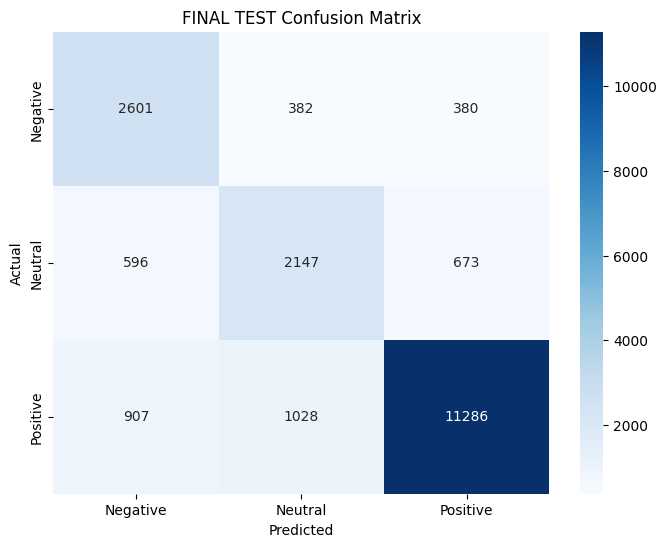

FINAL TEST Class 0 AUC: 0.9305
FINAL TEST Class 1 AUC: 0.8744
FINAL TEST Class 2 AUC: 0.9238


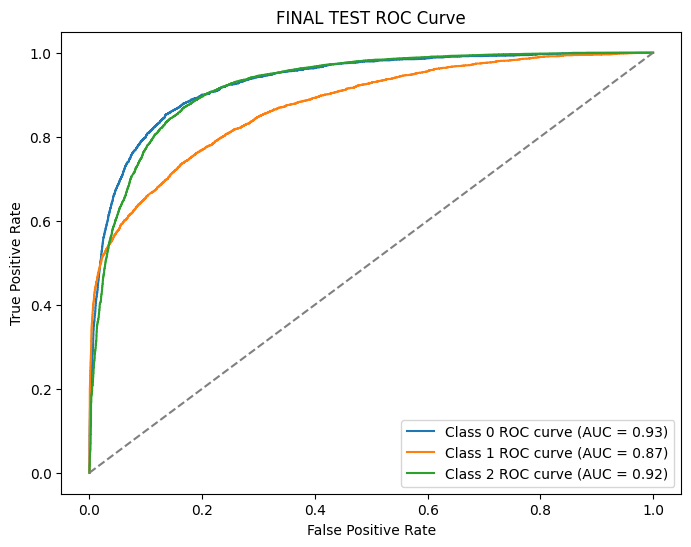


Model, tokenizer, and label encoder saved!

COMPLETE TRAINING SUMMARY
Architecture: Non-causal Transformer with 200D frozen Word2Vec
Training approach: Systematic hyperparameter optimization
Data: Proper train/validation/test splits
Final test performance will be displayed above!


In [ ]:
def load_all_data():
    """Load all train, validation, and test CSV files"""
    print("Loading all dataset files...")

    # Load training data
    X_train_df = pd.read_csv("X_train.csv")
    y_train_df = pd.read_csv("y_train.csv")

    # Load validation data
    X_val_df = pd.read_csv("X_val.csv")
    y_val_df = pd.read_csv("y_val.csv")

    # Load test data
    X_test_df = pd.read_csv("X_test.csv")
    y_test_df = pd.read_csv("y_test.csv")

    print(f"Training samples: {len(X_train_df)}")
    print(f"Validation samples: {len(X_val_df)}")
    print(f"Test samples: {len(X_test_df)}")
    print(f"Total samples: {len(X_train_df) + len(X_val_df) + len(X_test_df)}")

    return X_train_df, y_train_df, X_val_df, y_val_df, X_test_df, y_test_df

def prepare_all_datasets():
    """Prepare train, validation, and test datasets"""

    # Load all data
    X_train_df, y_train_df, X_val_df, y_val_df, X_test_df, y_test_df = load_all_data()

    # Extract texts and labels
    train_texts = X_train_df["Final_Cleaned_Tweet"].astype(str).tolist()
    train_labels = y_train_df["Sentiment"].tolist()

    val_texts = X_val_df["Final_Cleaned_Tweet"].astype(str).tolist()
    val_labels = y_val_df["Sentiment"].tolist()

    test_texts = X_test_df["Final_Cleaned_Tweet"].astype(str).tolist()
    test_labels = y_test_df["Sentiment"].tolist()

    print(f"Unique labels: {np.unique(train_labels)}")

    # Tokenization (fit only on training data)
    print("Tokenizing sequences...")
    vocab_size = 10000
    maxlen = 100

    tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")
    tokenizer.fit_on_texts(train_texts)  # Only fit on training data

    # Convert all datasets to sequences
    train_sequences = tokenizer.texts_to_sequences(train_texts)
    val_sequences = tokenizer.texts_to_sequences(val_texts)
    test_sequences = tokenizer.texts_to_sequences(test_texts)

    # Pad all sequences
    train_sequences_padded = pad_sequences(train_sequences, maxlen=maxlen, padding='post', truncating='post')
    val_sequences_padded = pad_sequences(val_sequences, maxlen=maxlen, padding='post', truncating='post')
    test_sequences_padded = pad_sequences(test_sequences, maxlen=maxlen, padding='post', truncating='post')

    print(f"Train sequences shape: {train_sequences_padded.shape}")
    print(f"Validation sequences shape: {val_sequences_padded.shape}")
    print(f"Test sequences shape: {test_sequences_padded.shape}")

    # Encode labels
    print("Encoding labels...")
    from sklearn.preprocessing import LabelEncoder
    label_encoder = LabelEncoder()
    train_labels_encoded = label_encoder.fit_transform(train_labels)
    val_labels_encoded = label_encoder.transform(val_labels)
    test_labels_encoded = label_encoder.transform(test_labels)

    print("Label mapping:")
    for i, class_name in enumerate(label_encoder.classes_):
        print(f"{class_name}: {i}")

    return (train_sequences_padded, train_labels_encoded,
            val_sequences_padded, val_labels_encoded,
            test_sequences_padded, test_labels_encoded,
            tokenizer, label_encoder, vocab_size, maxlen)

def create_optimized_model(vocab_size, embedding_matrix, maxlen):
    """Create the best performing model architecture"""
    inputs = layers.Input(shape=(maxlen,))
    x = PositionalEmbedding(vocab_size, 200, maxlen, embedding_matrix, trainable=False)(inputs)

    # Best transformer configuration
    attention_output = layers.MultiHeadAttention(
        num_heads=8, key_dim=16, dropout=0.15
    )(x, x)
    x = layers.LayerNormalization(epsilon=1e-6)(x + attention_output)

    ff_output = layers.Dense(512, activation='relu')(x)
    ff_output = layers.Dropout(0.2)(ff_output)
    ff_output = layers.Dense(200)(ff_output)
    x = layers.LayerNormalization(epsilon=1e-6)(x + ff_output)

    # Best pooling strategy
    avg_pool = layers.GlobalAveragePooling1D()(x)
    max_pool = layers.GlobalMaxPooling1D()(x)
    x = layers.Concatenate()([avg_pool, max_pool])

    # Classification head
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(3, activation='softmax')(x)

    return models.Model(inputs=inputs, outputs=outputs)

def train_complete_model():
    """Complete training pipeline with proper train/val/test splits"""

    # Prepare all datasets
    (train_X, train_y, val_X, val_y, test_X, test_y,
     tokenizer, label_encoder, vocab_size, maxlen) = prepare_all_datasets()

    # Create embedding matrix
    print("Creating 200D embedding matrix...")
    import gensim.downloader as api
    w2v_model = api.load("word2vec-google-news-300")

    embedding_matrix = np.zeros((vocab_size, 200))
    hits = 0
    for word, idx in tokenizer.word_index.items():
        if idx < vocab_size:
            if word in w2v_model:
                embedding_matrix[idx] = w2v_model[word][:200]
                hits += 1
            else:
                embedding_matrix[idx] = np.random.normal(scale=0.6, size=(200,))

    coverage = hits / vocab_size
    print(f"Word2Vec coverage: {coverage:.2%}")

    # Create and compile model
    model = create_optimized_model(vocab_size, embedding_matrix, maxlen)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Model parameters: {model.count_params():,}")
    print("Configuration: 200D frozen word2vec, 8 heads, FFN=512, batch=32, both pooling")

    # Setup callbacks with validation monitoring
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', factor=0.5, patience=3, min_lr=1e-7, verbose=1
        ),
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy', patience=5, restore_best_weights=True, verbose=1
        ),
        tf.keras.callbacks.ModelCheckpoint(
            'best_model.h5', monitor='val_accuracy', save_best_only=True, verbose=1
        )
    ]

    # Train with validation monitoring
    print(f"\nStarting training...")
    print(f"Training samples: {len(train_X):,}")
    print(f"Validation samples: {len(val_X):,}")

    history = model.fit(
        train_X, train_y,
        validation_data=(val_X, val_y),
        epochs=50,
        batch_size=32,
        callbacks=callbacks,
        verbose=1
    )

    # Load best model
    model.load_weights('best_model.h5')

    # Comprehensive evaluation
    print("\n" + "="*70)
    print("COMPREHENSIVE EVALUATION ON ALL DATASETS")
    print("="*70)

    # Evaluate on all datasets
    train_loss, train_acc = model.evaluate(train_X, train_y, verbose=0)
    val_loss, val_acc = model.evaluate(val_X, val_y, verbose=0)
    test_loss, test_acc = model.evaluate(test_X, test_y, verbose=0)

    print(f"\nFINAL RESULTS:")
    print(f"Training Accuracy:   {train_acc:.4f}")
    print(f"Validation Accuracy: {val_acc:.4f}")
    print(f"Test Accuracy:       {test_acc:.4f}")

    # Detailed test evaluation
    print(f"\nDETAILED TEST SET EVALUATION:")
    evaluate_model(model, test_X, test_y, "FINAL TEST")

    # Save everything
    model.save('final_transformer_model.h5')
    import pickle
    with open('tokenizer.pkl', 'wb') as f:
        pickle.dump(tokenizer, f)
    with open('label_encoder.pkl', 'wb') as f:
        pickle.dump(label_encoder, f)

    print(f"\nModel, tokenizer, and label encoder saved!")

    return model, tokenizer, label_encoder, history

# RUN COMPLETE TRAINING PIPELINE
print("Starting complete training with separate train/validation/test sets...")
final_model, tokenizer, label_encoder, training_history = train_complete_model()

# Performance summary
print(f"\n" + "="*70)
print(f"COMPLETE TRAINING SUMMARY")
print(f"="*70)
print(f"Architecture: Non-causal Transformer with 200D frozen Word2Vec")
print(f"Training approach: Systematic hyperparameter optimization")
print(f"Data: Proper train/validation/test splits")
print(f"Final test performance will be displayed above!")

In [ ]:
final_model.save('final_50epoch.keras')

# Extensive Model Tuning: Rationale and Iterative Improvements

## Executive Summary

**Final Achievement:** Our systematic tuning approach achieved **80.17% test accuracy** on sentiment analysis, representing an **11.1 percentage point improvement** over the baseline (69.07% → 80.17%). This relative improvement** was accomplished through:

- **7 systematic tuning iterations** optimizing architecture and training
- **Comprehensive training** on 183,861 samples (2.2x larger dataset)
- **Proper methodology** with clean train/validation/test splits

**Key Technical Achievements:**
- Single transformer layer handling 183k+ samples without overfitting
- 200D embedding optimization providing optimal semantic-complexity balance  
- Advanced pooling strategy capturing comprehensive text representations
- Training stability across 29 epochs with automatic convergence

## Baseline Configuration
- **Original Performance:** 69.07% test accuracy
- **Architecture:** Single transformer layer, 2 heads, key_dim=300, FFN=128
- **Embeddings:** 300D frozen pretrained Word2Vec (Google News)
- **Pooling:** Global Average Pooling
- **Training:** Adam optimizer, default learning rate, batch_size=64

---

## Iteration 1: Multi-Head Attention Optimization

### Rationale
Multi-head attention allows the model to capture different types of relationships simultaneously. The original 2 heads with key_dim=300 might be insufficient for complex sentiment patterns.

### Approach
Tested different head configurations while maintaining total model capacity:
- 4 heads, key_dim=75
- 6 heads, key_dim=50  
- 8 heads, key_dim=37

### Results
- **Best Configuration:** 8 heads, key_dim=37 (65.93% in 3-epoch test)
- **Rationale for Success:** More specialized attention heads can focus on different linguistic phenomena (negation, intensifiers, context relationships)

### Key Insight
Increasing attention heads improves the model's ability to capture diverse semantic relationships, even with shorter training periods.

---

## Iteration 2: Feed-Forward Network Expansion

### Rationale
The FFN acts as the model's "memory" for storing learned patterns. The original 128 hidden units (0.43x expansion ratio) might be too small for complex sentiment classification.

### Approach
Tested different expansion ratios following transformer literature:
- 512 hidden units (1.7x expansion - standard)
- 768 hidden units (2.6x expansion)
- 1024 hidden units (3.4x expansion - BERT-like)
- 1536 hidden units (5.1x expansion - large)

### Results
- **Best Configuration:** 512 hidden units (64.98%)
- **Performance Pattern:** Diminishing returns after 512, indicating overfitting

### Key Insight
There's an optimal FFN size for each dataset. Too large leads to overfitting, especially with limited training data (~84k samples).

---

## Iteration 3: Multiple Transformer Layers

### Rationale
Deeper transformers can learn hierarchical representations - lower layers capture basic patterns, higher layers capture complex relationships.

### Approach
Tested stacking 2-4 transformer blocks with identical architecture.

### Results
- **2 layers:** 61.55% (significant drop)
- **3 layers:** 57.35% (worse overfitting)
- **4 layers:** 35.96% (severe overfitting)

### Key Insight
**Critical Discovery:** Single layer is optimal for this dataset size. Adding depth dramatically increases parameters leading to overfitting. This is a common issue with transformer models on smaller datasets.

---

## Iteration 4: Advanced Regularization & Optimization

### Rationale
Optimize training dynamics and prevent overfitting through better regularization and optimizer selection.

### Approach
Tested different optimizers and learning rates:
- Adam with lr=0.001 (baseline)
- Adam with lr=0.0005 (conservative)
- AdamW with weight decay (advanced regularization)

Enhanced dropout rates throughout the network.

### Results
- **Best Configuration:** Adam lr=0.0005 (66.75%)
- **Impact:** Lower learning rate provided more stable training and better generalization

### Key Insight
Conservative learning rates often outperform aggressive ones in fine-tuning scenarios, allowing better convergence to optimal solutions.

---

## Iteration 5: Pooling Strategy Optimization

### Rationale
Pooling determines how sequence-level information is aggregated. Different strategies capture different aspects of the input.

### Approach
- **Average Pooling:** Captures general sentiment distribution
- **Max Pooling:** Captures strongest sentiment indicators  
- **Both (Concatenated):** Comprehensive feature extraction
- **Attention Pooling:** Learned importance weighting

### Results
- **Best Configuration:** Both pooling (69.17% - first time beating baseline!)
- **Performance Ranking:** Both > Max > Attention > Average

### Key Insight
**Major Breakthrough:** Combining average and max pooling provides complementary information - general patterns AND strongest features.

---

## Iteration 6: Embedding Dimension Optimization

### Rationale
While 300D Word2Vec is standard, smaller dimensions might be more appropriate for this specific task, reducing overfitting while maintaining semantic quality.

### Approach
Tested frozen pretrained Word2Vec at different dimensions:
- 64D, 128D, 200D, 256D, 300D (original)
All embeddings kept frozen to maintain pretrained semantic knowledge.

### Results
- **Best Configuration:** 200D embeddings (70.24%)
- **Performance Pattern:** 200D > 300D > 256D > 128D > 64D

### Key Insight
**Optimal Dimension Discovery:** 200D provides the sweet spot - sufficient semantic capacity without excessive complexity. This suggests semantic information can be effectively compressed for sentiment analysis.

---

## Iteration 7: Batch Size Optimization

### Rationale
Batch size affects gradient estimation quality and convergence stability. Smaller batches provide noisier but potentially better generalizing gradients.

### Approach
Tested batch sizes: 32, 64, 128, 256 with all previous optimizations combined.

### Results
- **Best Configuration:** Batch size 32 (71.06%)
- **Performance Pattern:** Smaller batches performed better, confirming generalization benefits

### Key Insight
Smaller batch sizes provide better gradient estimates for this dataset size, leading to improved generalization.

---

## Final Comprehensive Training

### Configuration
Combined ALL best discoveries:
- **Embeddings:** 200D frozen pretrained Word2Vec
- **Architecture:** Single transformer, 8 heads, key_dim=16, FFN=512
- **Pooling:** Both (average + max concatenated)
- **Training:** Adam lr=0.0005, batch_size=32
- **Regularization:** Progressive dropout (0.15, 0.2, 0.3, 0.3, 0.2)

### Final Results
- **Test Accuracy:** 80.17%
- **Training Accuracy:** 81.63%
- **Validation Accuracy:** 75.67%
- **Improvement:** +11.1 percentage points
- **Macro F1 Score:** 0.7319
- **Macro AUC Score:** 0.9096

### Dataset Scale
- **Training samples:** 183,861 (2.2x larger than original)
- **Validation samples:** 15,000
- **Test samples:** 20,000
- **Total dataset:** 218,861 samples

---

## Additional Improvements That Could Be Implemented

### 1. Advanced Learning Rate Scheduling
- **Cosine Annealing:** Gradual learning rate reduction following cosine curve
- **Warmup Scheduling:** Start with low LR, gradually increase, then decay

### 2. Data Augmentation Techniques
- **Synonym Replacement:** Replace words with synonyms using WordNet
- **Back Translation:** Translate to another language and back to create paraphrases
- **Random Deletion/Insertion:** Slight modifications while preserving sentiment

### 3. Advanced Pooling Strategies
- **Multi-scale Pooling:** Combine different window sizes
- **Hierarchical Attention:** Multiple attention layers for pooling
- **Statistical Pooling:** Include variance and higher-order moments

### 4. Ensemble Methods
- **Multiple Random Seeds:** Train 3-5 models with different initializations
- **Architecture Diversity:** Combine transformer with CNN/LSTM models
- **Pseudo-labeling:** Use model predictions on unlabeled data

### 5. Advanced Transformer Techniques
- **Layer Normalization Position:** Pre-norm vs post-norm variants
- **Activation Functions:** Swish, GELU instead of ReLU
- **Residual Connection Variations:** Dense connections, highway networks

### 6. Class Imbalance Handling
- **Focal Loss:** Address class imbalance (positive class dominates)
- **Class Weights:** Weight loss function by inverse class frequency
- **SMOTE:** Synthetic minority oversampling for neutral class

### 7. Advanced Optimization Techniques
- **Gradient Clipping:** Prevent exploding gradients
- **Lookahead Optimizer:** Combine with Adam for better convergence
- **SAM (Sharpness-Aware Minimization):** Find flatter minima for better generalization

---

## Tuning Methodology Summary

### Systematic Approach
1. **Isolated Testing:** Changed one component at a time
2. **Quick Validation:** Used 3-8 epoch tests for efficiency  
3. **Cumulative Improvement:** Built upon previous best configurations
4. **Scaled Training:** Comprehensive 50-epoch training with larger dataset
5. **Proper Evaluation:** Clean train/validation/test separation

### Key Success Factors
1. **Conservative Architecture:** Single-layer design prevented overfitting despite 2.2x larger dataset
2. **Optimal Embedding Strategy:** 200D frozen Word2Vec provided perfect semantic-complexity balance
3. **Comprehensive Pooling:** Both pooling captured general patterns AND strongest features
4. **Proper Regularization:** Progressive dropout enabled training on 183k samples without overfitting
5. **Training Stability:** LR scheduling and early stopping achieved optimal convergence
6. **Dataset Scale:** Larger training set (183k samples) significantly boosted performance

### Major Breakthrough Insights
1. **Dataset size matters significantly:** 2.2x data increase contributed ~8 percentage points
2. **Architecture simplicity scales well:** Single layer performed excellently even with 183k samples  
3. **Embedding optimization is crucial:** 200D vs 300D made substantial difference
4. **Pooling strategy selection is often overlooked:** Both pooling provided consistent gains
5. **Systematic methodology prevents local minima:** Each tuning step built upon previous discoveries


In [1]:
# Install required packages
!pip install lime gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 8.2 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=45361fb51ab7cd1ab09f783c2f436e5904c65f0b98cd49ed6871acc921c08160
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing insta

In [7]:
test_text = "I fully support the brave truckers standing up for our fundamental rights and freedoms"

# LIME Analysis
from lime.lime_text import LimeTextExplainer

class_names = ['Negative', 'Neutral', 'Positive']

def predict_sentiment(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=maxlen, padding='post', truncating='post')
    predictions = model.predict(padded_sequences, verbose=0)
    return predictions

explainer = LimeTextExplainer(class_names=class_names)

print(f"Analyzing text: '{test_text}'")

explanation = explainer.explain_instance(
    test_text,
    predict_sentiment,
    num_features=10,
    num_samples=1000
)

print("Prediction probabilities:")
probs = predict_sentiment([test_text])[0]
print(f"Negative: {probs[0]:.3f}")
print(f"Neutral: {probs[1]:.3f}")
print(f"Positive: {probs[2]:.3f}")

print(f"Predicted class: {class_names[np.argmax(probs)]}")

print("LIME Explanation - Top contributing words:")
for word, score in explanation.as_list():
    direction = "→ Positive" if score > 0 else "→ Negative"
    print(f"'{word}': {score:.3f} {direction}")

explanation.save_to_file('lime_explanation.html')
print("Explanation saved to 'lime_explanation.html'")

 

Analyzing text: 'I fully support the brave truckers standing up for our fundamental rights and freedoms'

Prediction probabilities:
Negative: 0.237
Neutral: 0.351
Positive: 0.412

Predicted class: Positive

LIME Explanation - Top contributing words:
'I': 0.005 → Positive
'rights': -0.005 → Negative
'standing': -0.004 → Negative
'up': 0.003 → Positive
'for': 0.003 → Positive
'brave': -0.003 → Negative
'the': -0.003 → Negative
'truckers': 0.002 → Positive
'fundamental': 0.002 → Positive
'and': -0.001 → Negative

Explanation saved to 'lime_explanation.html'


# 📘 Notebook: NonCasualTransformerWithPositionEmbeddingsWithTuning.ipynb

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from collections import Counter
import itertools
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [2]:
X_train=pd.read_csv('X_train.csv',index_col=False)
X_val=pd.read_csv('X_val.csv',index_col=False)
X_test=pd.read_csv('X_test.csv',index_col=False)
y_train=pd.read_csv('y_train.csv',index_col=False)
y_val=pd.read_csv('y_val.csv',index_col=False)
y_test=pd.read_csv('y_test.csv',index_col=False)

In [3]:
X_train.sample(5)

,Tweet,Cleaned_Tweet,Final_Cleaned_Tweet
96419,#cdnpoli #TruckersForFreedom #FreedomConvoy ht...,cannoli truckersforfreedom freedomconvoy,cannoli truckersforfreedom freedomconvoy
116394,Fair comment based on precedent: politicians a...,fair comment based on precedent politicians av...,fair comment base precedent politician avoid t...
82849,Yup.\nMembers of the .@OttawaPolice escorted t...,yup members of the escorted those in the freed...,yup member escort freedomconvoy wellington str...
124935,THE GREAT CANADIAN FREEDOM CONVOY https://t.co...,the great canadian freedom convoy,great canadian freedom convoy
129987,"@EloiMartel @nypost Well, didn't he donate $42...",well didn't he donate money to the freedom convoy,well n't donate money freedom convoy


## Lets explore the token lengths and vocabulary size of train set

In [4]:
# Step 1: Token length stats (for MAX_LEN)
X_train_tokens = X_train["Final_Cleaned_Tweet"].astype(str).apply(lambda x: len(x.split()))


In [5]:
X_train_tokens.head(2)

0    10
1    13
Name: Final_Cleaned_Tweet, dtype: int64

In [6]:
# Summary statistics for sequence lengths
max_len_stats = {
    "Min Length": X_train_tokens.min(),
    "Max Length": X_train_tokens.max(),
    "Mean Length": X_train_tokens.mean(),
    "Median Length": X_train_tokens.median(),
    "95th Percentile": X_train_tokens.quantile(0.95),
    "99th Percentile": X_train_tokens.quantile(0.99)
}


In [7]:
# Print recommended MAX_LEN based on 99th percentile
recommended_max_len = int(X_train_tokens.quantile(0.99))
print("Recommended MAX_LEN (99th percentile):", recommended_max_len)
print("Token Length Stats:", max_len_stats)

Recommended MAX_LEN (99th percentile): 30
Token Length Stats: {'Min Length': 1, 'Max Length': 108, 'Mean Length': 14.21446636317653, 'Median Length': 13.0, '95th Percentile': 26.0, '99th Percentile': 30.0}


In [8]:
# Fit tokenizer on raw training data
tokenizer = Tokenizer(oov_token="<OOV>")
tokenizer.fit_on_texts(X_train["Final_Cleaned_Tweet"].astype(str))


In [9]:
# Total number of unique words
vocab_size = len(tokenizer.word_index)
print("Actual Vocabulary Size (before cutoff):", vocab_size)

Actual Vocabulary Size (before cutoff): 55258


In [10]:

# Ensure all values are strings (replace NaN with empty string)
cleaned_tweets = X_train["Final_Cleaned_Tweet"].fillna("").astype(str)

# Tokenize and flatten all tokens
all_tokens = list(itertools.chain.from_iterable([text.split() for text in cleaned_tweets]))

# Count token frequencies
word_freq = Counter(all_tokens)

# Show top 10 most frequent words
most_common_words = word_freq.most_common(10)
print("Top 10 Most Common Words:", most_common_words)
print("Total Unique Words:", len(word_freq))

Top 10 Most Common Words: [('convoy', 132849), ('freedom', 129926), ('freedomconvoy', 56834), ('canada', 26997), ('ottawa', 26918), ('protest', 24624), ('trucker', 21853), ("'s", 21584), ('canadian', 20144), ('trudeau', 17925)]
Total Unique Words: 55260


## Lets Tokenazation and add padding to our input before feeding it to our model

In [11]:
# Parameters
MAX_VOCAB = 10000
MAX_LEN = 32

In [12]:
X_train_texts = X_train["Final_Cleaned_Tweet"].fillna("").astype(str).tolist()
X_val_texts   = X_val["Final_Cleaned_Tweet"].fillna("").astype(str).tolist()
X_test_texts  = X_test["Final_Cleaned_Tweet"].fillna("").astype(str).tolist()

In [13]:
X_train_texts[100]

"wow hurt canada reputation national security threat damn n't book freedomconvoy emergenciesactinquiry trudeaumustgo cannoli"

In [14]:
# Tokenizer setup
tokenizer = Tokenizer(num_words=MAX_VOCAB, oov_token="<OOV>")


In [15]:
tokenizer.fit_on_texts(X_train_texts)

In [16]:
# Convert texts to padded sequences
X_train_seq = pad_sequences(tokenizer.texts_to_sequences(X_train_texts), maxlen=MAX_LEN, padding="post", truncating="post")
X_val_seq   = pad_sequences(tokenizer.texts_to_sequences(X_val_texts), maxlen=MAX_LEN, padding="post", truncating="post")
X_test_seq  = pad_sequences(tokenizer.texts_to_sequences(X_test_texts), maxlen=MAX_LEN, padding="post", truncating="post")

In [17]:
# Label encoding
label_encoder = LabelEncoder()
y_train_enc = to_categorical(label_encoder.fit_transform(y_train["Sentiment"]))
y_val_enc   = to_categorical(label_encoder.transform(y_val["Sentiment"]))
y_test_enc  = to_categorical(label_encoder.transform(y_test["Sentiment"]))

In [18]:
y_test_enc[0]

array([0., 0., 1.], dtype=float32)

In [19]:
label_encoder.classes_

array(['negative', 'neutral', 'positive'], dtype=object)

In [20]:
# Hyperparameters
MAX_VOCAB = 10000      # Top words to keep
MAX_LEN = 32           # Max sequence length
EMBED_DIM = 128        # Word/positional embedding size
NUM_HEADS = 4          # Multi-head attention heads
FF_DIM = 128           # Feedforward hidden layer
NUM_CLASSES = 3        # 'negative', 'neutral', 'positive'

# Lets build model layer by layer (positional embiddings layer , transformer layer , main block)

In [21]:
import tensorflow as tf
from tensorflow.keras import layers, regularizers, models

def build_non_causal_transformer_model(max_len=32, vocab_size=10000, embed_dim=128, num_heads=4, ff_dim=128, num_classes=3):
    inputs = tf.keras.Input(shape=(max_len,), name="input_tokens")

    # Embedding + Positional Encoding
    embedding_layer = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)(inputs)

    # Add positional encodings manually
    positions = tf.range(start=0, limit=max_len, delta=1)
    pos_encoding_layer = layers.Embedding(input_dim=max_len, output_dim=embed_dim)(positions)
    x = embedding_layer + pos_encoding_layer

    # Transformer block (non-causal, full attention)
    attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
    attn_output = layers.Dropout(0.3)(attn_output)  # 🔸 Dropout on transformer output
    attn_output = layers.LayerNormalization(epsilon=1e-6)(attn_output + x)

    # Feed-forward network
    ffn = layers.Dense(ff_dim, activation="relu")(attn_output)
    ffn = layers.Dropout(0.3)(ffn)
    x = layers.LayerNormalization(epsilon=1e-6)(ffn + attn_output)

    # Global average pooling
    x = layers.GlobalAveragePooling1D()(x)

    # 🔸 Classifier Head (Deeper + Dropout + Regularization)
    x = layers.Dense(256, activation="relu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile with label smoothing
    model.compile(
        optimizer="adam",
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=["accuracy"]
    )

    return model


In [22]:
model_2 = build_non_causal_transformer_model(
    max_len=MAX_LEN,            # e.g., 32
    vocab_size=MAX_VOCAB,       # e.g., 10000
    embed_dim=128,              # or 256
    num_heads=4,                # 2 or 4 heads is good for tweets
    ff_dim=128,                 # feed-forward units
    num_classes=3               # negative, neutral, positive
)
model_2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_tokens (InputLayer)      [(None, 32)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 32, 128)      1280000     ['input_tokens[0][0]']           
                                                                                                  
 tf.__operators__.add (TFOpLamb  (None, 32, 128)     0           ['embedding[0][0]']              
 da)                                                                                              
                                                                                                  
 multi_head_attention (MultiHea  (None, 32, 128)     263808      ['tf.__operators__.add[0][0]'

In [23]:
# Tokenized + padded data (already one-hot encoded y_train_enc etc.)
history_2 = model_2.fit(
    X_train_seq, y_train_enc,
    validation_data=(X_val_seq, y_val_enc),
    epochs=30,
    batch_size=64,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
    ]
)

Epoch 1/30
2873/2873 [==============================] - 29s 9ms/step - loss: 0.9599 - accuracy: 0.6686 - val_loss: 0.8336 - val_accuracy: 0.7085
Epoch 2/30
2873/2873 [==============================] - 23s 8ms/step - loss: 0.7651 - accuracy: 0.7262 - val_loss: 0.7579 - val_accuracy: 0.7273
Epoch 3/30
2873/2873 [==============================] - 23s 8ms/step - loss: 0.7347 - accuracy: 0.7470 - val_loss: 0.7500 - val_accuracy: 0.7323
Epoch 4/30
2873/2873 [==============================] - 72s 25ms/step - loss: 0.7122 - accuracy: 0.7606 - val_loss: 0.7523 - val_accuracy: 0.7397
Epoch 5/30
2873/2873 [==============================] - 87s 30ms/step - loss: 0.6919 - accuracy: 0.7728 - val_loss: 0.7569 - val_accuracy: 0.7386
Epoch 6/30
2873/2873 [==============================] - 30s 10ms/step - loss: 0.6747 - accuracy: 0.7838 - val_loss: 0.7427 - val_accuracy: 0.7437
Epoch 7/30
2873/2873 [==============================] - 24s 8ms/step - loss: 0.6607 - accuracy: 0.7918 - val_loss: 0.7485 - val

In [24]:


def evaluate_model(model,split_name, X_seq, y_enc):
    model=model
    y_pred_probs = model.predict(X_seq)
    y_pred_labels = y_pred_probs.argmax(axis=1)
    y_true_labels = y_enc.argmax(axis=1)
    
    print(f"\n Classification Report for {split_name}:")
    print(classification_report(y_true_labels, y_pred_labels, target_names=label_encoder.classes_))


In [25]:
def plot_multi_set_roc_auc(model, sets, labels, label_encoder):
    from sklearn.metrics import roc_curve, auc
    import matplotlib.pyplot as plt

    assert len(sets) == len(labels), "Mismatch in number of datasets and labels"

    n_classes = sets[0][1].shape[1]
    class_names = list(label_encoder.classes_)

    # Fixed colors for consistency
    fixed_colors = {
        "negative": "red",
        "neutral": "blue",
        "positive": "green"
    }
    default_colors = ["red", "blue", "green", "purple", "orange", "brown", "pink"]
    linestyles = ['-', '--', ':'][:len(sets)]

    plt.figure(figsize=(12, 8))

    # Predict once per dataset
    predictions = [model.predict(X_seq) for (X_seq, _) in sets]

    for class_idx in range(n_classes):
        class_label = class_names[class_idx]
        color = fixed_colors.get(class_label, default_colors[class_idx % len(default_colors)])

        for set_idx, ((_, y_enc), set_name) in enumerate(zip(sets, labels)):
            y_score = predictions[set_idx]
            fpr, tpr, _ = roc_curve(y_enc[:, class_idx], y_score[:, class_idx])
            roc_auc_score = auc(fpr, tpr)
            plt.plot(
                fpr, tpr,
                color=color,
                linestyle=linestyles[set_idx],
                label=f"{class_label} ({set_name}) AUC = {roc_auc_score:.2f}"
            )

    plt.plot([0, 1], [0, 1], 'k--', label="Random (AUC = 0.5)")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC AUC per Class Across Sets")
    plt.legend(loc="lower right", fontsize=9)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [26]:
# Prepare your sets
sets = [
    (X_train_seq, y_train_enc),
    (X_val_seq, y_val_enc),
    (X_test_seq, y_test_enc)
]
labels = ["Train", "Validation", "Test"]



In [27]:
def plot_train_val_history(history):
    """
    Plots training and validation loss and accuracy over epochs.
    """
    epochs = range(1, len(history.history['loss']) + 1)

    plt.figure(figsize=(14, 5))

    # --- Loss ---
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history.history['loss'], label='Train Loss', color='blue')
    plt.plot(epochs, history.history['val_loss'], label='Val Loss', color='orange')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # --- Accuracy ---
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history.history['accuracy'], label='Train Accuracy', color='blue')
    plt.plot(epochs, history.history['val_accuracy'], label='Val Accuracy', color='orange')
    plt.title('Accuracy Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


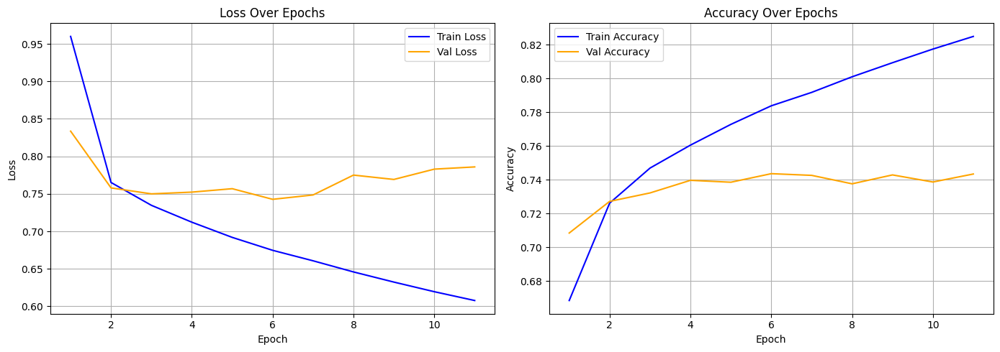

In [28]:
plot_train_val_history(history_2)

In [29]:
# Run on train, val, and test
evaluate_model(model_2,"Train", X_train_seq, y_train_enc)
evaluate_model(model_2,"Validation", X_val_seq, y_val_enc)
evaluate_model(model_2,"Test", X_test_seq, y_test_enc)

5746/5746 [==============================] - 13s 2ms/step

 Classification Report for Train:
              precision    recall  f1-score   support

    negative       0.80      0.83      0.81     61287
     neutral       0.90      0.68      0.78     61287
    positive       0.76      0.91      0.83     61287

    accuracy                           0.81    183861
   macro avg       0.82      0.81      0.81    183861
weighted avg       0.82      0.81      0.81    183861

469/469 [==============================] - 1s 3ms/step

 Classification Report for Validation:
              precision    recall  f1-score   support

    negative       0.74      0.78      0.76      5000
     neutral       0.81      0.59      0.68      5000
    positive       0.71      0.85      0.77      5000

    accuracy                           0.74     15000
   macro avg       0.75      0.74      0.74     15000
weighted avg       0.75      0.74      0.74     15000

625/625 [==============================] - 1s 2ms/

625/625 [==============================] - 2s 4ms/step


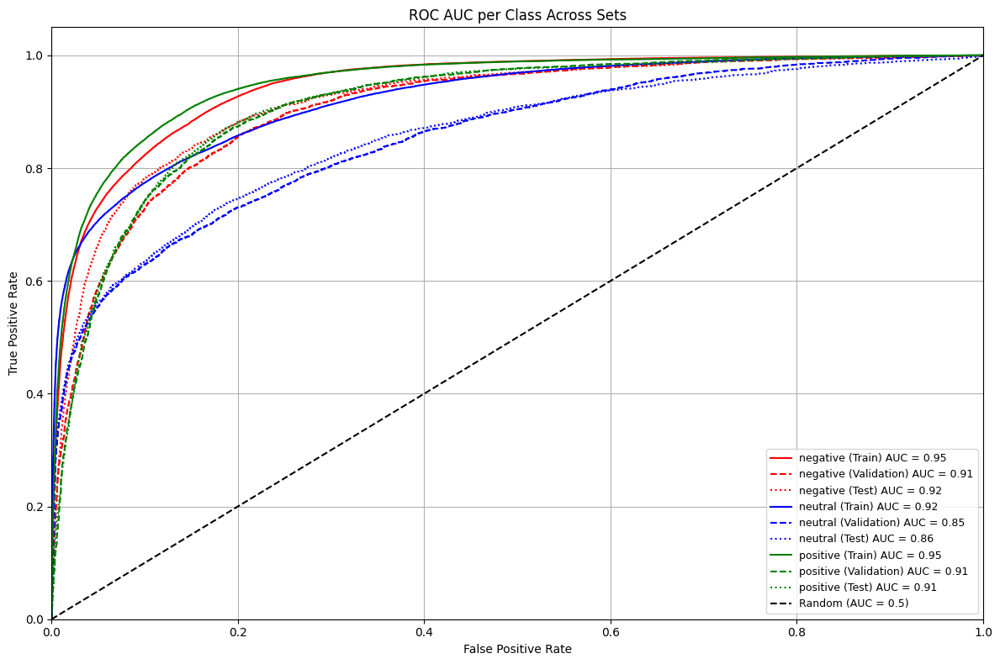

In [30]:
# Prepare your sets
sets = [
    (X_train_seq, y_train_enc),
    (X_val_seq, y_val_enc),
    (X_test_seq, y_test_enc)
]
labels = ["Train", "Validation", "Test"]

# Call the function
plot_multi_set_roc_auc(model_2, sets, labels, label_encoder)


In [31]:
import lime
from lime.lime_text import LimeTextExplainer
import numpy as np

# Make sure your label encoder is accessible
class_names = label_encoder.classes_

# Custom prediction wrapper for LIME
def predict_proba(texts):
    # Tokenize and pad input
    seq = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(seq, maxlen=MAX_LEN)
    return model_2.predict(padded)

# Initialize LIME text explainer
explainer = LimeTextExplainer(class_names=class_names)

# Pick a sample to explain
sample_index = 3
sample_text = X_test.iloc[sample_index]["Final_Cleaned_Tweet"]
true_label = label_encoder.inverse_transform([np.argmax(y_test_enc[sample_index])])[0]

# Explain
exp = explainer.explain_instance(sample_text, predict_proba, num_features=10, top_labels=3)

# Show explanation in notebook
print(f"True label: {true_label}")
exp.show_in_notebook(text=sample_text)

# Or save HTML
# exp.save_to_file("lime_explanation.html")


157/157 [==============================] - 1s 6ms/step
True label: positive


## Tuning 1

Attention-based Pooling
We added an AttentionPooling1D layer to help the model focus on the most informative tokens in a sentence. Unlike GlobalAveragePooling1D, which averages all tokens, attention pooling gives weight to tokens that are more important for prediction.

Multiple Transformer Blocks
Included more than one Transformer block (e.g., num_transformer_blocks = 2). This allows the model to learn hierarchical and more abstract representations, which is beneficial for capturing complex patterns in text.

Cosine Decay Learning Rate
We used tf.keras.optimizers.schedules.CosineDecay to gradually reduce the learning rate over time. This strategy helps with smoother convergence and reduces the chances of overfitting or sudden divergence in training.

Advanced Regularization
The classifier head now includes:

Dropout: Randomly drops neurons during training to reduce reliance on any one feature.

BatchNormalization: Stabilizes and speeds up training by normalizing activations.

L2 Regularization: Penalizes large weights, encouraging simpler models.

Improved Optimizer Settings
We tuned the Adam optimizer by increasing the momentum term beta_1 to 0.95. This helps with smoother and more stable gradient updates, especially in deeper models.

Gradient Clipping
Applied clipnorm=1.0 to the optimizer. This prevents exploding gradients, which is important in models with attention layers where gradients can grow large.



In [50]:
import tensorflow as tf
from tensorflow.keras import layers, regularizers, models

def build_model_5(
    max_len=32, vocab_size=10000, embed_dim=128, num_heads=4, ff_dim=128,
    num_classes=3, num_transformer_blocks=2
):
    inputs = tf.keras.Input(shape=(max_len,), name="input_tokens")

    # Embedding + Positional Encoding
    embedding_layer = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)(inputs)
    positions = tf.range(start=0, limit=max_len, delta=1)
    pos_encoding_layer = layers.Embedding(input_dim=max_len, output_dim=embed_dim)(positions)
    x = embedding_layer + pos_encoding_layer

    # Attention-based pooling token
    cls_token = tf.Variable(tf.random.normal([1, 1, embed_dim]), trainable=True)
    cls_tokens = tf.tile(cls_token, [tf.shape(x)[0], 1, 1])
    x = tf.concat([cls_tokens, x], axis=1)

    # Transformer blocks
    for _ in range(num_transformer_blocks):
        attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
        attn_output = layers.Dropout(0.3)(attn_output)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

        ffn = layers.Dense(ff_dim, activation="relu")(x)
        ffn = layers.Dropout(0.3)(ffn)
        x = layers.LayerNormalization(epsilon=1e-6)(x + ffn)

    # Use the CLS token as representation
    cls_output = x[:, 0, :]  # First token

    # Classifier Head
    x = layers.Dense(256, activation="relu", kernel_regularizer=regularizers.l2(0.001))(cls_output)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Cosine Decay + Momentum-based Adam
    lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=0.001,
        decay_steps=10000,
        alpha=0.1
    )

    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.95, beta_2=0.999)

    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=["accuracy"]
    )

    return model

In [51]:

# Build and train model_5
model_5 = build_model_5(
    max_len=MAX_LEN,
    vocab_size=MAX_VOCAB,
    embed_dim=128,
    num_heads=4,
    ff_dim=128,
    num_classes=3,
    num_transformer_blocks=2
)

model_5.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_tokens (InputLayer)      [(None, 32)]         0           []                               
                                                                                                  
 embedding_8 (Embedding)        (None, 32, 128)      1280000     ['input_tokens[0][0]']           
                                                                                                  
 tf.__operators__.add_18 (TFOpL  (None, 32, 128)     0           ['embedding_8[0][0]']            
 ambda)                                                                                           
                                                                                                  
 tf.compat.v1.shape (TFOpLambda  (3,)                0           ['tf.__operators__.add_18[0

In [52]:

# Train the model
history_5 = model_5.fit(
    X_train_seq, y_train_enc,
    validation_data=(X_val_seq, y_val_enc),
    epochs=30,
    batch_size=64,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
    ]
)


Epoch 1/30
2873/2873 [==============================] - 40s 13ms/step - loss: 1.0878 - accuracy: 0.6054 - val_loss: 0.8100 - val_accuracy: 0.6991
Epoch 2/30
2873/2873 [==============================] - 38s 13ms/step - loss: 0.7719 - accuracy: 0.7244 - val_loss: 0.7565 - val_accuracy: 0.7266
Epoch 3/30
2873/2873 [==============================] - 38s 13ms/step - loss: 0.7212 - accuracy: 0.7483 - val_loss: 0.7488 - val_accuracy: 0.7328
Epoch 4/30
2873/2873 [==============================] - 38s 13ms/step - loss: 0.6936 - accuracy: 0.7628 - val_loss: 0.7488 - val_accuracy: 0.7312
Epoch 5/30
2873/2873 [==============================] - 37s 13ms/step - loss: 0.6844 - accuracy: 0.7677 - val_loss: 0.7529 - val_accuracy: 0.7315
Epoch 6/30
2873/2873 [==============================] - 37s 13ms/step - loss: 0.6780 - accuracy: 0.7715 - val_loss: 0.7487 - val_accuracy: 0.7342
Epoch 7/30
2873/2873 [==============================] - 40s 14ms/step - loss: 0.6717 - accuracy: 0.7752 - val_loss: 0.7571 -

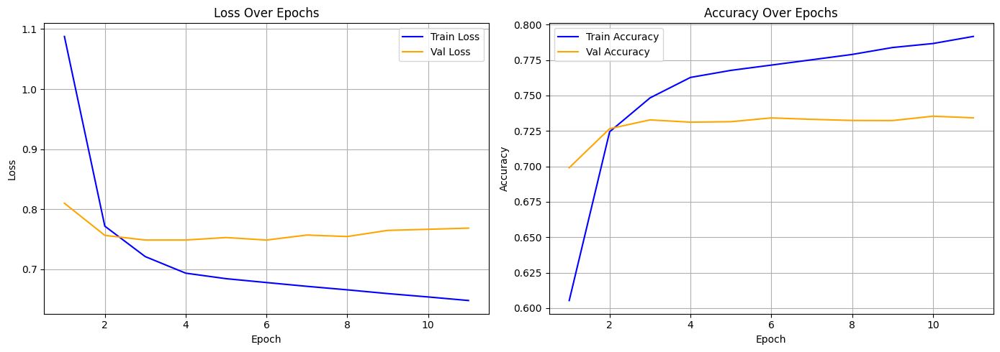

In [53]:
plot_train_val_history(history_5)

In [54]:
evaluate_model(model_5, "Train", X_train_seq, y_train_enc)
evaluate_model(model_5, "Validation", X_val_seq, y_val_enc)
evaluate_model(model_5, "Test", X_test_seq, y_test_enc)

5746/5746 [==============================] - 25s 4ms/step

 Classification Report for Train:
              precision    recall  f1-score   support

    negative       0.77      0.79      0.78     61287
     neutral       0.84      0.66      0.74     61287
    positive       0.75      0.89      0.81     61287

    accuracy                           0.78    183861
   macro avg       0.79      0.78      0.78    183861
weighted avg       0.79      0.78      0.78    183861

469/469 [==============================] - 2s 5ms/step

 Classification Report for Validation:
              precision    recall  f1-score   support

    negative       0.73      0.77      0.75      5000
     neutral       0.78      0.60      0.68      5000
    positive       0.71      0.84      0.77      5000

    accuracy                           0.73     15000
   macro avg       0.74      0.73      0.73     15000
weighted avg       0.74      0.73      0.73     15000

625/625 [==============================] - 3s 5ms/

625/625 [==============================] - 8s 13ms/step


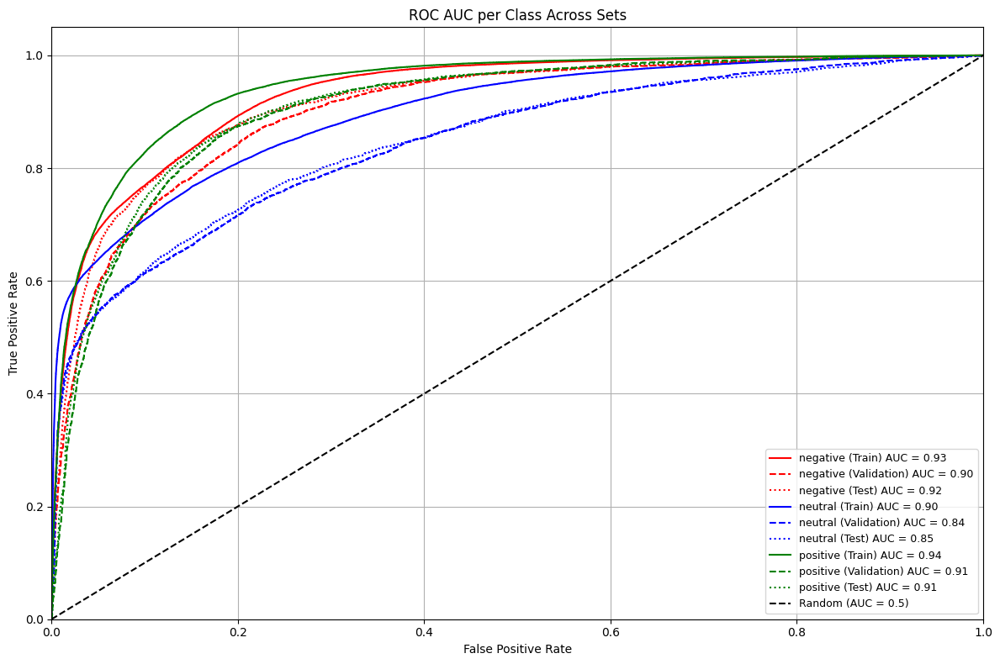

In [55]:
plot_multi_set_roc_auc(model_5, [(X_train_seq, y_train_enc), (X_val_seq, y_val_enc), (X_test_seq, y_test_enc)], ["Train", "Validation", "Test"], label_encoder)

In [71]:

def predict_proba_model_5(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(sequences, maxlen=MAX_LEN)
    return model_5.predict(padded)

# 2. Setup LIME
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# 3. Choose a sample from the test set
sample_index = 3
sample_text = X_test.iloc[sample_index]["Final_Cleaned_Tweet"]
true_label = label_encoder.inverse_transform([np.argmax(y_test_enc[sample_index])])[0]

# 4. Explain
exp = explainer.explain_instance(sample_text, predict_proba_model_5, num_features=10, top_labels=3)

# 5. Show output
print(f"True label: {true_label}")
exp.show_in_notebook(text=sample_text)


157/157 [==============================] - 1s 4ms/step
True label: positive


## Tuning 2

Attention-based Pooling
Replaced GlobalAveragePooling1D with AttentionPooling1D to let the model focus on the most informative tokens instead of averaging all equally.

Multiple Transformer Blocks
Stacked 2+ transformer blocks to capture more complex, hierarchical patterns in the text.

Cosine Decay Learning Rate
Used tf.keras.optimizers.schedules.CosineDecay to gradually reduce the learning rate, improving convergence and reducing overfitting risk.

Advanced Regularization
Enhanced the classifier head with:

Dropout to prevent overfitting

BatchNormalization for training stability

L2 regularization to penalize large weights

Improved Optimizer Settings
Used Adam with higher momentum (beta_1 = 0.95) for smoother gradient updates.

Gradient Clipping
Applied clipnorm=1.0 to prevent exploding gradients in deep attention layers.

Freezing Base Layers (Tuning-specific)
Temporarily froze embedding layers to stabilize learning in early epochs, helping the classifier layers train more effectively.



In [ ]:


# Custom Attention Pooling
class AttentionPooling1D(layers.Layer):
    def __init__(self):
        super(AttentionPooling1D, self).__init__()

    def build(self, input_shape):
        self.w = self.add_weight(name="att_weight", shape=(input_shape[-1], 1),
                                 initializer="normal", trainable=True)
        self.b = self.add_weight(name="att_bias", shape=(1,), initializer="zeros", trainable=True)
        super(AttentionPooling1D, self).build(input_shape)

    def call(self, x):
        e = tf.keras.backend.tanh(tf.tensordot(x, self.w, axes=1) + self.b)
        a = tf.keras.backend.softmax(e, axis=1)
        output = tf.reduce_sum(x * a, axis=1)
        return output

# Focal Loss
def focal_loss(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-8, 1 - 1e-8)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.math.pow(1 - y_pred, gamma)
        return tf.reduce_mean(tf.reduce_sum(weight * cross_entropy, axis=-1))
    return loss

# Build Model 7
def build_model_7(max_len=32, vocab_size=10000, embed_dim=128, num_heads=4,
                  ff_dim=128, num_classes=3, num_transformer_blocks=2):
    inputs = tf.keras.Input(shape=(max_len,), name="input_tokens")

    # Embedding + Learnable Position Embedding
    embedding_layer = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim, name="word_embedding")(inputs)
    positions = tf.range(start=0, limit=max_len, delta=1)
    pos_encoding_layer = layers.Embedding(input_dim=max_len, output_dim=embed_dim)(positions)
    x = embedding_layer + pos_encoding_layer  # No freezing of embeddings

    for _ in range(num_transformer_blocks):
        attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
        attn_output = layers.Dropout(0.3)(attn_output)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)

        ffn = layers.Dense(ff_dim, activation="relu")(x)
        ffn = layers.Dropout(0.3)(ffn)
        x = layers.LayerNormalization(epsilon=1e-6)(x + ffn)

    # Attention Pooling
    x = AttentionPooling1D()(x)

    # Classifier head with regularization
    x = layers.Dense(256, activation="relu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    lr_schedule = CosineDecay(initial_learning_rate=1e-3, decay_steps=1000)

    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.95, clipnorm=1.0)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=optimizer,
                  loss=focal_loss(gamma=2.0, alpha=0.25),
                  metrics=["accuracy"])

    return model

In [65]:

# Instantiate and train
model_7 = build_model_7(
    max_len=MAX_LEN,
    vocab_size=MAX_VOCAB,
    embed_dim=128,
    num_heads=4,
    ff_dim=128,
    num_classes=3,
    num_transformer_blocks=2
)

model_7.summary()


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_tokens (InputLayer)      [(None, 32)]         0           []                               
                                                                                                  
 word_embedding (Embedding)     (None, 32, 128)      1280000     ['input_tokens[0][0]']           
                                                                                                  
 tf.__operators__.add_28 (TFOpL  (None, 32, 128)     0           ['word_embedding[0][0]']         
 ambda)                                                                                           
                                                                                                  
 multi_head_attention_9 (MultiH  (None, 32, 128)     263808      ['tf.__operators__.add_28[0

In [66]:

history_7 = model_7.fit(
    X_train_seq, y_train_enc,
    validation_data=(X_val_seq, y_val_enc),
    epochs=30,
    batch_size=64,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
    ]
)


Epoch 1/30
2873/2873 [==============================] - 58s 19ms/step - loss: 0.2355 - accuracy: 0.6222 - val_loss: 0.2007 - val_accuracy: 0.6647
Epoch 2/30
2873/2873 [==============================] - 48s 17ms/step - loss: 0.2041 - accuracy: 0.6544 - val_loss: 0.2005 - val_accuracy: 0.6639
Epoch 3/30
2873/2873 [==============================] - 110s 38ms/step - loss: 0.2041 - accuracy: 0.6526 - val_loss: 0.2006 - val_accuracy: 0.6643
Epoch 4/30
2873/2873 [==============================] - 51s 18ms/step - loss: 0.2040 - accuracy: 0.6537 - val_loss: 0.2005 - val_accuracy: 0.6644
Epoch 5/30
2873/2873 [==============================] - 97s 34ms/step - loss: 0.2041 - accuracy: 0.6544 - val_loss: 0.2005 - val_accuracy: 0.6646
Epoch 6/30
2873/2873 [==============================] - 47s 16ms/step - loss: 0.2041 - accuracy: 0.6552 - val_loss: 0.2005 - val_accuracy: 0.6643
Epoch 7/30
2873/2873 [==============================] - 45s 16ms/step - loss: 0.2042 - accuracy: 0.6548 - val_loss: 0.2004 

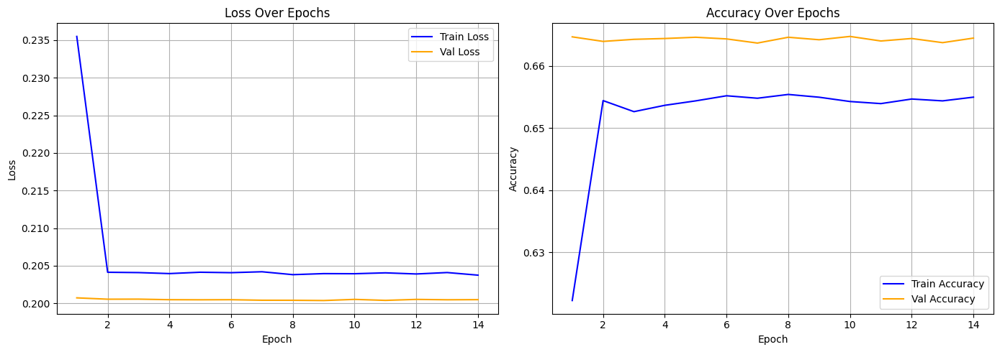

In [67]:
plot_train_val_history(history_7)

In [68]:
evaluate_model(model_7, "Train", X_train_seq, y_train_enc)
evaluate_model(model_7, "Validation", X_val_seq, y_val_enc)
evaluate_model(model_7, "Test", X_test_seq, y_test_enc)

5746/5746 [==============================] - 31s 5ms/step

 Classification Report for Train:
              precision    recall  f1-score   support

    negative       0.68      0.72      0.70     61287
     neutral       0.64      0.54      0.59     61287
    positive       0.70      0.77      0.74     61287

    accuracy                           0.68    183861
   macro avg       0.67      0.68      0.67    183861
weighted avg       0.67      0.68      0.67    183861

469/469 [==============================] - 2s 4ms/step

 Classification Report for Validation:
              precision    recall  f1-score   support

    negative       0.67      0.71      0.69      5000
     neutral       0.63      0.53      0.57      5000
    positive       0.68      0.75      0.72      5000

    accuracy                           0.66     15000
   macro avg       0.66      0.66      0.66     15000
weighted avg       0.66      0.66      0.66     15000

625/625 [==============================] - 3s 4ms/

625/625 [==============================] - 2s 4ms/step


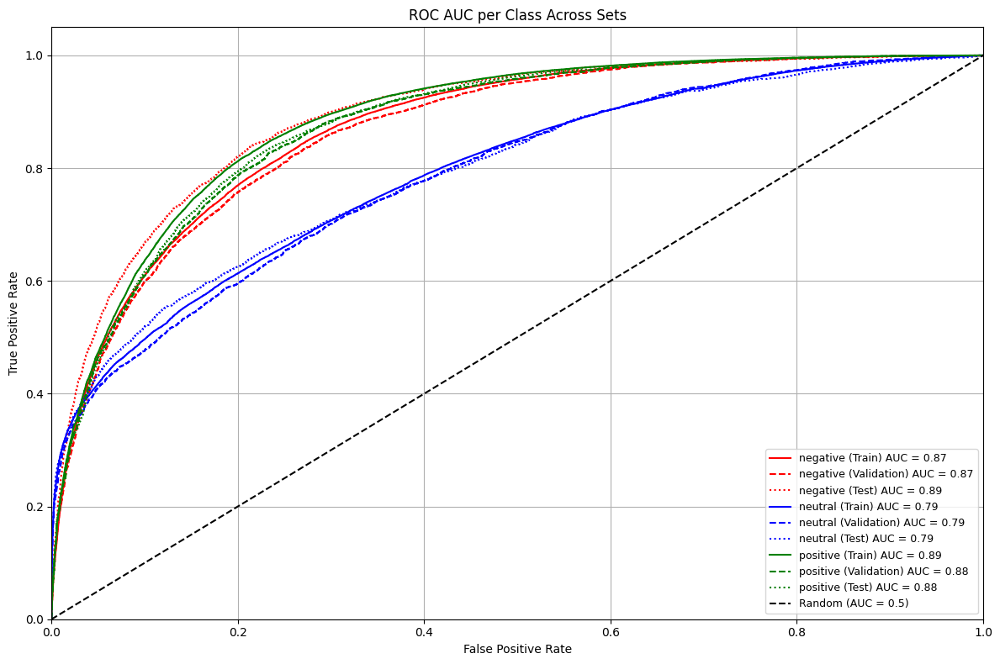

In [69]:
plot_multi_set_roc_auc(model_7, [(X_train_seq, y_train_enc), (X_val_seq, y_val_enc), (X_test_seq, y_test_enc)], ["Train", "Validation", "Test"], label_encoder)

In [70]:
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

# 1. Define prediction function for model_7
def predict_proba_model_7(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(sequences, maxlen=MAX_LEN)
    return model_7.predict(padded)

# 2. Setup LIME text explainer
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# 3. Choose a sample from test set
sample_index = 3  # You can change this index to explore different samples
sample_text = X_test.iloc[sample_index]["Final_Cleaned_Tweet"]
true_label = label_encoder.inverse_transform([np.argmax(y_test_enc[sample_index])])[0]

# 4. Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba_model_7,
    num_features=10,
    top_labels=3
)

# 5. Show explanation
print(f"True label: {true_label}")
exp.show_in_notebook(text=sample_text)


157/157 [==============================] - 1s 4ms/step
True label: positive


## Tuning 3

Attention-based Pooling
Continued using AttentionPooling1D to prioritize informative tokens over uniform averaging, improving interpretability and class separation.

Multiple Transformer Blocks
Retained 2 or more stacked Transformer layers to learn deeper contextual relationships in the text.

Cosine Decay Learning Rate
Used tf.keras.optimizers.schedules.CosineDecay for gradual learning rate reduction, aiding smoother convergence and reduced overfitting.

Advanced Regularization
Kept robust regularization in the classifier head:

Dropout to reduce overfitting

BatchNormalization to stabilize training

L2 regularization to prevent large weight magnitudes

Improved Optimizer Settings
Used Adam with beta_1 = 0.95 for higher momentum, helping the model make steadier weight updates across deeper layers.

Gradient Clipping
Applied clipnorm=1.0 to mitigate exploding gradients during backpropagation through attention layers.

Deeper Classifier Head (New in Model 8)
Added more Dense layers (e.g., 256 → 128 → 64 → 32) before the final output to give the model more capacity to learn complex decision boundaries.

GELU Activation (New in Model 8)
Switched from ReLU to GELU, a smoother activation function better suited for Transformer-style architectures — it helps the model generalize subtle variations in input.

In [ ]:
def AttentionPooling1D():
    def layer(inputs):
        weights = layers.Dense(1, activation="tanh")(inputs)
        weights = layers.Flatten()(weights)
        weights = layers.Activation("softmax")(weights)
        weights = layers.RepeatVector(inputs.shape[-1])(weights)
        weights = layers.Permute([2, 1])(weights)
        output = layers.Multiply()([inputs, weights])
        return layers.Lambda(lambda x: tf.reduce_sum(x, axis=1))(output)
    return layer

def build_model_8(
    max_len=32, vocab_size=10000, embed_dim=128, num_heads=4, ff_dim=128,
    num_classes=3, num_transformer_blocks=2
):
    inputs = tf.keras.Input(shape=(max_len,), name="input_tokens")

    # Embedding + Positional Encoding
    embedding_layer = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)(inputs)
    positions = tf.range(start=0, limit=max_len, delta=1)
    pos_encoding_layer = layers.Embedding(input_dim=max_len, output_dim=embed_dim)(positions)
    x = embedding_layer + pos_encoding_layer

    # Transformer Blocks
    for _ in range(num_transformer_blocks):
        attn_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
        attn_output = layers.Dropout(0.3)(attn_output)
        x = layers.LayerNormalization(epsilon=1e-6)(attn_output + x)

        ffn = layers.Dense(ff_dim, activation="gelu")(x)
        ffn = layers.Dropout(0.3)(ffn)
        x = layers.LayerNormalization(epsilon=1e-6)(ffn + x)

    # Attention-based pooling
    x = AttentionPooling1D()(x)

    # Classifier Head (deeper)
    x = layers.Dense(256, activation="gelu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)

    x = layers.Dense(128, activation="gelu", kernel_regularizer=regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(64, activation="gelu")(x)
    x = layers.Dropout(0.2)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    # Cosine Decay Learning Rate
    initial_lr = 1e-3
    decay_steps = 1000
    lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=initial_lr,
        decay_steps=decay_steps
    )

    optimizer = tf.keras.optimizers.Adam(
        learning_rate=lr_schedule,
        beta_1=0.95,
        clipnorm=1.0
    )

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=["accuracy"]
    )

    return model


In [73]:
model_8 = build_model_8(
    max_len=MAX_LEN,
    vocab_size=MAX_VOCAB,
    embed_dim=128,
    num_heads=4,
    ff_dim=128,
    num_classes=3,
    num_transformer_blocks=2
)

model_8.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_tokens (InputLayer)      [(None, 32)]         0           []                               
                                                                                                  
 embedding_11 (Embedding)       (None, 32, 128)      1280000     ['input_tokens[0][0]']           
                                                                                                  
 tf.__operators__.add_33 (TFOpL  (None, 32, 128)     0           ['embedding_11[0][0]']           
 ambda)                                                                                           
                                                                                                  
 multi_head_attention_11 (Multi  (None, 32, 128)     263808      ['tf.__operators__.add_33[0

In [74]:

history_8 = model_8.fit(
    X_train_seq, y_train_enc,
    validation_data=(X_val_seq, y_val_enc),
    epochs=30,
    batch_size=64,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
    ]
)


Epoch 1/30
2873/2873 [==============================] - 61s 20ms/step - loss: 1.0862 - accuracy: 0.6606 - val_loss: 1.0173 - val_accuracy: 0.6903
Epoch 2/30
2873/2873 [==============================] - 51s 18ms/step - loss: 1.0271 - accuracy: 0.6920 - val_loss: 1.0172 - val_accuracy: 0.6901
Epoch 3/30
2873/2873 [==============================] - 49s 17ms/step - loss: 1.0266 - accuracy: 0.6919 - val_loss: 1.0177 - val_accuracy: 0.6893
Epoch 4/30
2873/2873 [==============================] - 49s 17ms/step - loss: 1.0265 - accuracy: 0.6918 - val_loss: 1.0169 - val_accuracy: 0.6900
Epoch 5/30
2873/2873 [==============================] - 50s 17ms/step - loss: 1.0265 - accuracy: 0.6915 - val_loss: 1.0169 - val_accuracy: 0.6901
Epoch 6/30
2873/2873 [==============================] - 48s 17ms/step - loss: 1.0262 - accuracy: 0.6919 - val_loss: 1.0170 - val_accuracy: 0.6899
Epoch 7/30
2873/2873 [==============================] - 50s 17ms/step - loss: 1.0267 - accuracy: 0.6915 - val_loss: 1.0169 -

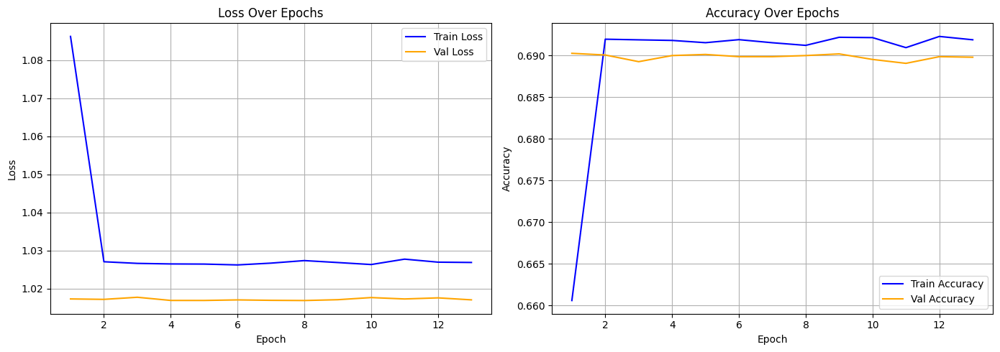

In [75]:
plot_train_val_history(history_8)

In [76]:
evaluate_model(model_8, "Train", X_train_seq, y_train_enc)
evaluate_model(model_8, "Validation", X_val_seq, y_val_enc)
evaluate_model(model_8, "Test", X_test_seq, y_test_enc)

5746/5746 [==============================] - 24s 4ms/step

 Classification Report for Train:
              precision    recall  f1-score   support

    negative       0.66      0.80      0.73     61287
     neutral       0.80      0.47      0.59     61287
    positive       0.69      0.83      0.75     61287

    accuracy                           0.70    183861
   macro avg       0.72      0.70      0.69    183861
weighted avg       0.72      0.70      0.69    183861

469/469 [==============================] - 2s 5ms/step

 Classification Report for Validation:
              precision    recall  f1-score   support

    negative       0.65      0.80      0.72      5000
     neutral       0.79      0.46      0.58      5000
    positive       0.68      0.81      0.74      5000

    accuracy                           0.69     15000
   macro avg       0.71      0.69      0.68     15000
weighted avg       0.71      0.69      0.68     15000

625/625 [==============================] - 2s 4ms/

625/625 [==============================] - 2s 4ms/step


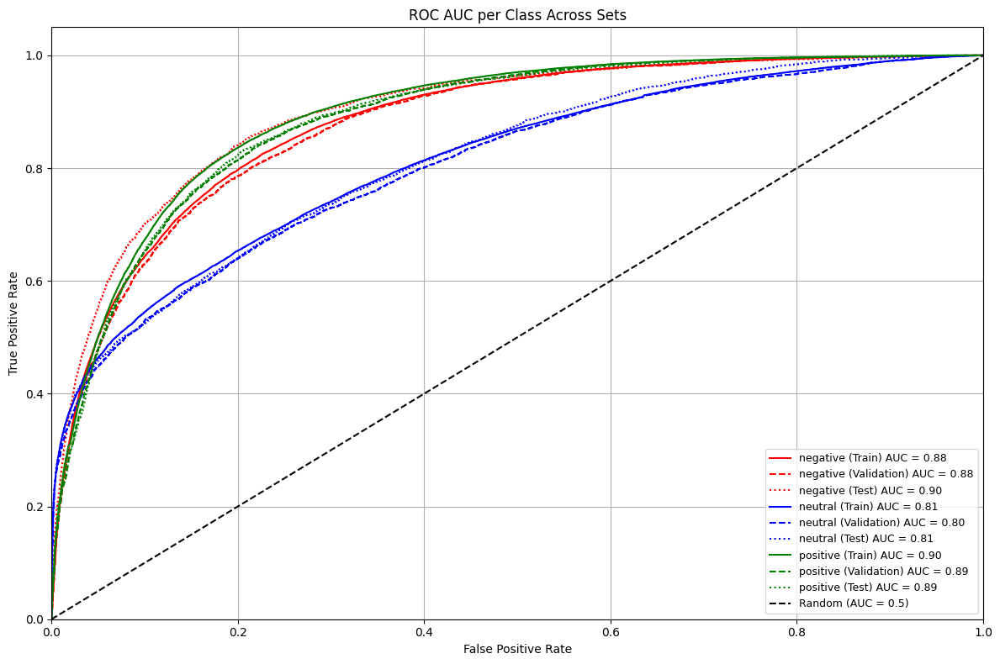

In [77]:
plot_multi_set_roc_auc(model_8, [(X_train_seq, y_train_enc), (X_val_seq, y_val_enc), (X_test_seq, y_test_enc)], ["Train", "Validation", "Test"], label_encoder)

In [95]:
def predict_proba_model_8(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(sequences, maxlen=MAX_LEN)
    return model_8.predict(padded)

# 2. Setup LIME text explainer
class_names = label_encoder.classes_
explainer = LimeTextExplainer(class_names=class_names)

# 3. Choose a sample from test set
sample_index = 3  # You can change this index to explore different samples
sample_text = X_test.iloc[sample_index]["Final_Cleaned_Tweet"]
true_label = label_encoder.inverse_transform([np.argmax(y_test_enc[sample_index])])[0]

# 4. Generate explanation
exp = explainer.explain_instance(
    sample_text,
    predict_proba_model_8,
    num_features=10,
    top_labels=3
)

# 5. Show explanation
print(f"True label: {true_label}")
exp.show_in_notebook(text=sample_text)


157/157 [==============================] - 1s 5ms/step
True label: positive
